# VERSION REFERENCE à améliorer

## CODE

In [1]:
# menu.py
# ==============================================================================
def display_menu():
    """Displays the improved model selection menu."""
    print("\n" + "="*60)
    print("MODEL SELECTION MENU")
    print("="*60)
    print("--- Individual Models ---")
    print(" 1 : Run SISO")
    print(" 2 : Run MIMO")
    print(" 3 : Run MIMO-MH")
    print("\n--- Reconciled (REC) Models Only ---")
    print(" 4 : Run SISO-REC")
    print(" 5 : Run MIMO-REC")
    print(" 6 : Run MIMO-MH-REC")
    print("\n--- Combined Models (Base + Reconciled) ---")
    print(" 7 : Run SISO (Base + REC)")
    print(" 8 : Run MIMO (Base + REC)")
    print(" 9 : Run MIMO-MH (Base + REC)")
    print(" 10 : Run ALL ELM models (Base + REC)")
    print("\n--- External Models & Groups ---")
    print(" 11 : Run Prophet + TimeGPT")
    print(" 12 : Run ALL models (ELM Base + External)")
    print(" 13 : Run ALL models (ELM REC + External)")
    print("\n--- Custom ---")
    print(" 14 : Custom model selection")
    print("="*60)

def get_user_choice(max_choice):
    """Gets and validates the user's menu choice."""
    while True:
        try:
            choice = int(input(f"Please enter your choice (1-{max_choice}): "))
            if 1 <= choice <= max_choice:
                return choice
            else:
                print(f"Invalid choice. Please enter a number between 1 and {max_choice}.")
        except ValueError:
            print("Invalid input. Please enter a number.")

def get_custom_model_selection():
    """Allows for custom selection of models and reconciliation."""
    available_models = {
        1: "siso", 2: "mimo", 3: "mimo-mh",
        4: "prophet", 5: "timegpt"
    }
    elm_models = {"siso", "mimo", "mimo-mh"}
    
    print("\n" + "="*50)
    print("CUSTOM MODEL SELECTION")
    print("="*50)
    
    print("Available models:")
    for key, model in available_models.items():
        print(f"{key}: {model.upper()}")
        
    selected_models = []
    while True:
        try:
            choices_str = input("\nEnter the numbers of the models to run, separated by a comma (e.g., 1,3,4): ")
            choices = [int(c.strip()) for c in choices_str.split(',') if c.strip()]
            if all(c in available_models for c in choices):
                break
            else:
                print("One or more numbers are invalid. Please try again.")
        except ValueError:
            print("Invalid input. Make sure to enter numbers separated by commas.")

    models_to_run = []
    for choice in sorted(list(set(choices))): # Use sorted unique choices
        model_name = available_models[choice]
        if model_name in elm_models:
            while True:
                # Added 'b' for 'both' option
                rec_choice = input(f"  For {model_name.upper()}, run base, reconciled, or both? (n/y/b): ").lower()
                if rec_choice == 'n': # No
                    models_to_run.append((model_name, False))
                    break
                elif rec_choice == 'y': # Yes
                    models_to_run.append((model_name, True))
                    break
                elif rec_choice == 'b': # Both
                    models_to_run.append((model_name, False)) # Base version
                    models_to_run.append((model_name, True))  # Reconciled version
                    break
                else:
                    print("  Invalid response. Please enter 'n' (no), 'y' (yes), or 'b' (both).")
        else:
            models_to_run.append((model_name, False)) # Reconciliation not applicable
            
    selected_names = [f"{name.upper()}{'-REC' if rec else ''}" for name, rec in models_to_run]
    print(f"\nSelected models: {', '.join(selected_names)}")
    return models_to_run

def select_models():
    """
    Interactive function to select which models to run via the menu.
    Returns a list of tuples: (model_name, reconciliation_flag).
    """
    display_menu()
    user_choice = get_user_choice(14)
    
    # Model shortcuts
    siso, siso_rec = ('siso', False), ('siso', True)
    mimo, mimo_rec = ('mimo', False), ('mimo', True)
    mimo_mh, mimo_mh_rec = ('mimo-mh', False), ('mimo-mh', True)
    prophet, timegpt = ('prophet', False), ('timegpt', False)

    # --- Individual Models ---
    if user_choice == 1: return [siso]
    elif user_choice == 2: return [mimo]
    elif user_choice == 3: return [mimo_mh]
    
    # --- Reconciled (REC) Models Only ---
    elif user_choice == 4: return [siso_rec]
    elif user_choice == 5: return [mimo_rec]
    elif user_choice == 6: return [mimo_mh_rec]
    
    # --- Combined Models (Base + Reconciled) ---
    elif user_choice == 7: return [siso, siso_rec]
    elif user_choice == 8: return [mimo, mimo_rec]
    elif user_choice == 9: return [mimo_mh, mimo_mh_rec]
    elif user_choice == 10: return [siso, siso_rec, mimo, mimo_rec, mimo_mh, mimo_mh_rec]

    # --- External Models & Groups ---
    elif user_choice == 11: return [prophet, timegpt]
    elif user_choice == 12: return [siso, mimo, mimo_mh, prophet, timegpt]
    elif user_choice == 13: return [siso_rec, mimo_rec, mimo_mh_rec, prophet, timegpt]
    
    # --- Custom ---
    elif user_choice == 14: return get_custom_model_selection()
    
    return []

In [2]:
# timegpt.py
# ==============================================================================
# Placeholder for loading TimeGPT results.
import numpy as np
import pandas as pd
import os


def load_timegpt_metrics():
    # Modified to load a single metrics CSV file instead of multiple forecast files
    file_path = "metrics_with_tgpt_8000S.csv"
    if os.path.exists(file_path):
        metrics_df = pd.read_csv(file_path)
    else:
        print(f"      - Warning: Metrics file not found at {file_path}")
        metrics_df = None
    return metrics_df



In [3]:
# utils.py
# ==============================================================================
# Utility functions for data loading and preprocessing.
import unicodedata
import re
import pandas as pd
import numpy as np
from pathlib import Path
from numpy.lib.stride_tricks import sliding_window_view

def slugify(col: str) -> str:
    """Converts a string to a slug-like format (lowercase, underscores)."""
    col = unicodedata.normalize("NFKD", col).encode("ascii", "ignore").decode()
    col = re.sub(r"[^\w\s-]", "", col).strip().lower().replace(" ", "_")
    return col

def load_and_preprocess_data(
    file_path: Path,
    date_col: str = "Date",
    drop_policy: str = "mean", # "first", "last" or "mean"
) -> pd.DataFrame:
    """
    Load a CSV, normalize column names, create 'ds' from `date_col`,
    and deduplicate on 'ds' according to `drop_policy`.
    Returns a DataFrame with a unique, sorted 'ds' column.
    """
    print(">>> [Step 1/5] Loading and pre-processing data...")
    if not file_path.exists():
        raise FileNotFoundError(f"Data file not found at: {file_path}")
    
    df = pd.read_csv(file_path)
    # 1) normalize column names
    df.columns = [slugify(c) for c in df.columns]
    date_col = slugify(date_col)
    
    # 2) convert date → UTC
    df["ds"] = pd.to_datetime(df[date_col], utc=True)
    df = df.drop(columns=[date_col])
    
    # 3) handle duplicates on ds
    if drop_policy in ("first", "last"):
        before = len(df)
        df = df.drop_duplicates(subset="ds", keep=drop_policy)
        removed = before - len(df)
        if removed:
            print(f"    - {removed} duplicate(s) removed (keep='{drop_policy}').")
    elif drop_policy == "mean":
        df = df.groupby("ds", as_index=False).mean(numeric_only=True)
        print("    - Duplicates aggregated by taking the mean.")
    else:
        raise ValueError("drop_policy must be 'first', 'last' or 'mean'.")
    # 4) sort and reset index
    df = df.sort_values("ds").reset_index(drop=True)
    # 5) drop timezone if present
    if df["ds"].dt.tz is not None:
        df["ds"] = df["ds"].dt.tz_localize(None) # Make timezone-naive for compatibility
        
    print(f"    - Data loaded successfully: {len(df)} rows, {df.shape[1]} columns.")
    print(">>> [Step 1/5] Data loading complete.\n")
    return df

def prepare_data_mimo_mh(input_matrix, num_rows, max_horizon, window_size, num_outputs):
    """
    Build supervised learning matrices (X, Y) for MIMO multi-horizon training.

    SCENARIO
    --------
    • You have a multivariate time series in `input_matrix` with `num_rows` rows
      (time) and multiple columns (features/targets).
    • The first `num_outputs` columns correspond to the target variables
      you want to forecast (multi-output).
    • For each timestamp t, you want to predict the next `max_horizon` steps
      for those `num_outputs` targets.

    WINDOWING
    ---------
    • For each sample start t in [0, num_rows - window_size - max_horizon]:
        X_window = input_matrix[t : t + window_size, :].flatten()
        Y_window = input_matrix[t + window_size : t + window_size + max_horizon,
                                :num_outputs].flatten()
      X_window collects the *past* `window_size` frames (all features).
      Y_window concatenates the *future* `max_horizon` × `num_outputs`
      target block in time-major order.

    SHAPES
    ------
    • samples = num_rows - window_size - max_horizon + 1
    • X_windows.shape = (samples, window_size * n_features)
    • Y_windows.shape = (samples, max_horizon * num_outputs)

    Parameters
    ----------
    input_matrix : np.ndarray
        Full design matrix with time along axis 0. Must have at least `num_outputs`
        columns to slice target variables.
    num_rows : int
        Number of available time rows in `input_matrix`.
    max_horizon : int
        Maximum forecast horizon H (we will build targets for h = 1..H).
    window_size : int
        Number of lagged timesteps used as input context (sliding window length).
    num_outputs : int
        Number of target variables to forecast jointly.

    Returns
    -------
    X_windows, Y_windows : np.ndarray
        Flattened input windows and concatenated multi-horizon targets, ready for ELM.
    """
    samples = num_rows - window_size - max_horizon + 1
    # Input windows: [sample, flattened_window_features]
    X_windows = np.array([
        input_matrix[t : t + window_size].flatten()
        for t in range(samples)
    ])
    # Build Y as a concatenation of the future target block:
    # [ (t+1..t+H) × num_outputs ] flattened for each sample.
    Y_windows = np.array([
        input_matrix[t + window_size : t + window_size + max_horizon, :num_outputs].flatten()
        for t in range(samples)
    ])
    return X_windows, Y_windows

In [4]:
# elm.py
# ==============================================================================
# Extreme Learning Machine (ELM) model implementation.
from scipy.linalg import pinv
import numpy as np
import pandas as pd
from pathlib import Path

def train_elm(X_train, Y_train, X_test, Y_test,
              num_hidden=1000, num_initializations=1, lambda_reg=1e-6):
    """
    Train an ELM (Extreme Learning Machine) with Ridge-regularized linear readout.

    MODEL
    -----
    • Hidden layer: random affine transform + ReLU activation:
          H = ReLU( X_train @ W^T + b^T )
      where W ∈ R[num_hidden, n_features], b ∈ R[num_hidden, 1].
    • Output/readout layer (beta): closed-form ridge regression per output:
          (H^T H + λ I) β = H^T Y_train
      solved via np.linalg.solve; falls back to pseudo-inverse if needed.

    SEEDS / INITIALIZATIONS
    -----------------------
    • We draw new random W, b for each initialization and keep the one with the
      lowest validation RMSE on X_test/Y_test.
    • The number of tries is `num_initializations` (a.k.a. seeds / restarts).

    PREDICTIONS
    -----------
    • Test hidden: H_test = ReLU( X_test @ W^T + b^T )
    • Predictions:  Y_pred = H_test @ β
      (Your original code applies ReLU to the output as well and clips negatives
       to 0 via np.maximum; we keep that behavior.)

    METRIC
    ------
    • RMSE averaged across output dimensions:
          mean_h( sqrt( mean_t( (y_true - y_pred)^2 ) ) )

    External config expected (if args are None)
    -------------------------------------------
    NUM_INITIALIZATIONS = 1             # number of random initializations (seeds)
    N_HIDDEN = 1000                     # 1000 neurons
    LAMBDA_REG = 1e-6                   # regularization

    Returns
    -------
    best_model : tuple (W, b, beta)
        Parameters for the best run: weights, biases, and readout matrix.
    """
    best_rmse = float('inf')
    best_model = None
    for _ in range(num_initializations):
        # 1. Initialize random input weights (W) and biases (b)
        W = np.random.rand(num_hidden, X_train.shape[1])
        b = np.random.rand(num_hidden, 1)
        
        # 2. Calculate the hidden layer output matrix (H)
        H = np.maximum(0, X_train @ W.T + b.T) # ReLU activation
        
        # 3. Ridge-regularized closed-form solution for beta (output weights).
        HTH = H.T @ H               # (m, m)
        HTY = H.T @ Y_train         # (m, n_outputs or flattened dim)
        try:
            # More stable solution using solve
            beta = np.linalg.solve(HTH + lambda_reg * np.eye(HTH.shape[0]), HTY)
        except np.linalg.LinAlgError:
            # Fallback to Moore-Penrose pseudo-inverse if solve fails
            beta = pinv(H) @ Y_train
            
        # Evaluate this initialization on the test set
        H_test = np.maximum(0, X_test @ W.T + b.T)
        Y_pred = np.maximum(H_test @ beta, 0) # Ensure non-negative predictions
        rmse = np.mean(np.sqrt(np.mean((Y_test - Y_pred) ** 2, axis=0)))
        
        # Keep the best model
        if rmse < best_rmse:
            best_model = (W, b, beta)
            best_rmse = rmse
            
    return best_model

def predict_elm(X, model):
    """
    Forward pass for a trained ELM.

    Parameters
    ----------
    X : np.ndarray
        Feature matrix of shape (n_samples, n_features).
    model : tuple
        (W, b, beta) returned by `train_elm`.

    Returns
    -------
    Y_pred : np.ndarray
        Predicted targets. Uses the same ReLU on hidden and non-negativity clamp
        on outputs as in training selection.
    """
    W, b, beta = model
    H = np.maximum(0, X @ W.T + b.T)
    Y_pred = np.maximum(H @ beta, 0)
    return Y_pred

In [5]:
# models.py
# ==============================================================================
# Functions to run different forecasting strategies (SISO, MIMO, MIMO-MH).

import pandas as pd
import numpy as np
from numpy.lib.stride_tricks import sliding_window_view
from collections import defaultdict

# --- Import local modules
#from utils import prepare_data_mimo_mh
#from elm import train_elm, predict_elm
#from reconciliation import create_S_from_outputs, estimate_W_from_train_residuals, reconcile_all_horizons

def run_mimo_mh_all_horizons(
    df_all,
    split_date,
    output_names,
    max_horizon,
    window_size,
    elm_params, # Added to pass ELM hyperparameters
    reconcile=False
):
    """
    Train a true MIMO-MH model jointly predicting all horizons,
    and optionally apply MinT-Diagonal (WLS) hierarchical reconciliation.
    """
    model_name = "MIMO-MH-REC" if reconcile else "MIMO-MH"
    print(f"    - Running {model_name} model...")
    # ---------- Split train/test
    train_df = df_all[df_all['ds'] < split_date].copy()
    test_df  = df_all[df_all['ds'] >= split_date].copy()

    # ---------- Prepare matrices
    feature_cols = [c for c in df_all.columns if c != 'ds']
    input_matrix_train = train_df[feature_cols].fillna(0).values
    input_matrix_test  = test_df[feature_cols].fillna(0).values
    datetime_index_test = test_df['ds'].reset_index(drop=True)

    num_rows_train = input_matrix_train.shape[0]
    num_rows_test  = input_matrix_test.shape[0]
    num_outputs    = len(output_names)
    assert num_outputs == 1 + (create_S_from_outputs(output_names).shape[1]), \
        "output_names must be [total, bottoms...] to match S."

    # ---------- Build MIMO-MH datasets
    X_train, Y_train = prepare_data_mimo_mh(
        input_matrix_train, num_rows_train, max_horizon, window_size, num_outputs
    )
    X_test, Y_test = prepare_data_mimo_mh(
        input_matrix_test, num_rows_test, max_horizon, window_size, num_outputs
    )

    # ---------- Train ELM and predict
    model = train_elm(
        X_train, Y_train, X_test, Y_test,
        num_hidden=elm_params['n_hidden'],
        lambda_reg=elm_params['lambda_reg'],
        num_initializations=elm_params['n_init']
    )

    Y_pred_train = predict_elm(X_train, model)
    Y_pred_test  = predict_elm(X_test,  model)

    # ---------- Reshape to (samples, horizons, outputs)
    Y_train_mh = Y_train.reshape(-1, max_horizon, num_outputs)
    Y_test_mh  = Y_test.reshape(-1,  max_horizon, num_outputs)
    Y_pred_mh  = Y_pred_test.reshape(-1, max_horizon, num_outputs)

    # ---------- Optional reconciliation (MinT-Diagonal / WLS)
    Y_pred_reconciled = None
    if reconcile:
        print("        - Applying reconciliation...")
        S = create_S_from_outputs(output_names)
        Y_pred_train_mh = Y_pred_train.reshape(-1, max_horizon, num_outputs)
        W_list = estimate_W_from_train_residuals(Y_train_mh, Y_pred_train_mh, diagonal=True)
        Y_pred_reconciled = reconcile_all_horizons(Y_pred_mh, S, W_list)

        # Diagnostic: coherence improvement
        total_idx = 0
        raw_incoherence = np.mean(np.abs(Y_pred_mh[:, :, total_idx] - Y_pred_mh[:, :, 1:].sum(axis=2)))
        rec_incoherence = np.mean(np.abs(Y_pred_reconciled[:, :, total_idx] - Y_pred_reconciled[:, :, 1:].sum(axis=2)))
        print(f"        - Coherence Error |Total - sum(children)|: Raw={raw_incoherence:.4f} -> Reconciled={rec_incoherence:.4f}")

    # ---------- Build tidy result dataframe
    min_samples = Y_test_mh.shape[0]
    records = []
    for h in range(max_horizon):
        dt_h = datetime_index_test[window_size + h : window_size + h + min_samples]
        for sample_idx in range(min_samples):
            for o_idx, o_name in enumerate(output_names):
                row = {
                    'datetime': dt_h.iloc[sample_idx],
                    'horizon': h + 1,
                    'output': o_name,
                    'y_true': Y_test_mh[sample_idx, h, o_idx],
                    'y_pred': Y_pred_mh[sample_idx, h, o_idx]
                }
                if Y_pred_reconciled is not None:
                    row["y_pred_rec"] = float(Y_pred_reconciled[sample_idx, h, o_idx])
                records.append(row)
                
    print(f"    - {model_name} model finished.")
    df_mh = pd.DataFrame(records)
    return df_mh

def run_mimo_all_horizons(df_all, split_date, output_names, max_horizon, window_size, elm_params, reconcile=False):
    """Run MIMO model (one per horizon) and apply reconciliation as a post-processing step."""
    model_name = "MIMO-REC" if reconcile else "MIMO"
    print(f"    - Running {model_name} model...")
    input_matrix = df_all[output_names].values
    num_rows, num_outputs = len(df_all), len(output_names)
    datetime_index = pd.to_datetime(df_all['ds'])
    
    # --- Storage for assembling 3D arrays ---
    Y_true_train_list, Y_pred_train_list = [], []
    Y_true_test_list,  Y_pred_test_list  = [], []
    test_datetimes_list = []

    for h in range(1, max_horizon + 1):
        samples = num_rows - window_size - h + 1
        X_windows = np.array([input_matrix[t : t + window_size].flatten() for t in range(samples)])
        Y_windows = np.array([input_matrix[t + window_size + h - 1, :num_outputs] for t in range(samples)])
        
        sample_datetimes = datetime_index[window_size + h - 1 : window_size + h - 1 + samples]
        train_mask = sample_datetimes < pd.to_datetime(split_date)
        test_mask = ~train_mask
        
        X_train, Y_train = X_windows[train_mask], Y_windows[train_mask]
        X_test, Y_test = X_windows[test_mask], Y_windows[test_mask]
        
        model = train_elm(
            X_train, Y_train, X_test, Y_test, 
            num_hidden=elm_params['n_hidden'], 
            lambda_reg=elm_params['lambda_reg'],
            num_initializations=elm_params['n_init']
        )
        
        # Store predictions for both sets
        Y_pred_train_list.append(predict_elm(X_train, model))
        Y_pred_test_list.append(predict_elm(X_test, model))
        Y_true_train_list.append(Y_train)
        Y_true_test_list.append(Y_test)
        test_datetimes_list.append(sample_datetimes[test_mask])

    # --- Assemble forecasts into (samples, horizons, outputs) arrays ---
    # Find common number of samples to align arrays
    min_train_samples = min(len(y) for y in Y_true_train_list)
    min_test_samples = min(len(y) for y in Y_true_test_list)

    Y_true_train_mh = np.stack([y[:min_train_samples] for y in Y_true_train_list], axis=1)
    Y_pred_train_mh = np.stack([y[:min_train_samples] for y in Y_pred_train_list], axis=1)
    Y_true_test_mh  = np.stack([y[:min_test_samples] for y in Y_true_test_list], axis=1)
    Y_pred_test_mh  = np.stack([y[:min_test_samples] for y in Y_pred_test_list], axis=1)

    # --- Optional Reconciliation ---
    Y_pred_reconciled = None
    if reconcile:
        print("        - Applying reconciliation...")
        S = create_S_from_outputs(output_names)
        W_list = estimate_W_from_train_residuals(Y_true_train_mh, Y_pred_train_mh, diagonal=True)
        Y_pred_reconciled = reconcile_all_horizons(Y_pred_test_mh, S, W_list)

    # --- Build tidy DataFrame ---
    records = []
    for h_idx, h in enumerate(range(1, max_horizon + 1)):
        dt_h = test_datetimes_list[h_idx][:min_test_samples]
        for sample_idx in range(min_test_samples):
            for o_idx, o_name in enumerate(output_names):
                row = {'datetime': dt_h.iloc[sample_idx], 'horizon': h, 'output': o_name,
                       'y_true': Y_true_test_mh[sample_idx, h_idx, o_idx],
                       'y_pred': Y_pred_test_mh[sample_idx, h_idx, o_idx]}
                if Y_pred_reconciled is not None:
                    row["y_pred_rec"] = Y_pred_reconciled[sample_idx, h_idx, o_idx]
                records.append(row)

    print(f"    - {model_name} model finished.")
    return pd.DataFrame(records)

def run_siso_all_horizons(df_all, split_date, output_names, max_horizon, window_size, elm_params, reconcile=False):
    """Run SISO model (one per var/horizon) and apply reconciliation as a post-processing step."""
    model_name = "SISO-REC" if reconcile else "SISO"
    print(f"    - Running {model_name} model...")
    datetime_index = pd.to_datetime(df_all["ds"])
    T, H, W = len(df_all), int(max_horizon), int(window_size)
    
    # --- Storage for all predictions before assembling ---
    preds = defaultdict(lambda: defaultdict(dict)) # preds[set][horizon][output]

    for out_idx, out_name in enumerate(output_names):
        y = df_all[out_name].to_numpy()
        S = T - W - H + 1
        if S <= 0: continue
        X_all_windows = sliding_window_view(y, window_shape=W)[:S]
        
        for h in range(1, H + 1):
            Y_h = y[W + h - 1 : S + W + h - 1]
            datetimes_h = datetime_index[W + h - 1 : S + W + h - 1]
            train_mask = datetimes_h < pd.to_datetime(split_date)
            test_mask = ~train_mask
            
            if not np.any(train_mask) or not np.any(test_mask): continue

            X_train, Y_train = X_all_windows[train_mask], Y_h[train_mask].reshape(-1, 1)
            X_test, Y_test = X_all_windows[test_mask], Y_h[test_mask].reshape(-1, 1)
            
            model = train_elm(
                X_train, Y_train, X_test, Y_test, 
                num_hidden=elm_params['n_hidden'], 
                lambda_reg=elm_params['lambda_reg'],
                num_initializations=elm_params['n_init']
            )
            
            # Store all predictions
            preds['train'][h][out_name] = {'true': Y_train, 'pred': predict_elm(X_train, model)}
            preds['test'][h][out_name]  = {'true': Y_test,  'pred': predict_elm(X_test, model), 'dates': datetimes_h[test_mask]}

    # --- Assemble forecasts into (samples, horizons, outputs) arrays ---
    min_train_samples = min(len(d['true']) for h in range(1, H + 1) for o, d in preds['train'][h].items())
    min_test_samples = min(len(d['true']) for h in range(1, H + 1) for o, d in preds['test'][h].items())

    def assemble_array(dset, key):
        tensors_by_h = []
        for h in range(1, H + 1):
            tensors_by_o = [preds[dset][h][o][key][:min_train_samples if dset=='train' else min_test_samples] for o in output_names]
            tensors_by_h.append(np.hstack(tensors_by_o))
        return np.stack(tensors_by_h, axis=1)

    Y_true_train_mh = assemble_array('train', 'true')
    Y_pred_train_mh = assemble_array('train', 'pred')
    Y_true_test_mh  = assemble_array('test', 'true')
    Y_pred_test_mh  = assemble_array('test', 'pred')

    # --- Optional Reconciliation ---
    Y_pred_reconciled = None
    if reconcile:
        print("        - Applying reconciliation...")
        S_matrix = create_S_from_outputs(output_names)
        W_list = estimate_W_from_train_residuals(Y_true_train_mh, Y_pred_train_mh, diagonal=True)
        Y_pred_reconciled = reconcile_all_horizons(Y_pred_test_mh, S_matrix, W_list)

    # --- Build tidy DataFrame ---
    records = []
    for h_idx, h in enumerate(range(1, H + 1)):
        dt_h = preds['test'][h][output_names[0]]['dates'][:min_test_samples]
        for sample_idx in range(min_test_samples):
            for o_idx, o_name in enumerate(output_names):
                row = {'datetime': dt_h.iloc[sample_idx], 'horizon': h, 'output': o_name,
                       'y_true': Y_true_test_mh[sample_idx, h_idx, o_idx],
                       'y_pred': Y_pred_test_mh[sample_idx, h_idx, o_idx]}
                if Y_pred_reconciled is not None:
                    row["y_pred_rec"] = Y_pred_reconciled[sample_idx, h_idx, o_idx]
                records.append(row)
    
    print(f"    - {model_name} model finished.")
    return pd.DataFrame(records)

In [6]:
# metrics.py
# ==============================================================================
# Functions for computing and handling performance metrics.

from sklearn.metrics import r2_score
import numpy as np
import pandas as pd
from pathlib import Path
import unicodedata
import re

# COMPUTE ALL METRICS
# -----------------------------------------------------------------------------
# What this does:
# • Groups the long results table `df` by (model, horizon, output).
# • For each group, computes:
#     - RMSE, MAE, MBE (error stats) and R² (goodness of fit).
#     - Normalized versions nRMSE, nMAE, nMBE using mean(y_true) as the scale.
# • Returns a tidy `metrics_df` with one row per (model, horizon, output).
#
# Notes:
# • If mean(y_true) == 0, normalized metrics are set to NaN to avoid division by zero.
# • R² requires at least 2 points; otherwise it’s NaN.
# • Expects columns: ['model','horizon','output','y_true','y_pred'] in `df`.
def compute_all_metrics(df):
    """Computes a standard set of metrics (nRMSE, nMAE, nMBE, R2, etc.) from a results DataFrame."""
    print(">>> [Step 3/5] Computing performance metrics...")
    if df.empty:
        return pd.DataFrame(columns=["model", "horizon", "output", "nRMSE", "nMAE", "nMBE", "R2", "RMSE", "MAE", "MBE"])
    metrics_list = []
    # Group by model, horizon, and output variable to calculate metrics for each segment
    grouped = df.groupby(['model', 'horizon', 'output'])
    for (model, horizon, output), group in grouped:
        y_true = group['y_true'].values
        y_pred = group['y_pred'].values
        
        if len(y_true) == 0: continue

        error = y_pred - y_true
        mae = np.mean(np.abs(error))
        mbe = np.mean(error)
        rmse = np.sqrt(np.mean(error ** 2))
        r2 = r2_score(y_true, y_pred) if len(y_true) > 1 else np.nan
        
        mean_true = np.mean(y_true)
        # Calculate normalized metrics, handling division by zero
        nmae = mae / mean_true if mean_true != 0 else np.nan
        nmbe = mbe / mean_true if mean_true != 0 else np.nan
        nrmse = rmse / mean_true if mean_true != 0 else np.nan
        
        metrics_list.append([
            model, horizon, output,
            nrmse, nmae, nmbe, r2, rmse, mae, mbe
        ])
        
    metrics_df = pd.DataFrame(
        metrics_list,
        columns=["model", "horizon", "output", "nRMSE", "nMAE", "nMBE", "R2", "RMSE", "MAE", "MBE"]
    )
    print(f"    - Metrics computed for {len(metrics_df)} combinations.")
    print(">>> [Step 3/5] Metrics computation complete.\n")
    return metrics_df

def stack_external_metrics(forecast_dfs: dict[str, pd.DataFrame], model_name: str) -> pd.DataFrame:
    """Converts forecast DataFrames (like from Prophet) into a standardized metrics DataFrame."""
    print(f"    - Computing metrics for {model_name}...")
    frames = []
    _H_RE = re.compile(r"\d+") # Regex to find horizon number in column names like 'yhat24'
    
    for out_name, df in forecast_dfs.items():
        yhat_cols = [c for c in df.columns if str(c).lower().startswith("yhat")]
        
        for col in yhat_cols:
            m = _H_RE.findall(str(col))
            if not m: continue
            h = int(m[-1])

            sub = df[["y", col]].dropna()
            if sub.empty: continue
            
            y_true = sub["y"].to_numpy(float)
            y_pred = sub[col].to_numpy(float)
            
            # Re-use the metric calculation logic
            error = y_pred - y_true
            mae, mbe, rmse = np.mean(np.abs(error)), np.mean(error), np.sqrt(np.mean(error**2))
            r2 = r2_score(y_true, y_pred)
            mean_true = np.mean(y_true)
            
            nrmse = rmse / mean_true if mean_true != 0 else np.nan
            nmae = mae / mean_true if mean_true != 0 else np.nan
            nmbe = mbe / mean_true if mean_true != 0 else np.nan
            
            row = {
                "model": model_name, "horizon": h, "output": out_name,
                "nRMSE": nrmse, "nMAE": nmae, "nMBE": nmbe, "R2": r2, 
                "RMSE": rmse, "MAE": mae, "MBE": mbe
            }
            frames.append(row)
            
    print(f"    - {model_name} metrics finished.")
    return pd.DataFrame(frames)

In [7]:
# prophet.py
# ==============================================================================
# Functions to load and process Prophet model results.
import pandas as pd
from pathlib import Path

def load_prophet_forecasts(targets):
    """Loads pre-computed Prophet forecast files."""
    print("    - Loading pre-computed Prophet forecasts...")
    # This assumes forecast files are stored in a specific directory
    base_path = Path("neuralprophet_results/forecasts/")
    forecast_dfs = {}
    
    for target in targets:
        file_path = base_path / f"{target}_forecast_last2y.csv"
        if file_path.exists():
            forecast_dfs[target] = pd.read_csv(file_path)
        else:
            print(f"      - Warning: Prophet forecast file not found for '{target}' at {file_path}")
            
    return forecast_dfs

In [8]:
# plotting.py
# ==============================================================================
# Functions for visualizing model performance.

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib import rcParams
import numpy as np


def plot_metrics_subplots(metrics_df, models_to_plot=None):
    """
    Plots nRMSE, R2, MAE, and MBE in a 2x2 subplot figure.
    Each subplot compares the performance of different models across the forecast horizon.
    """
    print(">>> [Step 5/5] Generating plots...")
    print("    - Generating Plot 1: Key Metrics Subplots (RMSE, R2, MAE, MBE)...")
    
    if models_to_plot:
        metrics_df = metrics_df[metrics_df["model"].isin(models_to_plot)].copy()

    models = sorted(metrics_df["model"].unique())
    markers = ['o', 'x', 's', '^', 'd', 'v']
    marker_map = {model: markers[i % len(markers)] for i, model in enumerate(models)}

    fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
    fig.suptitle("Model Performance Comparison Across Horizons", fontsize=16)
    
    metric_names = ["RMSE", "R2", "MAE", "MBE"]
    
    for ax, metric in zip(axs.flat, metric_names):
        for model in models:
            # Calculate the mean metric value across all outputs for each horizon
            data = (metrics_df[metrics_df["model"] == model]
                    .groupby("horizon", observed=True)[metric]
                    .mean())
            ax.plot(data.index, data.values, marker=marker_map[model], linestyle='-', label=model)
        
        ax.set_title(metric)
        ax.set_ylabel(metric)
        ax.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax.legend()
    
    # Common X-axis label
    axs[1, 0].set_xlabel("Forecast Horizon (hours)")
    axs[1, 1].set_xlabel("Forecast Horizon (hours)")
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

def plot_normalized_metrics_subplots(metrics_df, models_to_plot=None):
    """
    Plots nRMSE, R2, nMAE, and nMBE in a 2x2 subplot figure.
    Each subplot compares the performance of different models across the forecast horizon.
    """
    print("    - Generating Plot 2: Normalized Key Metrics Subplots (nRMSE, R2, nMAE, nMBE)...")
    
    if models_to_plot:
        metrics_df = metrics_df[metrics_df["model"].isin(models_to_plot)].copy()

    models = sorted(metrics_df["model"].unique())
    markers = ['o', 'x', 's', '^', 'd', 'v']
    marker_map = {model: markers[i % len(markers)] for i, model in enumerate(models)}

    fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
    fig.suptitle("Model Performance Comparison Across Horizons (Normalized)", fontsize=16)
    
    metric_names = ["nRMSE", "R2", "nMAE", "nMBE"]
    
    for ax, metric in zip(axs.flat, metric_names):
        for model in models:
            # Calculate the mean metric value across all outputs for each horizon
            data = (metrics_df[metrics_df["model"] == model]
                    .groupby("horizon", observed=True)[metric]
                    .mean())
            ax.plot(data.index, data.values, marker=marker_map[model], linestyle='-', label=model)
        
        ax.set_title(metric)
        ax.set_ylabel(metric)
        ax.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax.legend()
    
    # Common X-axis label
    axs[1, 0].set_xlabel("Forecast Horizon (hours)")
    axs[1, 1].set_xlabel("Forecast Horizon (hours)")
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    # Savefig
    filename = f"figures/model_comparison_normalized_metrics.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"Figure saved: {filename}")
    
    plt.show()

def plot_all_metrics_by_energy_variable(metrics_df, models_to_plot=None):
    """
    Plots nRMSE, nMAE, nMBE, and R2 for each output variable on separate large plots.
    On each plot, colors represent the output, while line styles/markers represent the model.
    """
    print("    - Generating Plot 3: Metrics by Energy Variable (Combined View)...")

    if models_to_plot:
        metrics_df = metrics_df[metrics_df["model"].isin(models_to_plot)].copy()

    outputs = sorted(metrics_df["output"].unique())
    models = sorted(metrics_df["model"].unique())
    
    # Define consistent styling for models
    styles = ['-', '--', ':', '-.']
    markers = ['o', 'x', 's', '^', 'd', 'v', '<', '>']
    linestyle_by_model = {model: styles[i % len(styles)] for i, model in enumerate(models)}
    marker_by_model = {model: markers[i % len(markers)] for i, model in enumerate(models)}
    
    # Use matplotlib's color cycle for variables
    prop_cycle = rcParams.get("axes.prop_cycle", plt.cycler(color=plt.cm.viridis(np.linspace(0, 1, len(outputs)))))
    color_iterator = iter(prop_cycle)
    color_map = {out: next(color_iterator)['color'] for out in outputs}

    # List of metrics to plot
    metrics_to_plot = ["nRMSE", "nMAE", "nMBE", "R2"]

    # Loop over each metric to create a separate plot
    for metric in metrics_to_plot:
        print(f"      - Plotting {metric}...")
        fig, ax = plt.subplots(figsize=(14, 9))
        
        for out in outputs:
            for model in models:
                data = (metrics_df[(metrics_df["output"] == out) & (metrics_df["model"] == model)]
                        .sort_values("horizon"))
                if data.empty:
                    continue
                
                ax.plot(
                    data["horizon"], data[metric],  # Use the current metric for y-data
                    label=f"{out} ({model})",
                    linestyle=linestyle_by_model[model],
                    marker=marker_by_model[model],
                    color=color_map[out],
                    alpha=0.8
                )

        ax.set_xlabel("Forecast Horizon (hours)")
        ax.set_ylabel(metric) # Update Y-axis label
        ax.set_title(f"{metric} vs. Horizon by Energy Variable and Model") # Update title
        ax.grid(True, which='both', linestyle='--', linewidth=0.5)
        
        # Create custom legends for clarity
        output_handles = [Line2D([0], [0], color=color_map[o], lw=2, label=o) for o in outputs]
        model_handles = [Line2D([0], [0], color='gray', lw=2, linestyle=linestyle_by_model[m], marker=marker_by_model[m], label=m) for m in models]
        
        # Place legends outside the plot to minimize overlap
        legend1 = ax.legend(handles=output_handles, title="Energy Variable", loc="upper left", bbox_to_anchor=(1.02, 1))
        ax.add_artist(legend1)
        ax.legend(handles=model_handles, title="Model", loc="lower left", bbox_to_anchor=(1.02, 0))
        
        # Adjust layout to make room for the external legends
        fig.tight_layout(rect=[0, 0, 0.85, 1]) 

        # Savefig
        filename = f"figures/model_comparison_{metric.lower()}_by_variable.png"
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        print(f"Figure saved: {filename}")
        
        plt.show()

def plot_metrics_by_variable_subplots(metrics_df, models_to_plot=None):
    """
    Creates a grid of subplots for each metric. Each subplot shows the model comparison for a single energy variable.
    """
    print("    - Generating Plot 4: Metrics by Energy Variable (Subplot View)...")

    if models_to_plot:
        metrics_df = metrics_df[metrics_df["model"].isin(models_to_plot)].copy()

    outputs = sorted(metrics_df["output"].unique())
    models = sorted(metrics_df["model"].unique())
    metrics_to_plot = ["nRMSE", "R2", "nMAE", "nMBE"]
    
    markers = ['o', 'x', 's', '^', 'd', 'v']
    marker_map = {model: markers[i % len(markers)] for i, model in enumerate(models)}
    
    # Determine grid size
    n_outputs = len(outputs)
    n_cols = 2
    n_rows = (n_outputs + n_cols - 1) // n_cols

    for metric in metrics_to_plot:
        print(f"      - Plotting {metric}...")
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows), sharex=True)
        axes = axes.flatten()
        
        fig.suptitle(f"{metric} Comparison Across Models by Energy Variable", fontsize=16, y=1.02)

        for i, var in enumerate(outputs):
            ax = axes[i]
            for model in models:
                subset = metrics_df[(metrics_df['output'] == var) & (metrics_df['model'] == model)]
                if not subset.empty:
                    ax.plot(subset['horizon'], subset[metric], marker=marker_map[model], linestyle='-', label=model)
            
            ax.set_title(var)
            ax.set_ylabel(metric)
            ax.grid(True, which='both', linestyle='--', linewidth=0.5)
            ax.legend()

        # Add common X-axis labels to the bottom plots
        for i in range(n_rows * n_cols - n_cols, n_rows * n_cols):
             if i < n_outputs:
                axes[i].set_xlabel("Forecast Horizon (hours)")

        # Hide any unused subplots
        for i in range(n_outputs, len(axes)):
            axes[i].set_visible(False)
        
        plt.tight_layout(rect=[0, 0, 1, 0.98])
        
        # Savefig
        filename = f"figures/{metric.lower()}_by_variable_subplots.png"
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        print(f"Figure saved: {filename}")

        plt.show()

    print(">>> [Step 5/5] Plot generation complete.\n")

In [9]:
# reconciliation.py
# ==============================================================================
import numpy as np

# ------------------------------------------------------------
# Helpers for reconciliation (built for your TARGETS ordering) (MINT)
# ------------------------------------------------------------

def create_S_from_outputs(output_names):
    """
    Build the aggregation matrix S given output_names in the order:
    [total, bottom_1, ..., bottom_m].

    Returns S of shape ((m+1) x m) such that y_all = S @ b,
    where b are the m bottom-level series.
    """
    assert len(output_names) >= 2, "Need at least total + one bottom series."
    total_label = output_names[0]
    assert any(k in total_label.lower() for k in ["production_totale", "total", "tot"]), \
        "First output must be the total series."

    m = len(output_names) - 1  # number of bottom series
    S = np.zeros((m + 1, m), dtype=float)
    S[0, :] = 1.0              # total is the sum of all bottoms
    S[1:, :] = np.eye(m)       # each bottom maps to itself
    #print('S',S)
    return S

def estimate_W_from_train_residuals(Y_true_mh_train, Y_pred_mh_train, diagonal=True):
    """
    Estimate error (co)variance per horizon from TRAIN residuals.

    Parameters
    ----------
    Y_true_mh_train : (n_samples, n_horizons, n_outputs)
    Y_pred_mh_train : (n_samples, n_horizons, n_outputs)
    diagonal        : if True, return diagonal W (variances only)

    Returns
    -------
    W_list : list of length n_horizons, each W is (n_outputs x n_outputs)
    """
    n_h = Y_true_mh_train.shape[1]
    n_o = Y_true_mh_train.shape[2]
    W_list = []

    for h in range(n_h):
        E = (Y_true_mh_train[:, h, :] - Y_pred_mh_train[:, h, :])  # (n_samples, n_o)
        if diagonal:
            v = np.var(E, axis=0, ddof=1)
            v = np.maximum(v, 1e-8)  # numerical floor
            W = np.diag(v)
        else:
            # Full covariance + small ridge for stability
            W = np.cov(E.T, ddof=1)
            lam = 1e-6 * np.trace(W) / n_o
            W = W + lam * np.eye(n_o)
        W_list.append(W)

    return W_list

def reconcile_all_horizons(Y_pred_mh, S, W_list):
    """
    MinT-Diagonal (WLS) reconciliation per horizon.

    Parameters
    ----------
    Y_pred_mh : (n_samples, n_horizons, n_outputs) ordered as [total, bottom_1..m]
    S         : ((m+1) x m) aggregation matrix
    W_list    : list of length n_horizons, each W is (n_outputs x n_outputs)

    Returns
    -------
    Y_rec : reconciled forecasts, same shape as Y_pred_mh
    """
    n_s, n_h, n_o = Y_pred_mh.shape
    m = S.shape[1]
    assert n_o == m + 1, "outputs must be [total + m bottom series] to match S."

    Y_rec = np.empty_like(Y_pred_mh)

    for h in range(n_h):
        W = W_list[h]
        # Use pseudo-inverses for numerical robustness
        W_inv = np.linalg.pinv(W)
        StW_inv = S.T @ W_inv
        P = np.linalg.pinv(StW_inv @ S) @ StW_inv      # (m x (m+1))
        H = S @ P                                      # (m+1 x (m+1)) projection

        Yh = Y_pred_mh[:, h, :].T                      # (n_o, n_s)
        Yh_rec = H @ Yh                                # (n_o, n_s)
        Y_rec[:, h, :] = Yh_rec.T

    return Y_rec

# ------------------------------------------------------------
# Helpers for reconciliation (built for your TARGETS ordering) (WLS)
# ------------------------------------------------------------

In [10]:
# main.py
# ==============================================================================

import pandas as pd
from pathlib import Path
import time
import datetime

# --- Import local modules ---
#from utils import load_and_preprocess_data
#from models import run_siso_all_horizons, run_mimo_all_horizons, run_mimo_mh_all_horizons
#from metrics import compute_all_metrics, stack_external_metrics
#from prophet import load_prophet_forecasts
#from timegpt import load_timegpt_metrics
#from plotting import plot_metrics_subplots, plot_normalized_metrics_subplots, plot_all_metrics_by_energy_variable, plot_metrics_by_variable_subplots
#from menu import select_models

CONFIG = {
    "data_path": "Data.csv",
    "date_col": "Date",
    "split_date": '2021-01-01',
    "targets": [
        'production_totale_mw', 'thermique_mw', 'hydraulique_mw', 
        'micro-hydraulique_mw', 'solaire_photovoltaique_mw', 'eolien_mw', 
        'bioenergies_mw', 'importations_mw'
    ],
    "elm_params": {
        "n_hidden": 1000,
        "lambda_reg": 1e-6,
        "n_init": 1,
    },
    "window_params": {
        "n_lags": 48,       # Input window size
        "n_forecasts": 24,  # Max horizon
    },
}
# ==============================================================================
# Helper functions for main execution
# ==============================================================================
def get_user_input(prompt, default_value, target_type):
    """Generic function to get user input with a default value and type casting."""
    while True:
        user_str = input(f"{prompt} [default: {default_value}] (press Enter to use default): ")
        if not user_str:
            return default_value
        try:
            return target_type(user_str)
        except (ValueError, TypeError):
            print(f"Invalid input. Please enter a value of type '{target_type.__name__}'.")

def get_hyperparameters(config):
    """Prompts the user to set hyperparameters, with defaults."""
    print("\n" + "="*60)
    print("HYPERPARAMETER CONFIGURATION")
    print("="*60)
    
    # Get Split Date
    while True:
        date_str = get_user_input(
            "Enter the split date (YYYY-MM-DD)",
            config["split_date"],
            str
        )
        try:
            # Validate date format
            datetime.datetime.strptime(date_str, '%Y-%m-%d')
            config["split_date"] = date_str
            break
        except ValueError:
            print("Invalid date format. Please use YYYY-MM-DD.")

    # Get ELM parameters
    config["elm_params"]["lambda_reg"] = get_user_input(
        "Enter the regularization lambda for ELM (e.g., 1e-6)",
        config["elm_params"]["lambda_reg"],
        float
    )
    config["elm_params"]["n_hidden"] = get_user_input(
        "Enter the number of hidden neurons for ELM",
        config["elm_params"]["n_hidden"],
        int
    )
    config["elm_params"]["n_init"] = get_user_input(
        "Enter the number of initializations for ELM",
        config["elm_params"]["n_init"],
        int
    )
    
    print("="*60)
    print("Final configuration used:")
    print(f"  - Split date: {config['split_date']}")
    print(f"  - Lambda: {config['elm_params']['lambda_reg']}")
    print(f"  - Hidden neurons: {config['elm_params']['n_hidden']}")
    print(f"  - Initializations: {config['elm_params']['n_init']}")
    print("="*60 + "\n")
    
    return config
        
def process_results(df_results, base_model_name, all_results_list, reconcile):
    """Processes the results dataframe, adding either base or reconciled based on reconcile flag."""
    if reconcile:
        # Only add reconciled if reconciliation is applied
        if 'y_pred_rec' in df_results.columns:
            df_rec = df_results[['datetime', 'horizon', 'output', 'y_true', 'y_pred_rec']].copy()
            df_rec.rename(columns={'y_pred_rec': 'y_pred'}, inplace=True)
            df_rec['model'] = f"{base_model_name}-REC"
            all_results_list.append(df_rec)
    else:
        # Add base model
        df_base = df_results[['datetime', 'horizon', 'output', 'y_true', 'y_pred']].copy()
        df_base['model'] = base_model_name
        all_results_list.append(df_base)

# ==============================================================================
# Main execution block
# ==============================================================================
def main():
    import os
    # folder of figures
    os.makedirs("figures", exist_ok=True)
    """Main function to run the forecasting pipeline."""
    
    # Step 0: Get user choices for models and hyperparameters
    models_to_run = select_models()
    if not models_to_run:
        print("No model selected. Exiting program.")
        return
        
    # Ask for hyperparameters only if an ELM model is selected
    if any(m[0] in {'siso', 'mimo', 'mimo-mh'} for m in models_to_run):
        final_config = get_hyperparameters(CONFIG)
    else:
        final_config = CONFIG # Use default config if no ELM models are run
        
    models_to_plot = []
    for model_name, reconcile_flag in models_to_run:
        if model_name == 'prophet':
            models_to_plot.append('Prophet') # On force la casse exacte
        elif model_name == 'timegpt':
            models_to_plot.append('TimeGPT') # On force la casse exacte
        else:
            suffix = '-REC' if reconcile_flag else ''
            models_to_plot.append(f"{model_name.upper()}{suffix}")
    
    # Step 1: Load and preprocess data
    df_all = load_and_preprocess_data(Path(final_config["data_path"]), final_config["date_col"])
    df_subset = df_all[["ds"] + final_config["targets"]]

    print(">>> [Step 2/5] Running forecasting models...")
    all_results = []

    # Run selected models
    for model_name, reconcile_flag in models_to_run:
        start_time = time.time()
        
        if model_name == 'siso':
            df_res = run_siso_all_horizons(
                df_subset, final_config["split_date"], final_config["targets"], 
                final_config["window_params"]["n_forecasts"], final_config["window_params"]["n_lags"], 
                final_config["elm_params"], reconcile=reconcile_flag
            )
            process_results(df_res, 'SISO', all_results, reconcile_flag)
            
        elif model_name == 'mimo':
            df_res = run_mimo_all_horizons(
                df_subset, final_config["split_date"], final_config["targets"], 
                final_config["window_params"]["n_forecasts"], final_config["window_params"]["n_lags"], 
                final_config["elm_params"], reconcile=reconcile_flag
            )
            process_results(df_res, 'MIMO', all_results, reconcile_flag)
            
        elif model_name == 'mimo-mh':
            df_res = run_mimo_mh_all_horizons(
                df_subset, final_config["split_date"], final_config["targets"], 
                final_config["window_params"]["n_forecasts"], final_config["window_params"]["n_lags"], 
                final_config["elm_params"], reconcile=reconcile_flag
            )
            process_results(df_res, 'MIMO-MH', all_results, reconcile_flag)

        # External models are handled in Step 4, so no action here
        elif model_name in ['prophet', 'timegpt']:
            continue
            
        end_time = time.time()
        print(f"    -> Execution time: {end_time - start_time:.2f} seconds.")

    df_results = pd.concat(all_results, ignore_index=True) if all_results else pd.DataFrame()
    print(">>> [Step 2/5] Forecasting models finished.\n")

    # Step 3: Compute metrics for our models
    metrics_df = compute_all_metrics(df_results)
    
    # Step 4: Load and compute metrics for external models
    print(">>> [Step 4/5] Loading and processing external model results...")
    all_metrics = [metrics_df]
    
    selected_model_names = [m[0] for m in models_to_run]
    
    if 'prophet' in selected_model_names:
        start_time = time.time()
        prophet_forecasts = load_prophet_forecasts(final_config["targets"])
        prophet_metrics = stack_external_metrics(prophet_forecasts, model_name="Prophet")
        if not prophet_metrics.empty:
            all_metrics.append(prophet_metrics)
        end_time = time.time()
        print(f"Prophet results processed in {end_time - start_time:.2f} seconds.")

    if 'timegpt' in selected_model_names:
        start_time = time.time()
        timegpt_metrics = load_timegpt_metrics()
        if timegpt_metrics is not None:
            all_metrics.append(timegpt_metrics)
        end_time = time.time()
        print(f"TimeGPT results processed in {end_time - start_time:.2f} seconds.")
    
    # Combine all metrics into a single DataFrame
    final_metrics = pd.concat(all_metrics, ignore_index=True).sort_values(
        ["output", "horizon", "model"]
    ).reset_index(drop=True)

    print("    - All model metrics have been combined.")
    print(">>> [Step 4/5] External models processed.\n")

    # Save metrics to CSV
    output_filename = "final_metrics_comparison.csv"
    final_metrics.to_csv(output_filename, index=False)
    print(f"    - Final metrics saved to '{output_filename}'")
    
    # Print the final metrics in a clear way
    print("\n>>> Final Metrics Comparison:")
    metrics_to_print = final_metrics[final_metrics['model'].isin(models_to_plot)]
    if not metrics_to_print.empty:
        print(metrics_to_print.to_string(index=False))
    else:
        print("No metrics to display for the selected models.")
    print("\n")
    
    # Step 5: Plot results if there are any
    if not metrics_to_print.empty:
        plot_metrics_subplots(final_metrics, models_to_plot=models_to_plot)
        plot_normalized_metrics_subplots(final_metrics, models_to_plot=models_to_plot)
        plot_all_metrics_by_energy_variable(final_metrics, models_to_plot=models_to_plot)
        plot_metrics_by_variable_subplots(final_metrics, models_to_plot=models_to_plot) # Call to the new function
    else:
        print(">>> [Step 5/5] Skipping plot generation as no results were produced.")



## RUN


MODEL SELECTION MENU
--- Individual Models ---
 1 : Run SISO
 2 : Run MIMO
 3 : Run MIMO-MH

--- Reconciled (REC) Models Only ---
 4 : Run SISO-REC
 5 : Run MIMO-REC
 6 : Run MIMO-MH-REC

--- Combined Models (Base + Reconciled) ---
 7 : Run SISO (Base + REC)
 8 : Run MIMO (Base + REC)
 9 : Run MIMO-MH (Base + REC)
 10 : Run ALL ELM models (Base + REC)

--- External Models & Groups ---
 11 : Run Prophet + TimeGPT
 12 : Run ALL models (ELM Base + External)
 13 : Run ALL models (ELM REC + External)

--- Custom ---
 14 : Custom model selection


Please enter your choice (1-14):  7



HYPERPARAMETER CONFIGURATION


Enter the split date (YYYY-MM-DD) [default: 2021-01-01] (press Enter to use default):  
Enter the regularization lambda for ELM (e.g., 1e-6) [default: 1e-06] (press Enter to use default):  0
Enter the number of hidden neurons for ELM [default: 1000] (press Enter to use default):  
Enter the number of initializations for ELM [default: 1] (press Enter to use default):  


Final configuration used:
  - Split date: 2021-01-01
  - Lambda: 0.0
  - Hidden neurons: 1000
  - Initializations: 1

>>> [Step 1/5] Loading and pre-processing data...
    - Duplicates aggregated by taking the mean.
    - Data loaded successfully: 61361 rows, 12 columns.
>>> [Step 1/5] Data loading complete.

>>> [Step 2/5] Running forecasting models...
    - Running SISO model...
    - SISO model finished.
    -> Execution time: 764.74 seconds.
    - Running SISO-REC model...
        - Applying reconciliation...
    - SISO-REC model finished.
    -> Execution time: 802.29 seconds.
>>> [Step 2/5] Forecasting models finished.

>>> [Step 3/5] Computing performance metrics...
    - Metrics computed for 384 combinations.
>>> [Step 3/5] Metrics computation complete.

>>> [Step 4/5] Loading and processing external model results...
    - All model metrics have been combined.
>>> [Step 4/5] External models processed.

    - Final metrics saved to 'final_metrics_comparison.csv'

>>> Final Metri

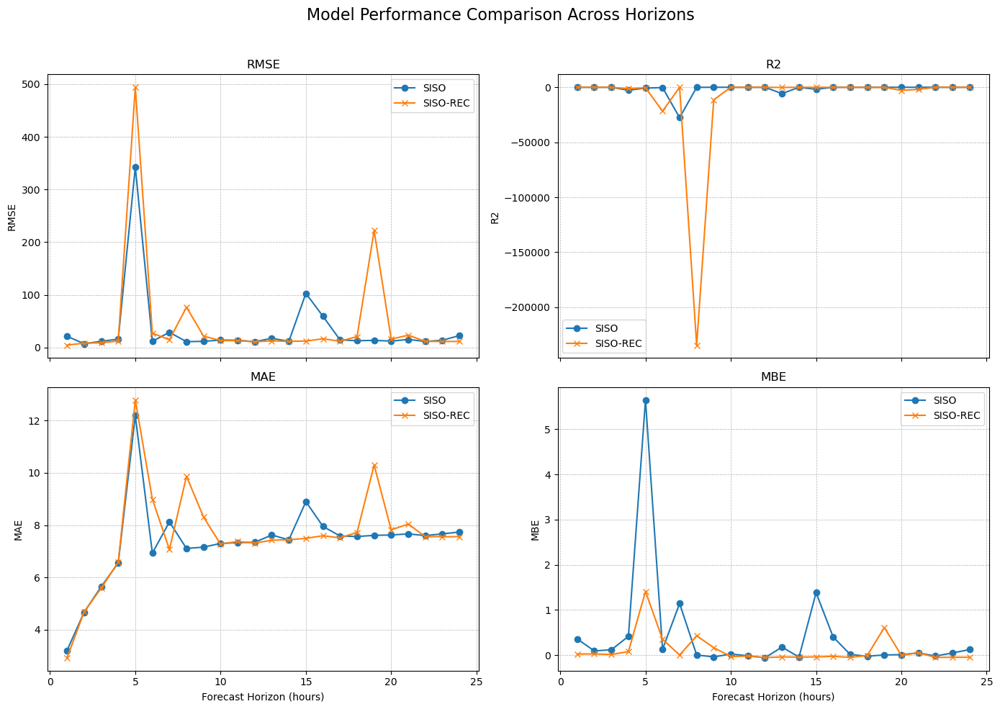

    - Generating Plot 2: Normalized Key Metrics Subplots (nRMSE, R2, nMAE, nMBE)...
Figure saved: figures/model_comparison_normalized_metrics.png


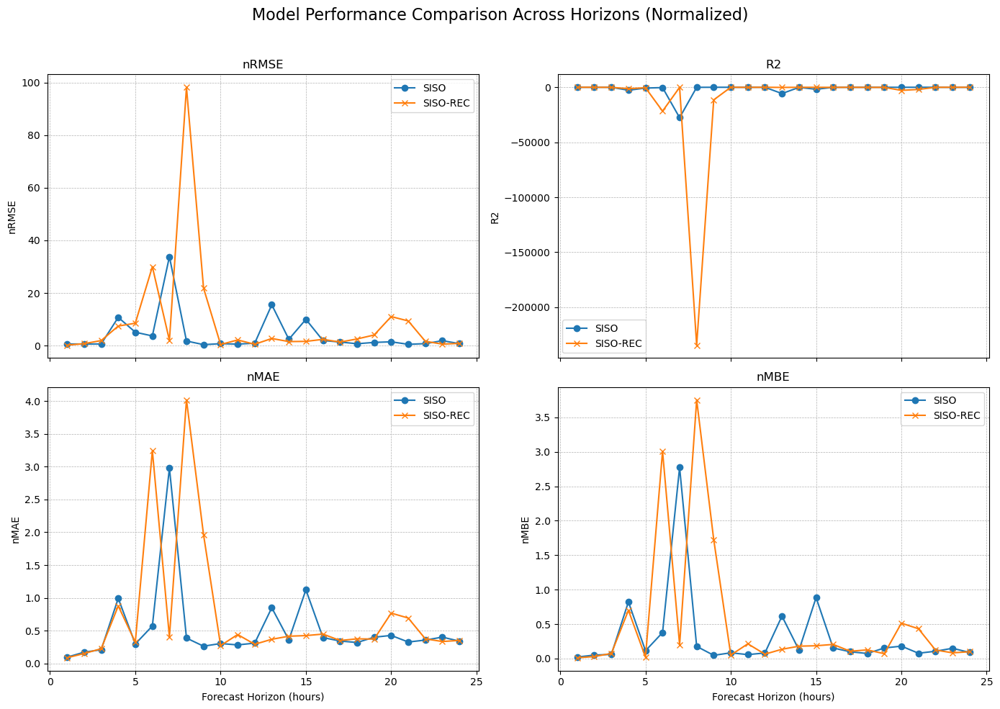

    - Generating Plot 3: Metrics by Energy Variable (Combined View)...
      - Plotting nRMSE...
Figure saved: figures/model_comparison_nrmse_by_variable.png


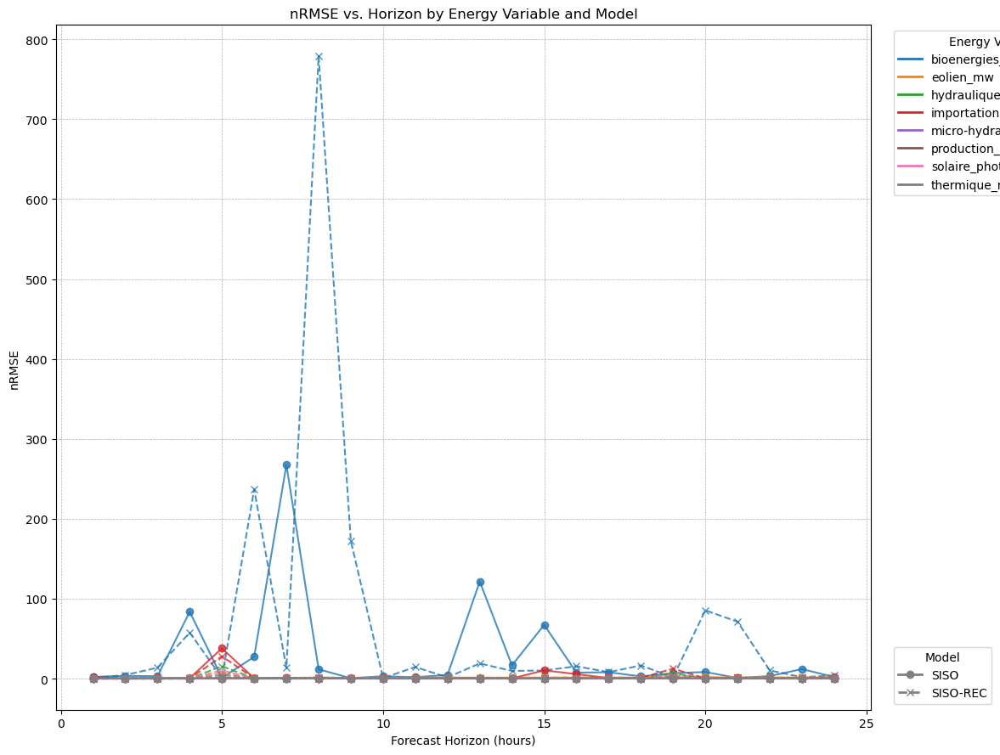

      - Plotting nMAE...
Figure saved: figures/model_comparison_nmae_by_variable.png


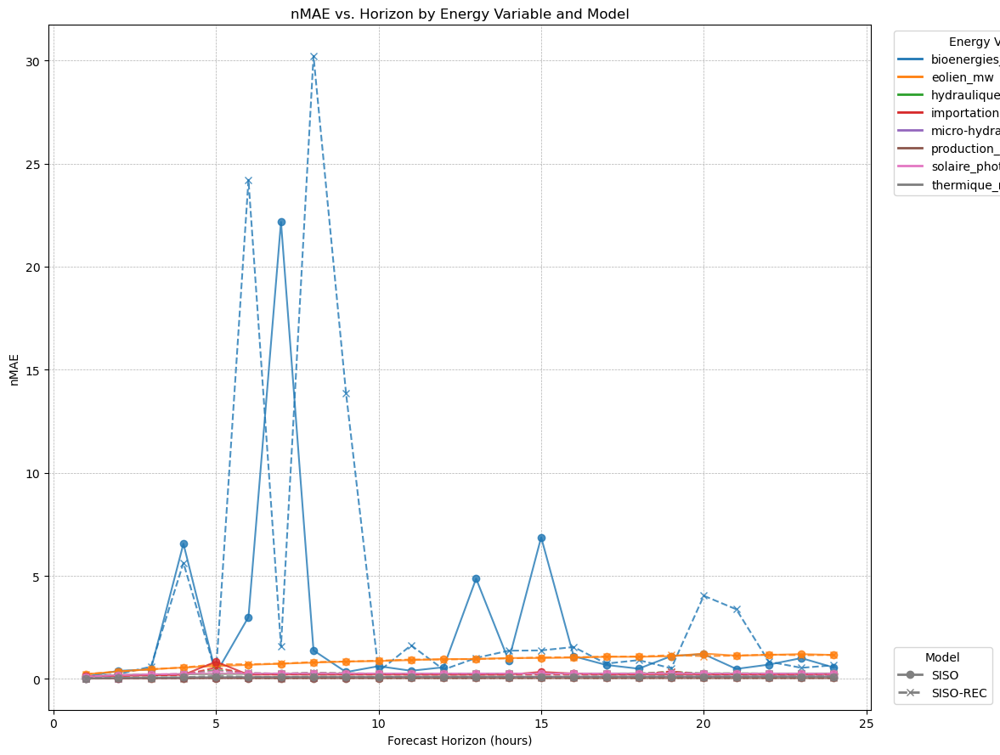

      - Plotting nMBE...
Figure saved: figures/model_comparison_nmbe_by_variable.png


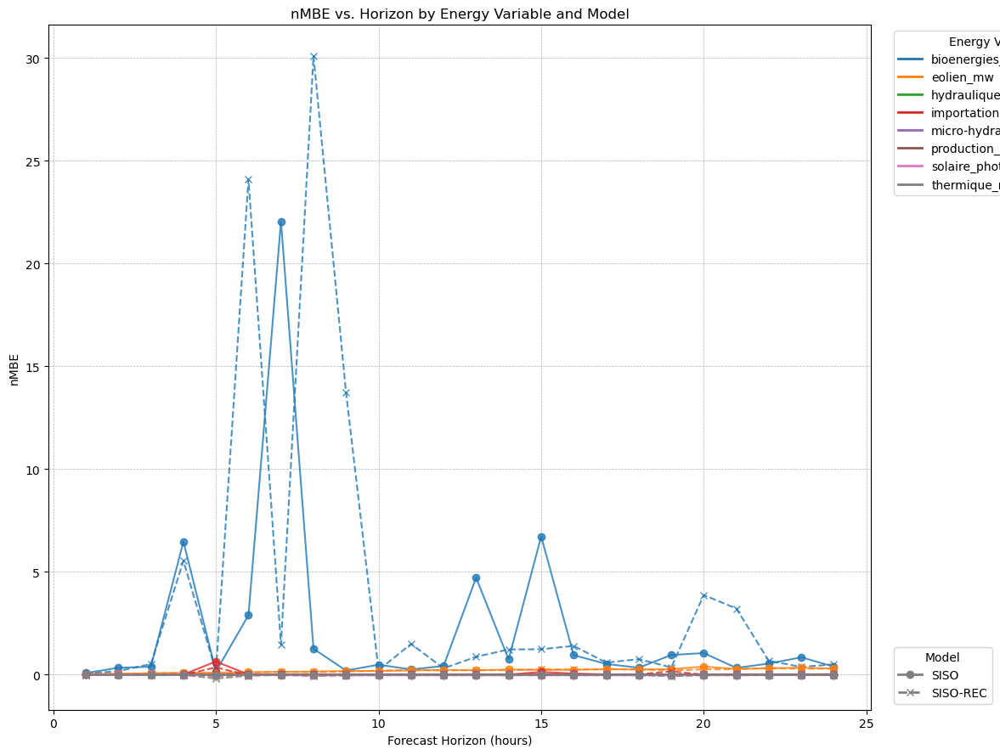

      - Plotting R2...
Figure saved: figures/model_comparison_r2_by_variable.png


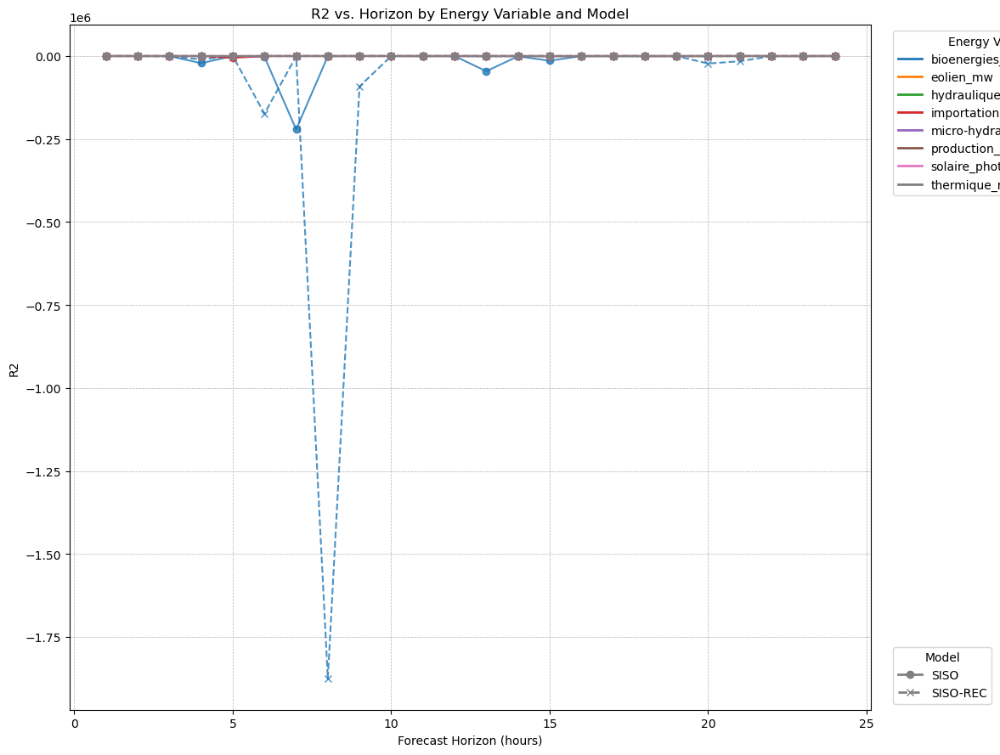

    - Generating Plot 4: Metrics by Energy Variable (Subplot View)...
      - Plotting nRMSE...
Figure saved: figures/nrmse_by_variable_subplots.png


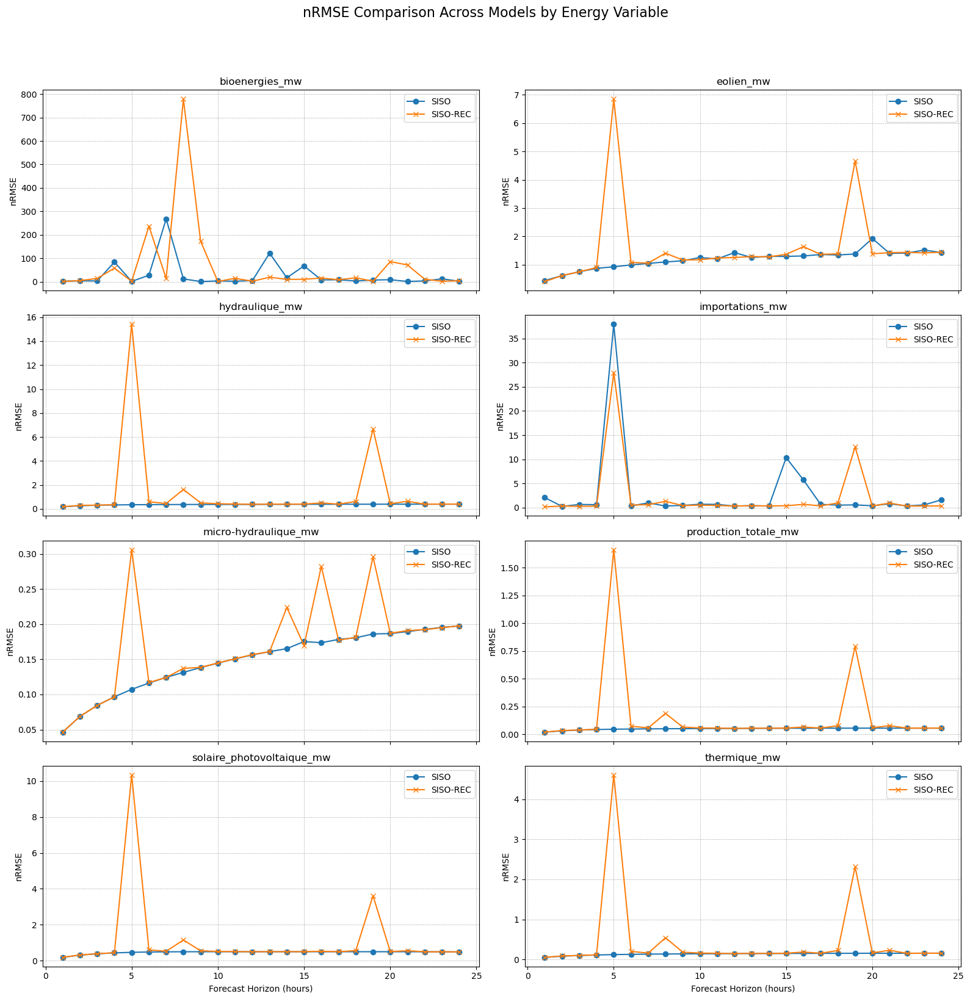

      - Plotting R2...
Figure saved: figures/r2_by_variable_subplots.png


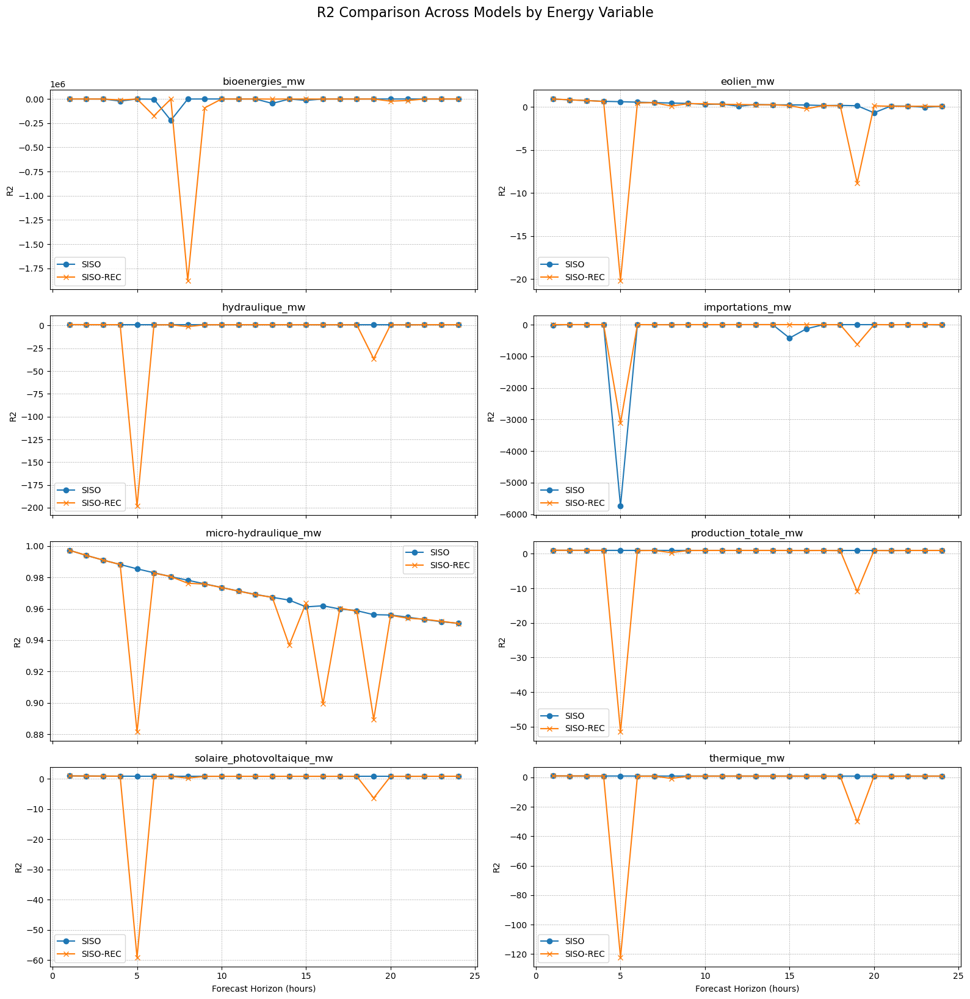

      - Plotting nMAE...
Figure saved: figures/nmae_by_variable_subplots.png


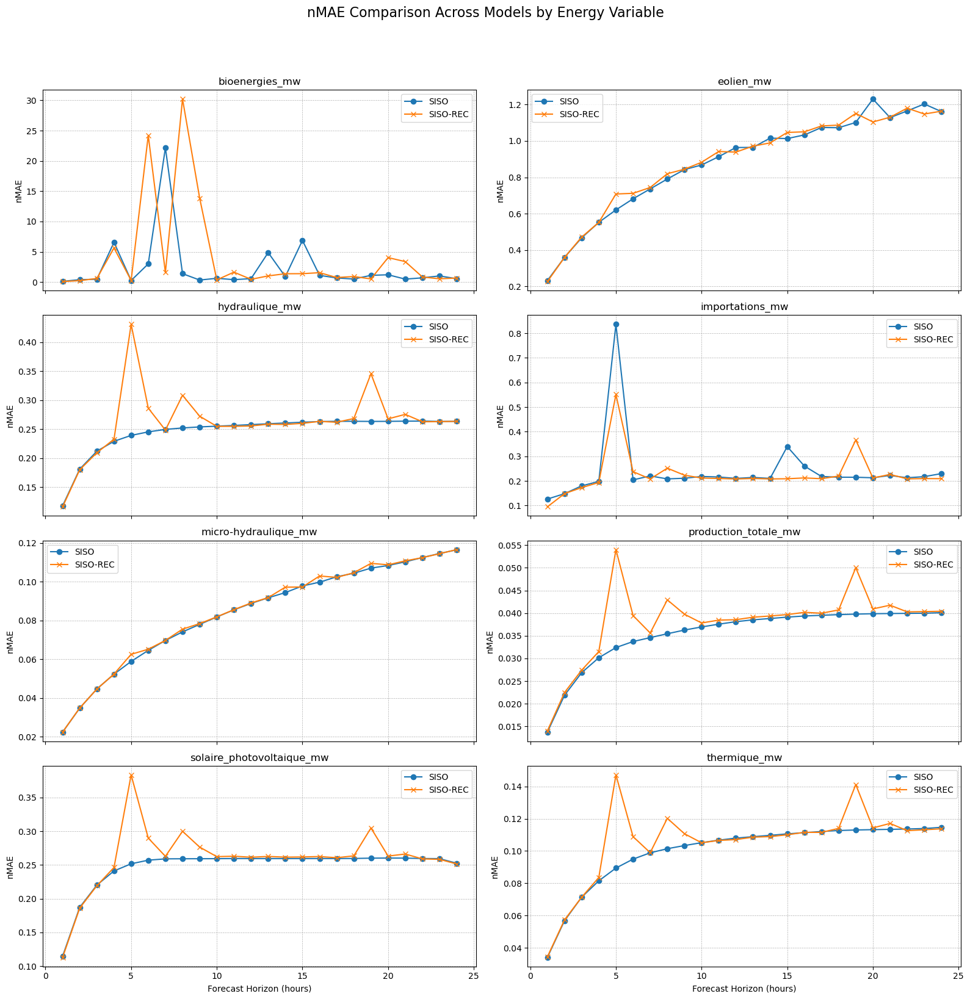

      - Plotting nMBE...
Figure saved: figures/nmbe_by_variable_subplots.png


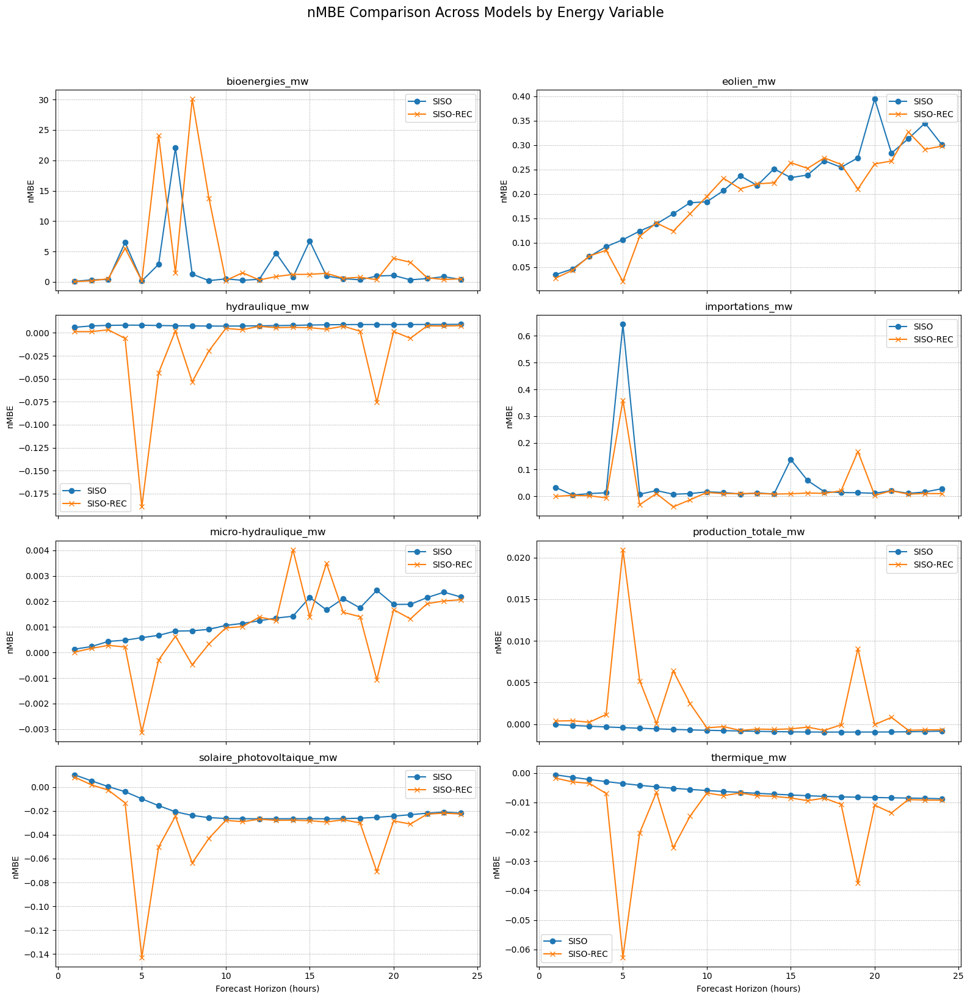

>>> [Step 5/5] Plot generation complete.



In [11]:
if __name__ == '__main__':
    main()

# VERSION MODIF

## CODE A METTRE

In [ ]:
# ── 1. Imports ──────────────────────────────────────────────────────────────
import numpy as np
import pandas as pd
from scipy.linalg import pinv
from typing import Tuple, Optional, Dict, List
import matplotlib.pyplot as plt
import seaborn as sns
import time
from tqdm import tqdm
import json
from pathlib import Path
from sklearn.metrics import mean_absolute_error, root_mean_squared_error,r2_score
import unicodedata, re

# ── 2. User parameters ──────────────────────────────────────────────────────
DATA_PATH   = Path(r"Data.csv")
TARGETS = ['production_totale_mw', 'thermique_mw', 'hydraulique_mw', 'micro-hydraulique_mw',
           'solaire_photovoltaique_mw', 'eolien_mw', 'bioenergies_mw', 'importations_mw']
DATE_COL    = "Date"                # ← datetime column
SPLIT_DATE  = '2021-01-01'          # train/test split date

NUM_INITIALIZATIONS = 1             # number of random initializations (seeds)
N_HIDDEN = 1000                     # 1000 neurons
LAMBDA_REG = 0 #1e-2 #1e-6                   # regularization

N_LAGS      = 48                    # 48 h window size
N_FORECASTS = 24                    # 24 h max horizon (forecast for h=1...h=24)

# ── 3. Load & clean function ────────────────────────────────────────────────

In [ ]:
# ── utility to normalize column names ─────────────────────────
def slugify(col: str) -> str:
    col = unicodedata.normalize("NFKD", col).encode("ascii", "ignore").decode()
    col = re.sub(r"[^\w\s-]", "", col).strip().lower().replace(" ", "_")
    return col

# ── main updated function ─────────────────────────────────────
def load_and_preprocess_data(
    file_path: Path,
    date_col: str = "Date",
    drop_policy: str = "mean",          # "first", "last" or "mean"
) -> pd.DataFrame:
    """
    Load a CSV, normalize column names, create 'ds' from `date_col`,
    and deduplicate on 'ds' according to `drop_policy`.
    Returns a DataFrame with a unique, sorted 'ds' column.
    """
    print("→ Loading and pre-processing…")
    df = pd.read_csv(file_path)

    # 1) normalize column names
    df.columns = [slugify(c) for c in df.columns]
    date_col   = slugify(date_col)

    # 2) convert date → UTC
    df["ds"] = pd.to_datetime(df[date_col], utc=True)
    df = df.drop(columns=[date_col])

    # 3) handle duplicates on ds
    if drop_policy in ("first", "last"):
        before = len(df)
        df = df.drop_duplicates(subset="ds", keep=drop_policy)
        removed = before - len(df)
        if removed:
            print(f"   {removed} duplicate(s) removed (keep='{drop_policy}').")
    elif drop_policy == "mean":
        df = (df.groupby("ds", as_index=False)
                .mean(numeric_only=True))          # average across duplicates
        print("   Duplicates aggregated by mean.")
    else:
        raise ValueError("drop_policy must be 'first', 'last' or 'mean'.")

    # 4) sort and reset index
    df = df.sort_values("ds").reset_index(drop=True)

    # 5) drop timezone if present
    if df["ds"].dt.tz is not None:
        df["ds"] = df["ds"].dt.tz_localize(None)
        
    print(f"   {len(df)} rows, {df.shape[1]} columns ready.")
    return df


In [ ]:
# ── Train/test split, ELM training, prediction, and MIMO-MH data prep ─────────
# The functions below keep your original logic but add detailed English comments
# (and translate previous French ones) so each step is clear and auditable.


def train_elm(X_train, Y_train, X_test, Y_test,
              num_hidden=None, num_initializations=None):
    """
    Train an ELM (Extreme Learning Machine) with Ridge-regularized linear readout.

    MODEL
    -----
    • Hidden layer: random affine transform + ReLU activation:
          H = ReLU( X_train @ W^T + b^T )
      where W ∈ R[num_hidden, n_features], b ∈ R[num_hidden, 1].
    • Output/readout layer (beta): closed-form ridge regression per output:
          (H^T H + λ I) β = H^T Y_train
      solved via np.linalg.solve; falls back to pseudo-inverse if needed.

    SEEDS / INITIALIZATIONS
    -----------------------
    • We draw new random W, b for each initialization and keep the one with the
      lowest validation RMSE on X_test/Y_test.
    • The number of tries is `num_initializations` (a.k.a. seeds / restarts).

    PREDICTIONS
    -----------
    • Test hidden: H_test = ReLU( X_test @ W^T + b^T )
    • Predictions:  Y_pred = H_test @ β
      (Your original code applies ReLU to the output as well and clips negatives
       to 0 via np.maximum; we keep that behavior.)

    METRIC
    ------
    • RMSE averaged across output dimensions:
          mean_h( sqrt( mean_t( (y_true - y_pred)^2 ) ) )

    External config expected (if args are None)
    -------------------------------------------
    NUM_INITIALIZATIONS = 1             # number of random initializations (seeds)
    N_HIDDEN = 1000                     # 1000 neurons
    LAMBDA_REG = 1e-6                   # regularization

    Returns
    -------
    best_model : tuple (W, b, beta)
        Parameters for the best run: weights, biases, and readout matrix.
    """
    if num_hidden is None:
        num_hidden = N_HIDDEN
    if num_initializations is None:
        num_initializations = NUM_INITIALIZATIONS

    #print(f"ELM training: {num_hidden} hidden neurons, {num_initializations} initializations")

    best_rmse = float('inf')
    best_model = None

    for init in range(num_initializations):
        # 1. Initialize random input weights (W) and biases (b)
        W = np.random.rand(num_hidden, X_train.shape[1])  # shape = (m, d)
        b = np.random.rand(num_hidden, 1)                 # shape = (m, 1)
        # 2. Calculate the hidden layer output matrix (H)
        # Hidden activations on train set (ReLU).
        # Broadcast b.T to (n_train, m).
        H = np.maximum(0, X_train @ W.T + b.T)

        # 3. Ridge-regularized closed-form solution for beta (output weights).
        HTH = H.T @ H                      # (m, m)
        HTY = H.T @ Y_train                # (m, n_outputs or flattened dim)
        lambda_reg = LAMBDA_REG  # scalar λ

        try:
            # More stable solution using solve
            beta = np.linalg.solve(HTH + lambda_reg * np.eye(HTH.shape[0]), HTY)  # (m, n_out)
        except np.linalg.LinAlgError:
            # Fallback if H^T H is singular/ill-conditioned
            beta = pinv(H) @ Y_train

        # Evaluate on test set for model selection.
        H_test = np.maximum(0, X_test @ W.T + b.T)
        # Keep your original post-activation/clipping on outputs:
        Y_pred = np.maximum(H_test @ beta, 0)

        # RMSE averaged across output dimensions (column-wise).
        rmse = np.mean(np.sqrt(np.mean((Y_test - Y_pred) ** 2, axis=0)))

        if rmse < best_rmse:
            best_model = (W, b, beta)
            best_rmse = rmse

    print(f"Best validation RMSE: {best_rmse:.4f}")
    return best_model


def predict_elm(X, model):
    """
    Forward pass for a trained ELM.

    Parameters
    ----------
    X : np.ndarray
        Feature matrix of shape (n_samples, n_features).
    model : tuple
        (W, b, beta) returned by `train_elm`.

    Returns
    -------
    Y_pred : np.ndarray
        Predicted targets. Uses the same ReLU on hidden and non-negativity clamp
        on outputs as in training selection.
    """
    W, b, beta = model
    H = np.maximum(0, X @ W.T + b.T)
    Y_pred = np.maximum(H @ beta, 0)
    return Y_pred


def prepare_data_mimo_mh(input_matrix, num_rows, max_horizon, window_size, num_outputs):
    """
    Build supervised learning matrices (X, Y) for MIMO multi-horizon training.

    SCENARIO
    --------
    • You have a multivariate time series in `input_matrix` with `num_rows` rows
      (time) and multiple columns (features/targets).
    • The first `num_outputs` columns correspond to the target variables
      you want to forecast (multi-output).
    • For each timestamp t, you want to predict the next `max_horizon` steps
      for those `num_outputs` targets.

    WINDOWING
    ---------
    • For each sample start t in [0, num_rows - window_size - max_horizon]:
        X_window = input_matrix[t : t + window_size, :].flatten()
        Y_window = input_matrix[t + window_size : t + window_size + max_horizon,
                                :num_outputs].flatten()
      X_window collects the *past* `window_size` frames (all features).
      Y_window concatenates the *future* `max_horizon` × `num_outputs`
      target block in time-major order.

    SHAPES
    ------
    • samples = num_rows - window_size - max_horizon + 1
    • X_windows.shape = (samples, window_size * n_features)
    • Y_windows.shape = (samples, max_horizon * num_outputs)

    Parameters
    ----------
    input_matrix : np.ndarray
        Full design matrix with time along axis 0. Must have at least `num_outputs`
        columns to slice target variables.
    num_rows : int
        Number of available time rows in `input_matrix`.
    max_horizon : int
        Maximum forecast horizon H (we will build targets for h = 1..H).
    window_size : int
        Number of lagged timesteps used as input context (sliding window length).
    num_outputs : int
        Number of target variables to forecast jointly.

    Returns
    -------
    X_windows, Y_windows : np.ndarray
        Flattened input windows and concatenated multi-horizon targets, ready for ELM.
    """
    samples = num_rows - window_size - max_horizon + 1

    # Build X windows by flattening each [window_size × n_features] slice.
    X_windows = np.array([
        input_matrix[t : t + window_size].flatten()
        for t in range(samples)
    ])

    # Build Y as a concatenation of the future target block:
    # [ (t+1..t+H) × num_outputs ] flattened for each sample.
    Y_windows = np.array([
        input_matrix[t + window_size : t + window_size + max_horizon, :num_outputs].flatten()
        for t in range(samples)
    ])

    return X_windows, Y_windows


In [ ]:
# ------------------------------------------------------------
# Helpers for reconciliation (built for your TARGETS ordering)
# ------------------------------------------------------------

def create_S_from_outputs(output_names):
    """
    Build the aggregation matrix S given output_names in the order:
    [total, bottom_1, ..., bottom_m].

    Returns S of shape ((m+1) x m) such that y_all = S @ b,
    where b are the m bottom-level series.
    """
    assert len(output_names) >= 2, "Need at least total + one bottom series."
    total_label = output_names[0]
    assert any(k in total_label.lower() for k in ["production_totale", "total", "tot"]), \
        "First output must be the total series."

    m = len(output_names) - 1  # number of bottom series
    S = np.zeros((m + 1, m), dtype=float)
    S[0, :] = 1.0              # total is the sum of all bottoms
    S[1:, :] = np.eye(m)       # each bottom maps to itself
    return S

def estimate_W_from_train_residuals(Y_true_mh_train, Y_pred_mh_train, diagonal=True):
    """
    Estimate error (co)variance per horizon from TRAIN residuals.

    Parameters
    ----------
    Y_true_mh_train : (n_samples, n_horizons, n_outputs)
    Y_pred_mh_train : (n_samples, n_horizons, n_outputs)
    diagonal        : if True, return diagonal W (variances only)

    Returns
    -------
    W_list : list of length n_horizons, each W is (n_outputs x n_outputs)
    """
    n_h = Y_true_mh_train.shape[1]
    n_o = Y_true_mh_train.shape[2]
    W_list = []

    for h in range(n_h):
        E = (Y_true_mh_train[:, h, :] - Y_pred_mh_train[:, h, :])  # (n_samples, n_o)
        if diagonal:
            v = np.var(E, axis=0, ddof=1)
            v = np.maximum(v, 1e-8)  # numerical floor
            W = np.diag(v)
        else:
            # Full covariance + small ridge for stability
            W = np.cov(E.T, ddof=1)
            lam = 1e-6 * np.trace(W) / n_o
            W = W + lam * np.eye(n_o)
        W_list.append(W)

    return W_list

def reconcile_all_horizons(Y_pred_mh, S, W_list):
    """
    MinT-Diagonal (WLS) reconciliation per horizon.

    Parameters
    ----------
    Y_pred_mh : (n_samples, n_horizons, n_outputs) ordered as [total, bottom_1..m]
    S         : ((m+1) x m) aggregation matrix
    W_list    : list of length n_horizons, each W is (n_outputs x n_outputs)

    Returns
    -------
    Y_rec : reconciled forecasts, same shape as Y_pred_mh
    """
    n_s, n_h, n_o = Y_pred_mh.shape
    m = S.shape[1]
    assert n_o == m + 1, "outputs must be [total + m bottom series] to match S."

    Y_rec = np.empty_like(Y_pred_mh)

    for h in range(n_h):
        W = W_list[h]
        # Use pseudo-inverses for numerical robustness
        W_inv = np.linalg.pinv(W)
        StW_inv = S.T @ W_inv
        P = np.linalg.pinv(StW_inv @ S) @ StW_inv      # (m x (m+1))
        H = S @ P                                      # (m+1 x (m+1)) projection

        Yh = Y_pred_mh[:, h, :].T                      # (n_o, n_s)
        Yh_rec = H @ Yh                                # (n_o, n_s)
        Y_rec[:, h, :] = Yh_rec.T

    return Y_rec


In [ ]:
#models...............
# FUNCTION FOR MIMO  (shared-prep version)
# -----------------------------------------------------------------------------
# What this does (one call = full per-horizon experiment):
# • Uses the *same* multi-horizon windowing as MIMO-MH via `prepare_data_mimo_mh`,
#   then slices out *only* the target block for the current horizon h.
#   - X_h shape: (samples, window_size × n_features)
#   - Y_h shape: (samples, n_outputs)  ← last block from the concatenated H targets
# • Trains an **independent ELM** for each horizon h = 1..H on its single-horizon Y.
# • Predicts on the aligned test windows for each h.
# • Aligns timestamps so that each prediction at horizon h is stamped at
#   (sample timestamp + h hours).
# • Stacks per-horizon test/pred arrays into shape (samples, horizons, outputs)
#   and returns both the long results DataFrame and the stacked tensors.
# -----------------------------------------------------------------------------
def run_mimo_all_horizons(
    df_all,
    split_date=SPLIT_DATE,
    output_names=TARGETS,
    max_horizon=N_FORECASTS,
    window_size=N_LAGS
):
    """
    Run independent MIMO for all horizons 1..max_horizon using prepare_data_mimo_mh.
    Args:
        df_all: input dataframe with datetime + features + outputs
        split_date: date string for train/test split
        output_names: list of output columns to predict
        max_horizon: max horizon (e.g. 24)
        window_size: sliding window size for inputs

    Returns:
        df_mimo: DataFrame with columns [datetime, horizon, output, y_true, y_pred]
        Y_test_mimo: np.ndarray (samples, horizons, outputs)
        Y_pred_mimo: np.ndarray (samples, horizons, outputs)
    """
    import numpy as np
    import pandas as pd

    # Extract input matrix from df_all (drop datetime)
    input_matrix = df_all[output_names].values
    num_rows = input_matrix.shape[0]
    num_outputs = len(output_names)
    datetime_index = pd.to_datetime(df_all['ds'])

    # Split train/test index
    train_idx = datetime_index < pd.to_datetime(split_date)
    test_idx = ~train_idx
    
    Y_test_all = []
    Y_pred_all = []
    horizon_datetimes = []

    for h in range(1, max_horizon + 1):
        print(f"Running MIMO single-horizon for horizon {h}")
        
        # Prepare data for horizons 1..h (multi-horizon)
        X_h, Y_h_all = prepare_data_mimo_mh(input_matrix, num_rows, h, window_size, num_outputs)
        
        # Extract only targets for horizon h (last block of num_outputs)
        Y_h = Y_h_all[:, -num_outputs:]
        
        # Split train-test by index (aligned with samples from prepare_data)
        total_samples = X_h.shape[0]
        # Map datetime index for each sample (window_size offset)
        sample_datetimes = datetime_index[window_size : window_size + total_samples]
        
        train_mask = sample_datetimes < pd.to_datetime(split_date)
        test_mask = ~train_mask
        
        X_train, Y_train = X_h[train_mask], Y_h[train_mask]
        X_test, Y_test = X_h[test_mask], Y_h[test_mask]
        
        # Train ELM model
        model = train_elm(X_train, Y_train, X_test, Y_test)
        
        # Predict on test set
        Y_pred = predict_elm(X_test, model)
        
        # Store test and pred arrays
        Y_test_all.append(Y_test)
        Y_pred_all.append(Y_pred)
        
        # Build datetime for each forecast: test sample datetime + horizon offset
        dt_for_horizon = sample_datetimes[test_mask] + pd.to_timedelta(h, unit='h')
        horizon_datetimes.append(dt_for_horizon)

    # Align samples across horizons by truncating to smallest length
    min_samples = min(arr.shape[0] for arr in Y_test_all)
    
    # Truncate arrays to min_samples for stacking
    Y_test_all_trunc = [arr[:min_samples] for arr in Y_test_all]
    Y_pred_all_trunc = [arr[:min_samples] for arr in Y_pred_all]
    horizon_datetimes = [arr[:min_samples] for arr in horizon_datetimes]
    
    # Stack arrays into shape (samples, horizons, outputs)
    Y_test_mimo = np.stack(Y_test_all_trunc, axis=1)
    Y_pred_mimo = np.stack(Y_pred_all_trunc, axis=1)

    # Build dataframe with aligned datetime
    records = []
    for h in range(max_horizon):
        for sample_idx in range(min_samples):
            for o in range(num_outputs):
                records.append({
                    'datetime': horizon_datetimes[h].iloc[sample_idx],
                    'horizon': h + 1,
                    'output': output_names[o],
                    'y_true': Y_test_mimo[sample_idx, h, o],
                    'y_pred': Y_pred_mimo[sample_idx, h, o]
                })

    df_mimo = pd.DataFrame(records)
    return df_mimo, Y_test_mimo, Y_pred_mimo

# MIMO with RECONCILIATION 
def run_mimo_all_horizons_rec(
    df_all,
    split_date=SPLIT_DATE,
    output_names=TARGETS,
    max_horizon=N_FORECASTS,
    window_size=N_LAGS,
    *,
    reconcile: bool = True
):
    """
    MIMO (independent model per horizon) with optional MinT-Diagonal (WLS) reconciliation.

    Returns
    -------
    df_mimo : long df with ['datetime','horizon','output','y_true','y_pred', 'y_pred_rec' (if reconcile)]
    Y_test_mimo : (samples_test, H, O)
    Y_pred_mimo : (samples_test, H, O)
    Y_pred_rec_mimo : (samples_test, H, O) or None if reconcile=False
    """
    import numpy as np
    import pandas as pd

    input_matrix = df_all[output_names].values
    num_rows     = input_matrix.shape[0]
    num_outputs  = len(output_names)
    datetime_idx = pd.to_datetime(df_all['ds'])

    # containers (per-horizon)
    Y_test_list,  Y_pred_list  = [], []
    Y_tr_list,    Y_pr_tr_list = [], []     # for W estimation on TRAIN
    dt_test_list = []

    for h in range(1, max_horizon + 1):
        # multi-horizon prep up to h, then slice last block (single-horizon labels)
        X_h, Y_h_all = prepare_data_mimo_mh(input_matrix, num_rows, h, window_size, num_outputs)
        Y_h = Y_h_all[:, -num_outputs:]

        total_samples = X_h.shape[0]
        sample_dt = datetime_idx[window_size : window_size + total_samples]
        train_mask = sample_dt < pd.to_datetime(split_date)
        test_mask  = ~train_mask

        X_tr, Y_tr = X_h[train_mask], Y_h[train_mask]
        X_te, Y_te = X_h[test_mask],  Y_h[test_mask]

        model   = train_elm(X_tr, Y_tr, X_te, Y_te)
        Y_pr_tr = predict_elm(X_tr, model)
        Y_pr_te = predict_elm(X_te, model)

        Y_tr_list.append(Y_tr)
        Y_pr_tr_list.append(Y_pr_tr)
        Y_test_list.append(Y_te)
        Y_pred_list.append(Y_pr_te)

        dt_for_h = (sample_dt[test_mask] + pd.to_timedelta(h, 'h'))
        dt_test_list.append(dt_for_h)

    # align to common min length (test and train separately)
    min_te = min(a.shape[0] for a in Y_test_list)
    min_tr = min(a.shape[0] for a in Y_tr_list)

    Y_test_mimo = np.stack([a[:min_te] for a in Y_test_list], axis=1)      # (S_te, H, O)
    Y_pred_mimo = np.stack([a[:min_te] for a in Y_pred_list], axis=1)
    Y_tr_mimo   = np.stack([a[:min_tr] for a in Y_tr_list],   axis=1)      # (S_tr, H, O)
    Y_pr_tr_mh  = np.stack([a[:min_tr] for a in Y_pr_tr_list], axis=1)

    # per-horizon datetimes (truncate)
    dt_test_list = [dt[:min_te] for dt in dt_test_list]

    # --- reconciliation
    Y_pred_rec = None
    if reconcile:
        S       = create_S_from_outputs(output_names)
        W_list  = estimate_W_from_train_residuals(Y_tr_mimo, Y_pr_tr_mh, diagonal=True)
        Y_pred_rec = reconcile_all_horizons(Y_pred_mimo, S, W_list)

        # quick diagnostic
        tot = 0
        raw_gap = np.mean(np.abs(Y_pred_mimo[:, :, tot] - Y_pred_mimo[:, :, 1:].sum(axis=2)))
        rec_gap = np.mean(np.abs(Y_pred_rec[:, :,  tot] - Y_pred_rec[:, :,  1:].sum(axis=2)))
        print(f"[MIMO Recon] mean |Total - sum(children)| raw={raw_gap:.6f} → rec={rec_gap:.6f}")

    # long df
    records = []
    H, O = max_horizon, len(output_names)
    for h in range(H):
        for i in range(min_te):
            dt = dt_test_list[h].iloc[i]
            for o, name in enumerate(output_names):
                row = {
                    "datetime": dt,
                    "horizon":  h + 1,
                    "output":   name,
                    "y_true":   float(Y_test_mimo[i, h, o]),
                    "y_pred":   float(Y_pred_mimo[i, h, o]),
                }
                if Y_pred_rec is not None:
                    row["y_pred_rec"] = float(Y_pred_rec[i, h, o])
                records.append(row)
    df_mimo = (pd.DataFrame.from_records(records)
                 .sort_values(["horizon","output","datetime"])
                 .reset_index(drop=True))

    return df_mimo, Y_test_mimo, Y_pred_mimo, Y_pred_rec


# FAST SISO (single-output per horizon) — vectorized windowing + shared masks
# -----------------------------------------------------------------------------
# Speed-ups vs the previous version:
# • Single pass of windowing per output using numpy.sliding_window_view (no Python loops).
# • Align all horizons to the SAME number of samples: S = T - window_size - max_horizon + 1.
#   → one X_windows per output reused for all horizons; one Y_future matrix (S × H).
# • Precompute timestamp slices and train/test masks ONCE per horizon (shared across outputs).
# • Vectorized record building (per (output,h)), minimal Python-level append loops.
# • Optional: switch arrays to float32 to reduce memory (commented below).
# -----------------------------------------------------------------------------
import numpy as np
import pandas as pd
from numpy.lib.stride_tricks import sliding_window_view

def run_siso_all_horizons_separate_fast(
    df_all: pd.DataFrame,
    split_date=SPLIT_DATE,
    output_names=TARGETS,
    max_horizon=N_FORECASTS,
    window_size=N_LAGS
):
    """
    Train SISO ELMs for every target and horizon using aligned windowing.

    Windowing (aligned to max_horizon):
        S = T - window_size - max_horizon + 1
        X_windows(out): shape (S, window_size)
        Y_future(out):  shape (S, max_horizon), column h-1 is the h-step target

    Split:
        For each horizon h, we build the input-window-end timestamps and derive a
        train/test mask by `split_date`. Masks are shared across outputs.

    Returns
    -------
    df_siso : long DataFrame with columns
              ['model','datetime','horizon','output','y_true','y_pred']
    Y_test_siso : np.ndarray, shape (samples, horizons, outputs)
    Y_pred_siso : np.ndarray, shape (samples, horizons, outputs)
    """
    # --- Basics
    datetime_index = pd.to_datetime(df_all["ds"])
    T = len(df_all)
    H = int(max_horizon)
    W = int(window_size)
    O = len(output_names)

    # Number of aligned samples (common across horizons)
    S = T - W - H + 1
    if S <= 0:
        raise ValueError("Not enough rows for the requested window_size and max_horizon.")

    # --- Precompute per-horizon timestamp slices and masks (shared across outputs)
    split_ts = pd.to_datetime(split_date)
    sample_dt_by_h = {}
    train_mask_by_h = {}
    test_mask_by_h = {}
    # base index of input window end for horizon h:
    # original formula: datetime_index[W + h - 1 : W + h - 1 + S]
    for h in range(1, H + 1):
        start = W + h - 1
        stop  = start + S
        dt_h = datetime_index[start:stop]              # len = S
        sample_dt_by_h[h] = dt_h
        mask_train = dt_h < split_ts
        train_mask_by_h[h] = mask_train.to_numpy()
        test_mask_by_h[h]  = (~mask_train).to_numpy()

    # --- Containers
    # Collect per-horizon matrices (each becomes S_test_min × O after truncation)
    Ytest_per_h = [[] for _ in range(H)]
    Ypred_per_h = [[] for _ in range(H)]
    dt_test_per_h = [None for _ in range(H)]
    records = []

    # --- Loop over outputs (SISO)
    for out_idx, out_name in enumerate(output_names):
        # SISO inputs: only this target's own history
        y = df_all[out_name].to_numpy()
        # Optional: cast to float32 to reduce memory (uncomment if needed)
        # y = y.astype(np.float32, copy=False)

        # Build aligned sliding windows (no Python loops)
        # X_windows shape: (S, W)
        X_windows = sliding_window_view(y, window_shape=W)[:S]
        # Y_future matrix: (S, H), column j = value at horizon (j+1)
        Y_future = sliding_window_view(y, window_shape=W + H)[:S, W:]

        # Horizon loop (training still needs to happen per h)
        for h in range(1, H + 1):
            train_mask = train_mask_by_h[h]
            test_mask  = test_mask_by_h[h]
            if not test_mask.any() or not train_mask.any():
                continue

            # Slice once (fast views)
            X_train = X_windows[train_mask]
            X_test  = X_windows[test_mask]
            # Y at horizon h: (S,) → (S,1)
            Y_train = Y_future[train_mask, h - 1: h].copy()
            Y_test  = Y_future[test_mask,  h - 1: h].copy()

            # Fit & predict
            model = train_elm(X_train, Y_train, X_test, Y_test)
            Y_pred = predict_elm(X_test, model)

            # Forecast timestamps at actual target time (ds + h)
            dt_h = sample_dt_by_h[h] + pd.to_timedelta(h, "h")
            dt_test = dt_h[test_mask]
            if dt_test_per_h[h - 1] is None:
                dt_test_per_h[h - 1] = dt_test

            # Save arrays for stacking later
            Ytest_per_h[h - 1].append(Y_test)
            Ypred_per_h[h - 1].append(Y_pred)

            # Vectorized record build for this (output, h)
            rec = pd.DataFrame({
                "model":   "SISO",
                "datetime": dt_test.to_numpy(),
                "horizon":  h,
                "output":   out_name,
                "y_true":   Y_test.ravel(),
                "y_pred":   Y_pred.ravel(),
            })
            records.append(rec)

    # --- Stack into 3D arrays with global truncation to match shapes
    if not any(len(lst) for lst in Ytest_per_h):
        # No test data available (e.g., split too late)
        df_siso = pd.concat(records, ignore_index=True) if records else pd.DataFrame(
            columns=["model","datetime","horizon","output","y_true","y_pred"]
        )
        return df_siso, np.empty((0, 0, 0)), np.empty((0, 0, 0))

    # Determine global min test length across all (h, output)
    min_len_global = min(arr.shape[0] for h_list in Ytest_per_h for arr in h_list if len(h_list) > 0)

    # Build arrays: (samples, horizons, outputs)
    Y_test_siso = np.zeros((min_len_global, H, O))
    Y_pred_siso = np.zeros((min_len_global, H, O))

    for h in range(H):
        if len(Ytest_per_h[h]) == 0:
            # leave zeros if no data for this horizon
            continue
        for o, (Yt, Yp) in enumerate(zip(Ytest_per_h[h], Ypred_per_h[h])):
            Y_test_siso[:, h, o] = Yt[:min_len_global, 0]
            Y_pred_siso[:, h, o] = Yp[:min_len_global, 0]

    # Long-form DataFrame
    df_siso = pd.concat(records, ignore_index=True) if records else pd.DataFrame(
        columns=["model","datetime","horizon","output","y_true","y_pred"]
    )
    df_siso = df_siso.sort_values(["horizon","output","datetime"]).reset_index(drop=True)

    return df_siso, Y_test_siso, Y_pred_siso


## USE THIS 

from numpy.lib.stride_tricks import sliding_window_view

def run_siso_all_horizons_separate_fast_rec(
    df_all: pd.DataFrame,
    *,
    split_date= SPLIT_DATE,
    output_names = TARGETS,
    max_horizon: int = 24,
    window_size: int = 48,
    clip_nonneg: bool = True,
):
    """
    SISO ELMs for every (output, horizon) + MinT-diagonal reconciliation (robust).

    Requirements:
      - df_all has columns: ['ds'] + output_names (total must be first: e.g., 'production_totale_mw')
      - Functions available in scope: train_elm(X_train, Y_train, X_test, Y_test) -> model,
                                     predict_elm(X, model) -> yhat

    Returns
    -------
    df_siso : long DataFrame with columns:
              ['model','datetime','horizon','output','y_true','y_pred','y_pred_rec']
              (one row per test sample)
    Y_test  : np.ndarray, shape (samples, H, O)
    Y_pred  : np.ndarray, shape (samples, H, O)
    Y_rec   : np.ndarray, shape (samples, H, O)  # reconciled
    """

    # ---- helpers -------------------------------------------------------------
    def _create_S_from_outputs(outputs):
        """S maps bottom series (m) to total+bottom (m+1). outputs[0] must be total."""
        tot = outputs[0].lower()
        assert any(k in tot for k in ["production_totale", "total", "tot"]), \
            "output_names[0] must be the TOTAL series."
        m = len(outputs) - 1
        S = np.zeros((m + 1, m), dtype=float)
        S[0, :] = 1.0
        S[1:, :] = np.eye(m)
        return S

    def _safe_var_from_sums(sum_e, sum_e2, n):
        """Unbiased sample variance from running sums; robust if n<=1."""
        if n is None or n < 2:
            return np.nan
        # var = (Σe^2 - (Σe)^2/n)/(n-1)
        return (sum_e2 - (sum_e * sum_e) / n) / (n - 1)

    def _diag_W_from_train_residual_sums(sum_e, sum_e2, n_counts):
        """
        Build per-horizon diagonal W from TRAIN residual running sums.
        Inputs are arrays of shape (H, O) for sum_e, sum_e2, n_counts.
        """
        H, O = sum_e.shape
        W_list = []
        for h in range(H):
            v = np.empty(O, dtype=float)
            for o in range(O):
                v[o] = _safe_var_from_sums(sum_e[h, o], sum_e2[h, o], n_counts[h, o])
            # repair bad variances
            if not np.isfinite(v).all():
                med = np.nanmedian(v)
                if not np.isfinite(med):
                    med = 1.0
                v[~np.isfinite(v)] = med
            v = np.clip(v, 1e-8, None)
            W_list.append(np.diag(v))
        return W_list

    def _reconcile_mint_diagonal(Y_pred, S, W_list, clip0=True):
        """
        Robust MinT-diagonal reconciliation (per horizon, row-by-row).
        Y_pred: (N, H, O), S: ((m+1) x m), W_list: length-H diagonal matrices (O x O).
        """
        N, H, O = Y_pred.shape
        m = S.shape[1]
        assert O == m + 1, "outputs must be [TOTAL, bottom_1..m] to match S."
        Y_rec = np.empty_like(Y_pred)

        for h in range(H):
            W = W_list[h]
            try:
                W_inv = np.linalg.pinv(W)
            except Exception:
                W_inv = np.eye(O)

            StW_inv = S.T @ W_inv
            try:
                P = np.linalg.pinv(StW_inv @ S) @ StW_inv  # (m x O)
                Hproj = S @ P                              # (O x O)
            except Exception:
                Hproj = np.eye(O)

            for i in range(N):
                y = Y_pred[i, h, :].astype(float, copy=False)
                if not np.isfinite(y).all():
                    y_rec = y  # fallback: keep raw (prevents NaNs)
                else:
                    y_rec = Hproj @ y
                if clip0:
                    y_rec = np.maximum(y_rec, 0.0)
                Y_rec[i, h, :] = y_rec

        return Y_rec

    # ---- setup & windowing ---------------------------------------------------
    df = df_all.sort_values("ds").copy()
    df["ds"] = pd.to_datetime(df["ds"])
    dt = df["ds"].to_numpy()
    O = len(output_names)
    H = int(max_horizon)
    W = int(window_size)
    T = len(df)
    S_aligned = T - W - H + 1
    if S_aligned <= 0:
        raise ValueError("Not enough rows for the requested window_size and max_horizon.")

    split_ts = pd.to_datetime(split_date)

    # Precompute per-horizon sample timestamps and masks
    sample_dt_by_h = {}
    train_mask_by_h = {}
    test_mask_by_h = {}
    for h in range(1, H + 1):
        start = W + h - 1
        stop  = start + S_aligned
        dt_h = df["ds"].iloc[start:stop].to_numpy()    # window-end timestamps
        sample_dt_by_h[h] = dt_h
        mask_tr = dt_h < split_ts
        train_mask_by_h[h] = mask_tr
        test_mask_by_h[h]  = ~mask_tr

    # Running sums for TRAIN residuals to estimate W (H x O)
    sum_e_tr   = np.zeros((H, O), dtype=float)
    sum_e2_tr  = np.zeros((H, O), dtype=float)
    n_tr       = np.zeros((H, O), dtype=int)

    # To stack TEST arrays
    Ytest_per_h = [[] for _ in range(H)]
    Ypred_per_h = [[] for _ in range(H)]

    # ---- SISO training loop --------------------------------------------------
    for o, out_name in enumerate(output_names):
        y = df[out_name].to_numpy()

        # Sliding windows (aligned for all horizons)
        X_windows = sliding_window_view(y, window_shape=W)[:S_aligned]           # (S, W)
        Y_future  = sliding_window_view(y, window_shape=W + H)[:S_aligned, W:]   # (S, H)

        for h in range(1, H + 1):
            tr_mask = train_mask_by_h[h]
            te_mask = test_mask_by_h[h]
            if not tr_mask.any() or not te_mask.any():
                continue

            # Train/test splits
            X_tr = X_windows[tr_mask]
            X_te = X_windows[te_mask]
            y_tr = Y_future[tr_mask, h - 1:h]  # (n_tr, 1)
            y_te = Y_future[te_mask,  h - 1:h]

            model = train_elm(X_tr, y_tr, X_te, y_te)

            # TRAIN preds for W estimation
            y_hat_tr = predict_elm(X_tr, model).ravel()
            r = (y_tr.ravel() - y_hat_tr)
            r = r[np.isfinite(r)]
            if r.size > 0:
                sum_e_tr[h - 1, o]  += r.sum()
                sum_e2_tr[h - 1, o] += np.square(r).sum()
                n_tr[h - 1, o]      += r.size

            # TEST preds for arrays
            y_hat_te = predict_elm(X_te, model)
            Ytest_per_h[h - 1].append(y_te)      # (n_te, 1)
            Ypred_per_h[h - 1].append(y_hat_te)  # (n_te, 1)

    # ---- Build dense TEST arrays (samples x H x O) ---------------------------
    # global min length across (h, output) to align
    min_len = min(arr.shape[0] for lst in Ytest_per_h for arr in lst if lst)
    Y_test = np.zeros((min_len, H, O), dtype=float)
    Y_pred = np.zeros((min_len, H, O), dtype=float)

    for h in range(H):
        for o in range(O):
            Y_test[:, h, o] = Ytest_per_h[h][o][:min_len, 0]
            Y_pred[:, h, o] = Ypred_per_h[h][o][:min_len, 0]

    # Common TEST datetimes at actual target time (ds + h)
    dt_common = []
    for h in range(1, H + 1):
        dt_h = sample_dt_by_h[h] + np.timedelta64(h, "h")
        dt_common.append(pd.to_datetime(dt_h[test_mask_by_h[h]])[:min_len].to_numpy())

    # ---- Build W and reconcile ----------------------------------------------
    S_mat = _create_S_from_outputs(output_names)
    W_list = _diag_W_from_train_residual_sums(sum_e_tr, sum_e2_tr, n_tr)
    Y_rec = _reconcile_mint_diagonal(Y_pred, S_mat, W_list, clip0=clip_nonneg)

    # ---- Long DataFrame with raw + reconciled (no NaNs) ----------------------
    rows = []
    model_label = "SISO"
    for h in range(1, H + 1):
        dt_h = dt_common[h - 1]
        for o, out_name in enumerate(output_names):
            rows.append(pd.DataFrame({
                "model":   model_label,
                "datetime": dt_h,
                "horizon":  h,
                "output":   out_name,
                "y_true":   Y_test[:, h - 1, o],
                "y_pred":   Y_pred[:, h - 1, o],
                "y_pred_rec": Y_rec[:, h - 1, o],
            }))
    df_siso = (pd.concat(rows, ignore_index=True)
                 .sort_values(["horizon","output","datetime"])
                 .reset_index(drop=True))

    return df_siso, Y_test, Y_pred, Y_rec


In [ ]:
# COMPUTE ALL METRICS
# -----------------------------------------------------------------------------
# What this does:
# • Groups the long results table `df` by (model, horizon, output).
# • For each group, computes:
#     - RMSE, MAE, MBE (error stats) and R² (goodness of fit).
#     - Normalized versions nRMSE, nMAE, nMBE using mean(y_true) as the scale.
# • Returns a tidy `metrics_df` with one row per (model, horizon, output).
#
# Notes:
# • If mean(y_true) == 0, normalized metrics are set to NaN to avoid division by zero.
# • R² requires at least 2 points; otherwise it’s NaN.
# • Expects columns: ['model','horizon','output','y_true','y_pred'] in `df`.
def compute_all_metrics(df):
    metrics_list = []

    grouped = df.groupby(['model', 'horizon', 'output'])
    for (model, horizon, output), group in grouped:
        y_true = group['y_true'].values
        y_pred = group['y_pred'].values
        error = y_pred - y_true

        mae  = np.mean(np.abs(error))
        mbe  = np.mean(error)
        rmse = np.sqrt(np.mean(error ** 2))
        r2   = r2_score(y_true, y_pred) if len(y_true) > 1 else np.nan
        mean_true = np.mean(y_true)

        nmae  = mae  / mean_true if mean_true != 0 else np.nan
        nmbe  = mbe  / mean_true if mean_true != 0 else np.nan
        nrmse = rmse / mean_true if mean_true != 0 else np.nan

        metrics_list.append([
            model, horizon, output,
            nrmse, nmae, nmbe, r2, rmse, mae, mbe
        ])

    metrics_df = pd.DataFrame(
        metrics_list,
        columns=["model", "horizon", "output", "nRMSE", "nMAE", "nMBE", "R2", "RMSE", "MAE", "MBE"]
    )
    return metrics_df


# PLOT NORMALIZED METRICS ACROSS HORIZONS (AVERAGED OVER OUTPUTS)
# -----------------------------------------------------------------------------
# What this does:
# • For each metric in [nRMSE, nMAE, nMBE, R2], plots the value vs horizon.
# • One line per model; values are the mean across outputs at each horizon.
# • Useful for a compact dashboard-style view of relative performance.
def plot_metricsN(metrics_df):
    """Plot normalized metrics for MIMO vs MIMO-MH (averaged over outputs)."""
    fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharex=True)
    metric_names = ["nRMSE", "nMAE", "nMBE", "R2"]
    
    for ax, metric in zip(axs.flat, metric_names):
        for model in metrics_df["model"].unique():
            data = (metrics_df[metrics_df["model"] == model]
                    .groupby("horizon", observed=True)[metric]
                    .mean())
            ax.plot(data.index, data.values, marker='o', label=model)
        ax.set_title(metric)
        ax.grid(True)
        ax.legend()
    
    plt.tight_layout()
    plt.show()


# PLOT RAW METRICS ACROSS HORIZONS (AVERAGED OVER OUTPUTS)
# -----------------------------------------------------------------------------
# What this does:
# • For each metric in [RMSE, MAE, MBE, R2], plots the value vs horizon.
# • One line per model; values are the mean across outputs at each horizon.
# • Use this when the physical units of error matter (e.g., MW).
def plot_metrics(metrics_df):
    """Plot raw metrics for MIMO vs MIMO-MH (averaged over outputs)."""
    fig, axs = plt.subplots(2, 2, figsize=(12, 8), sharex=True)
    metric_names = ["RMSE", "MAE", "MBE", "R2"]
    
    for ax, metric in zip(axs.flat, metric_names):
        for model in metrics_df["model"].unique():
            data = (metrics_df[metrics_df["model"] == model]
                    .groupby("horizon", observed=True)[metric]
                    .mean())
            ax.plot(data.index, data.values, marker='o', label=model)
        ax.set_title(metric)
        ax.grid(True)
        ax.legend()
    
    plt.tight_layout()
    plt.show()


# ONE-FIGURE COMPARISON: ALL OUTPUTS TOGETHER
# -----------------------------------------------------------------------------
# What this does:
# • Plots the chosen metric vs horizon **on a single axes** for all outputs.
# • Encoding:
#     - Color = output name (one color per output).
#     - Line style = model (solid for first model, dashed for others).
#     - Markers = 'o' (hollow circle) for MIMO, 'x' (cross) for MIMO-MH.
# • Optional:
#     - `outputs`: restrict to a subset of outputs.
#     - `markevery`: show markers at every k-th point to reduce clutter.
# • Expects `metrics_df` with columns ['model','horizon','output', <metric>].
import itertools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib import rcParams

def plot_metric_all_outputs_oneplot(
    metrics_df: pd.DataFrame,
    metric: str = "RMSE",
    models: tuple = ("MIMO-MH", "MIMO-MH_REC"),
    outputs: list | None = None,
    linestyle_by_model: dict | None = None,
    show_separate_legends: bool = True,
    title: str | None = None,
    marker_size: float = 6.0,
    markevery: int | None = None,
    marker_edge_width: float = 1.6
):
    """
    One plot, all outputs:
      - color = output
      - linestyle = model
      - marker: hollow circle 'o' for MIMO, cross 'x' for MIMO-MH
    """
    # Validate metric
    if metric not in metrics_df.columns:
        available = [c for c in ["nRMSE","nMAE","nMBE","R2","RMSE","MAE","MBE"] if c in metrics_df.columns]
        raise ValueError(f"Metric '{metric}' not found. Available: {available}")

    df = metrics_df.copy()
    df["horizon"] = pd.to_numeric(df["horizon"], errors="coerce")

    # Choose outputs/models
    if outputs is None:
        outputs = sorted(df["output"].dropna().unique())
    else:
        outputs = [o for o in outputs if o in set(df["output"])]

    if linestyle_by_model is None:
        linestyle_by_model = {m: ("-" if i == 0 else "--") for i, m in enumerate(models)}

    # Marker by model
    marker_by_model = {"MIMO-MH": "o", "MIMO-MH_REC": "x"}
    for m in models:
        marker_by_model.setdefault(m, "o")

    # Robust color cycle
    prop_cycle = rcParams.get("axes.prop_cycle", None)
    base_colors = (prop_cycle.by_key()["color"] if (prop_cycle and "color" in prop_cycle.by_key())
                   else [f"C{i}" for i in range(10)])
    color_cycle = itertools.cycle(base_colors)
    color_map = {out: next(color_cycle) for out in outputs}

    # Plot
    fig, ax = plt.subplots(figsize=(10, 6))
    had_any = False

    for out in outputs:
        sub_out = df[df["output"] == out]
        for m in models:
            sub = (sub_out[sub_out["model"] == m]
                   .dropna(subset=["horizon", metric])
                   .sort_values("horizon"))
            g = sub.groupby("horizon", as_index=True)[metric].mean()
            if g.empty:
                continue

            marker = marker_by_model.get(m, "o")
            # Hollow circles for MIMO, no face; crosses naturally have no face.
            face = 'none'
            edge = color_map[out]

            ax.plot(
                g.index.values, g.values,
                linestyle=linestyle_by_model.get(m, "-"),
                color=color_map[out],
                marker=marker,
                markersize=marker_size,
                markerfacecolor=face,
                markeredgecolor=edge,
                markeredgewidth=marker_edge_width,
                markevery=markevery,
                label=f"{out} ({m})" if not show_separate_legends else "_nolabel"
            )
            had_any = True

    if not had_any:
        plt.close(fig)
        raise ValueError("No lines to plot. Check filters: models/outputs/metric.")

    ax.set_xlabel("Horizon")
    ax.set_ylabel(metric)
    ax.set_title(title or f"{metric} vs Horizon — outputs (color), model (style), markers (MIMO='○', MH='×')")
    ax.grid(True)

    if show_separate_legends:
        # Legend for outputs (colors)
        output_handles = [Line2D([0], [0], color=color_map[o], lw=2, linestyle='-', label=o) for o in outputs]
        first = ax.legend(handles=output_handles, title="Outputs", loc="upper left", bbox_to_anchor=(1.02, 1.0))
        ax.add_artist(first)
        # Legend for models (linestyle + marker)
        model_handles = [
            Line2D([0], [0], color='black', lw=2,
                   linestyle=linestyle_by_model.get(m, '-'),
                   marker=marker_by_model.get(m, 'o'),
                   markersize=marker_size,
                   markerfacecolor='none',
                   markeredgecolor='black',
                   markeredgewidth=marker_edge_width,
                   label=m)
            for m in models
        ]
        ax.legend(handles=model_handles, title="Model", loc="lower left", bbox_to_anchor=(1.02, 0.0))
        plt.tight_layout(rect=[0, 0, 0.85, 1])
    else:
        ax.legend(loc="best")
        plt.tight_layout()

    plt.show()


In [ ]:
def _rmse(a): 
    a = np.asarray(a, dtype=float)
    return float(np.sqrt(np.nanmean(a**2))) if a.size else np.nan

def build_rmse_tables(df_mh: pd.DataFrame, total_name: str | None = None):
    """
    df_mh must contain: ['datetime','horizon','output','y_true','y_pred_raw','y_pred_rec'].
    Returns:
      rmse_out: per-output RMSE(h) raw/rec + delta
      rmse_all: overall (averaged across outputs) RMSE(h) raw/rec + delta
      incoh:    mean |Total - sum(children)| per horizon, raw/rec (if total_name provided)
    """
    # --- per-output RMSE vs horizon
    def _one(g):
        e_raw = g["y_pred_raw"].to_numpy() - g["y_true"].to_numpy()
        e_rec = g["y_pred_rec"].to_numpy() - g["y_true"].to_numpy()
        rmse_raw = _rmse(e_raw)
        rmse_rec = _rmse(e_rec)
        return pd.Series({"RMSE_raw": rmse_raw, "RMSE_rec": rmse_rec, "Delta": rmse_rec - rmse_raw})
    
    rmse_out = (df_mh.groupby(["output","horizon"], observed=True).apply(_one).reset_index()
                .sort_values(["output","horizon"]))
    
    # --- overall RMSE vs horizon (mean across outputs)
    rmse_all = (rmse_out.groupby("horizon", observed=True)[["RMSE_raw","RMSE_rec","Delta"]]
                        .mean()
                        .reset_index())
    
    # --- (optional) hierarchy coherence: |Total - sum(children)|
    incoh = None
    if total_name is not None and total_name in df_mh["output"].unique():
        # build per (datetime,horizon) sums for raw & rec
        sub = df_mh[["datetime","horizon","output","y_pred_raw","y_pred_rec"]].copy()
        # pivot wide by output to align totals vs children at same (dt,h)
        wide_raw = sub.pivot_table(index=["datetime","horizon"], columns="output", values="y_pred_raw")
        wide_rec = sub.pivot_table(index=["datetime","horizon"], columns="output", values="y_pred_rec")
        children = [c for c in wide_raw.columns if c != total_name]
        # mean absolute inconsistency per horizon
        incoh = (pd.DataFrame({
                    "horizon": wide_raw.index.get_level_values("horizon"),
                    "incoh_raw": (wide_raw[total_name] - wide_raw[children].sum(axis=1)).abs().to_numpy(),
                    "incoh_rec": (wide_rec[total_name] - wide_rec[children].sum(axis=1)).abs().to_numpy(),
                })
                .groupby("horizon", observed=True)[["incoh_raw","incoh_rec"]]
                .mean()
                .reset_index())
    return rmse_out, rmse_all, incoh

def plot_reconciliation_effects(df_mh: pd.DataFrame, outputs: list[str] | None = None, total_name: str | None = None):
    if "y_pred_rec" not in df_mh.columns:
        raise ValueError("df_mh has no 'y_pred_rec'. Run with reconcile=True and keep both raw/rec predictions.")
    
    rmse_out, rmse_all, incoh = build_rmse_tables(df_mh, total_name=total_name)
    all_outputs = sorted(df_mh["output"].unique())
    if outputs is None:
        outputs = all_outputs
    
    # --- 1) Overall RMSE vs horizon
    fig, ax = plt.subplots(figsize=(7.5, 4.5))
    ax.plot(rmse_all["horizon"], rmse_all["RMSE_raw"], label="RMSE raw", linestyle="--", marker="o")
    ax.plot(rmse_all["horizon"], rmse_all["RMSE_rec"], label="RMSE reconciled", linestyle="-", marker="s")
    ax.axhline(0, lw=1, color="grey")
    ax.set_title("Overall RMSE vs horizon (mean across outputs)")
    ax.set_xlabel("Horizon")
    ax.set_ylabel("RMSE")
    ax.legend()
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # --- 2) ΔRMSE heatmap (outputs × horizons)
    heat = (rmse_out.pivot(index="output", columns="horizon", values="Delta")
                  .loc[outputs])  # keep requested ones
    fig, ax = plt.subplots(figsize=(1.0 + 0.35*heat.shape[1], 0.6 + 0.35*heat.shape[0]))
    im = ax.imshow(heat.to_numpy(), aspect="auto", interpolation="nearest")
    ax.set_xticks(range(heat.shape[1]), heat.columns)
    ax.set_yticks(range(heat.shape[0]), heat.index)
    ax.set_title("ΔRMSE = RMSE_rec − RMSE_raw  (negative ⇒ improvement)")
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    plt.tight_layout()
    plt.show()

    # --- 3) Per-output RMSE vs horizon (small multiples)
    n = len(outputs)
    ncols = 3
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 3.5*nrows), squeeze=False)
    for i, out in enumerate(outputs):
        ax = axes[i//ncols, i % ncols]
        r = rmse_out[rmse_out["output"] == out]
        ax.plot(r["horizon"], r["RMSE_raw"], label="raw", linestyle="--", marker="o")
        ax.plot(r["horizon"], r["RMSE_rec"], label="reconciled", linestyle="-", marker="s")
        ax.bar(r["horizon"], r["Delta"], alpha=0.25, label="ΔRMSE (right)", width=0.8)
        ax.axhline(0, color="grey", lw=1)
        ax.set_title(out)
        ax.set_xlabel("Horizon")
        ax.set_ylabel("RMSE / ΔRMSE")
        ax.grid(True, alpha=0.3)
        if i == 0:
            ax.legend()
    # hide any empty subplots
    for j in range(i+1, nrows*ncols):
        axes[j//ncols, j % ncols].axis("off")
    plt.tight_layout()
    plt.show()

    # --- 4) Hierarchy coherence (optional)
    if total_name is not None and incoh is not None:
        fig, ax = plt.subplots(figsize=(7.5, 4.2))
        ax.plot(incoh["horizon"], incoh["incoh_raw"], label="|Total − Σ children| (raw)", linestyle="--", marker="o")
        ax.plot(incoh["horizon"], incoh["incoh_rec"], label="|Total − Σ children| (reconciled)", linestyle="-", marker="s")
        ax.set_title("Hierarchy inconsistency vs horizon (mean absolute)")
        ax.set_xlabel("Horizon")
        ax.set_ylabel("MW (or native units)")
        ax.grid(True, alpha=0.3)
        ax.legend()
        plt.tight_layout()
        plt.show()


### Code en 1

## Code modif 1

In [12]:
# menu.py
# ==============================================================================
def display_menu():
    """Displays the improved model selection menu."""
    print("\n" + "="*60)
    print("MODEL SELECTION MENU")
    print("="*60)
    print("--- Individual Models ---")
    print(" 1 : Run SISO")
    print(" 2 : Run MIMO")
    print(" 3 : Run MIMO-MH")
    print("\n--- Reconciled (REC) Models Only ---")
    print(" 4 : Run SISO-REC")
    print(" 5 : Run MIMO-REC")
    print(" 6 : Run MIMO-MH-REC")
    print("\n--- Combined Models (Base + Reconciled) ---")
    print(" 7 : Run SISO (Base + REC)")
    print(" 8 : Run MIMO (Base + REC)")
    print(" 9 : Run MIMO-MH (Base + REC)")
    print(" 10 : Run ALL ELM models (Base + REC)")
    print("\n--- External Models & Groups ---")
    print(" 11 : Run Prophet + TimeGPT")
    print(" 12 : Run ALL models (ELM Base + External)")
    print(" 13 : Run ALL models (ELM REC + External)")
    print("\n--- Custom ---")
    print(" 14 : Custom model selection")
    print("="*60)

def get_user_choice(max_choice):
    """Gets and validates the user's menu choice."""
    while True:
        try:
            choice = int(input(f"Please enter your choice (1-{max_choice}): "))
            if 1 <= choice <= max_choice:
                return choice
            else:
                print(f"Invalid choice. Please enter a number between 1 and {max_choice}.")
        except ValueError:
            print("Invalid input. Please enter a number.")

def get_custom_model_selection():
    """Allows for custom selection of models and reconciliation."""
    available_models = {
        1: "siso", 2: "mimo", 3: "mimo-mh",
        4: "prophet", 5: "timegpt"
    }
    elm_models = {"siso", "mimo", "mimo-mh"}
    
    print("\n" + "="*50)
    print("CUSTOM MODEL SELECTION")
    print("="*50)
    
    print("Available models:")
    for key, model in available_models.items():
        print(f"{key}: {model.upper()}")
        
    selected_models = []
    while True:
        try:
            choices_str = input("\nEnter the numbers of the models to run, separated by a comma (e.g., 1,3,4): ")
            choices = [int(c.strip()) for c in choices_str.split(',') if c.strip()]
            if all(c in available_models for c in choices):
                break
            else:
                print("One or more numbers are invalid. Please try again.")
        except ValueError:
            print("Invalid input. Make sure to enter numbers separated by commas.")

    models_to_run = []
    for choice in sorted(list(set(choices))): # Use sorted unique choices
        model_name = available_models[choice]
        if model_name in elm_models:
            while True:
                # Added 'b' for 'both' option
                rec_choice = input(f"  For {model_name.upper()}, run base, reconciled, or both? (n/y/b): ").lower()
                if rec_choice == 'n': # No
                    models_to_run.append((model_name, False))
                    break
                elif rec_choice == 'y': # Yes
                    models_to_run.append((model_name, True))
                    break
                elif rec_choice == 'b': # Both
                    models_to_run.append((model_name, False)) # Base version
                    models_to_run.append((model_name, True))  # Reconciled version
                    break
                else:
                    print("  Invalid response. Please enter 'n' (no), 'y' (yes), or 'b' (both).")
        else:
            models_to_run.append((model_name, False)) # Reconciliation not applicable
            
    selected_names = [f"{name.upper()}{'-REC' if rec else ''}" for name, rec in models_to_run]
    print(f"\nSelected models: {', '.join(selected_names)}")
    return models_to_run

def select_models():
    """
    Interactive function to select which models to run via the menu.
    Returns a list of tuples: (model_name, reconciliation_flag).
    """
    display_menu()
    user_choice = get_user_choice(14)
    
    # Model shortcuts
    siso, siso_rec = ('siso', False), ('siso', True)
    mimo, mimo_rec = ('mimo', False), ('mimo', True)
    mimo_mh, mimo_mh_rec = ('mimo-mh', False), ('mimo-mh', True)
    prophet, timegpt = ('prophet', False), ('timegpt', False)

    # --- Individual Models ---
    if user_choice == 1: return [siso]
    elif user_choice == 2: return [mimo]
    elif user_choice == 3: return [mimo_mh]
    
    # --- Reconciled (REC) Models Only ---
    elif user_choice == 4: return [siso_rec]
    elif user_choice == 5: return [mimo_rec]
    elif user_choice == 6: return [mimo_mh_rec]
    
    # --- Combined Models (Base + Reconciled) ---
    elif user_choice == 7: return [siso, siso_rec]
    elif user_choice == 8: return [mimo, mimo_rec]
    elif user_choice == 9: return [mimo_mh, mimo_mh_rec]
    elif user_choice == 10: return [siso, siso_rec, mimo, mimo_rec, mimo_mh, mimo_mh_rec]

    # --- External Models & Groups ---
    elif user_choice == 11: return [prophet, timegpt]
    elif user_choice == 12: return [siso, mimo, mimo_mh, prophet, timegpt]
    elif user_choice == 13: return [siso_rec, mimo_rec, mimo_mh_rec, prophet, timegpt]
    
    # --- Custom ---
    elif user_choice == 14: return get_custom_model_selection()
    
    return []

In [13]:
# timegpt.py
# ==============================================================================
# Placeholder for loading TimeGPT results.
import numpy as np
import pandas as pd
import os


def load_timegpt_metrics():
    # Modified to load a single metrics CSV file instead of multiple forecast files
    file_path = "metrics_with_tgpt_8000S.csv"
    if os.path.exists(file_path):
        metrics_df = pd.read_csv(file_path)
    else:
        print(f"      - Warning: Metrics file not found at {file_path}")
        metrics_df = None
    return metrics_df



In [14]:
# utils.py
# ==============================================================================
# Utility functions for data loading and preprocessing.
import unicodedata
import re
import pandas as pd
import numpy as np
from pathlib import Path
from numpy.lib.stride_tricks import sliding_window_view

def slugify(col: str) -> str:
    """Converts a string to a slug-like format (lowercase, underscores)."""
    col = unicodedata.normalize("NFKD", col).encode("ascii", "ignore").decode()
    col = re.sub(r"[^\w\s-]", "", col).strip().lower().replace(" ", "_")
    return col

def load_and_preprocess_data(
    file_path: Path,
    date_col: str = "Date",
    drop_policy: str = "mean", # "first", "last" or "mean"
) -> pd.DataFrame:
    """
    Load a CSV, normalize column names, create 'ds' from `date_col`,
    and deduplicate on 'ds' according to `drop_policy`.
    Returns a DataFrame with a unique, sorted 'ds' column.
    """
    print(">>> [Step 1/5] Loading and pre-processing data...")
    if not file_path.exists():
        raise FileNotFoundError(f"Data file not found at: {file_path}")
    
    df = pd.read_csv(file_path)
    # 1) normalize column names
    df.columns = [slugify(c) for c in df.columns]
    date_col = slugify(date_col)
    
    # 2) convert date → UTC
    df["ds"] = pd.to_datetime(df[date_col], utc=True)
    df = df.drop(columns=[date_col])
    
    # 3) handle duplicates on ds
    if drop_policy in ("first", "last"):
        before = len(df)
        df = df.drop_duplicates(subset="ds", keep=drop_policy)
        removed = before - len(df)
        if removed:
            print(f"    - {removed} duplicate(s) removed (keep='{drop_policy}').")
    elif drop_policy == "mean":
        df = df.groupby("ds", as_index=False).mean(numeric_only=True)
        print("    - Duplicates aggregated by taking the mean.")
    else:
        raise ValueError("drop_policy must be 'first', 'last' or 'mean'.")
    # 4) sort and reset index
    df = df.sort_values("ds").reset_index(drop=True)
    # 5) drop timezone if present
    if df["ds"].dt.tz is not None:
        df["ds"] = df["ds"].dt.tz_localize(None) # Make timezone-naive for compatibility
        
    print(f"    - Data loaded successfully: {len(df)} rows, {df.shape[1]} columns.")
    print(">>> [Step 1/5] Data loading complete.\n")
    return df

def prepare_data_mimo_mh(input_matrix, num_rows, max_horizon, window_size, num_outputs):
    """
    Build supervised learning matrices (X, Y) for MIMO multi-horizon training.

    SCENARIO
    --------
    • You have a multivariate time series in `input_matrix` with `num_rows` rows
      (time) and multiple columns (features/targets).
    • The first `num_outputs` columns correspond to the target variables
      you want to forecast (multi-output).
    • For each timestamp t, you want to predict the next `max_horizon` steps
      for those `num_outputs` targets.

    WINDOWING
    ---------
    • For each sample start t in [0, num_rows - window_size - max_horizon]:
        X_window = input_matrix[t : t + window_size, :].flatten()
        Y_window = input_matrix[t + window_size : t + window_size + max_horizon,
                                :num_outputs].flatten()
      X_window collects the *past* `window_size` frames (all features).
      Y_window concatenates the *future* `max_horizon` × `num_outputs`
      target block in time-major order.

    SHAPES
    ------
    • samples = num_rows - window_size - max_horizon + 1
    • X_windows.shape = (samples, window_size * n_features)
    • Y_windows.shape = (samples, max_horizon * num_outputs)

    Parameters
    ----------
    input_matrix : np.ndarray
        Full design matrix with time along axis 0. Must have at least `num_outputs`
        columns to slice target variables.
    num_rows : int
        Number of available time rows in `input_matrix`.
    max_horizon : int
        Maximum forecast horizon H (we will build targets for h = 1..H).
    window_size : int
        Number of lagged timesteps used as input context (sliding window length).
    num_outputs : int
        Number of target variables to forecast jointly.

    Returns
    -------
    X_windows, Y_windows : np.ndarray
        Flattened input windows and concatenated multi-horizon targets, ready for ELM.
    """
    samples = num_rows - window_size - max_horizon + 1
    # Input windows: [sample, flattened_window_features]
    X_windows = np.array([
        input_matrix[t : t + window_size].flatten()
        for t in range(samples)
    ])
    # Build Y as a concatenation of the future target block:
    # [ (t+1..t+H) × num_outputs ] flattened for each sample.
    Y_windows = np.array([
        input_matrix[t + window_size : t + window_size + max_horizon, :num_outputs].flatten()
        for t in range(samples)
    ])
    return X_windows, Y_windows

In [15]:
# elm.py
# ==============================================================================
# Extreme Learning Machine (ELM) model implementation.
from scipy.linalg import pinv
import numpy as np
import pandas as pd
from pathlib import Path

def train_elm(X_train, Y_train, X_test, Y_test,
              num_hidden=1000, num_initializations=1, lambda_reg=1e-6):
    """
    Train an ELM (Extreme Learning Machine) with Ridge-regularized linear readout.

    MODEL
    -----
    • Hidden layer: random affine transform + ReLU activation:
          H = ReLU( X_train @ W^T + b^T )
      where W ∈ R[num_hidden, n_features], b ∈ R[num_hidden, 1].
    • Output/readout layer (beta): closed-form ridge regression per output:
          (H^T H + λ I) β = H^T Y_train
      solved via np.linalg.solve; falls back to pseudo-inverse if needed.

    SEEDS / INITIALIZATIONS
    -----------------------
    • We draw new random W, b for each initialization and keep the one with the
      lowest validation RMSE on X_test/Y_test.
    • The number of tries is `num_initializations` (a.k.a. seeds / restarts).

    PREDICTIONS
    -----------
    • Test hidden: H_test = ReLU( X_test @ W^T + b^T )
    • Predictions:  Y_pred = H_test @ β
      (Your original code applies ReLU to the output as well and clips negatives
       to 0 via np.maximum; we keep that behavior.)

    METRIC
    ------
    • RMSE averaged across output dimensions:
          mean_h( sqrt( mean_t( (y_true - y_pred)^2 ) ) )

    External config expected (if args are None)
    -------------------------------------------
    NUM_INITIALIZATIONS = 1             # number of random initializations (seeds)
    N_HIDDEN = 1000                     # 1000 neurons
    LAMBDA_REG = 1e-6                   # regularization

    Returns
    -------
    best_model : tuple (W, b, beta)
        Parameters for the best run: weights, biases, and readout matrix.
    """
    best_rmse = float('inf')
    best_model = None
    for _ in range(num_initializations):
        # 1. Initialize random input weights (W) and biases (b)
        W = np.random.rand(num_hidden, X_train.shape[1])
        b = np.random.rand(num_hidden, 1)
        
        # 2. Calculate the hidden layer output matrix (H)
        H = np.maximum(0, X_train @ W.T + b.T) # ReLU activation
        
        # 3. Ridge-regularized closed-form solution for beta (output weights).
        HTH = H.T @ H               # (m, m)
        HTY = H.T @ Y_train         # (m, n_outputs or flattened dim)
        try:
            # More stable solution using solve
            beta = np.linalg.solve(HTH + lambda_reg * np.eye(HTH.shape[0]), HTY)
        except np.linalg.LinAlgError:
            # Fallback to Moore-Penrose pseudo-inverse if solve fails
            beta = pinv(H) @ Y_train
            
        # Evaluate this initialization on the test set
        H_test = np.maximum(0, X_test @ W.T + b.T)
        Y_pred = np.maximum(H_test @ beta, 0) # Ensure non-negative predictions
        rmse = np.mean(np.sqrt(np.mean((Y_test - Y_pred) ** 2, axis=0)))
        
        # Keep the best model
        if rmse < best_rmse:
            best_model = (W, b, beta)
            best_rmse = rmse
            
    return best_model

def predict_elm(X, model):
    """
    Forward pass for a trained ELM.

    Parameters
    ----------
    X : np.ndarray
        Feature matrix of shape (n_samples, n_features).
    model : tuple
        (W, b, beta) returned by `train_elm`.

    Returns
    -------
    Y_pred : np.ndarray
        Predicted targets. Uses the same ReLU on hidden and non-negativity clamp
        on outputs as in training selection.
    """
    W, b, beta = model
    H = np.maximum(0, X @ W.T + b.T)
    Y_pred = np.maximum(H @ beta, 0)
    return Y_pred

In [16]:
# models.py
# ==============================================================================
# Functions to run different forecasting strategies (SISO, MIMO, MIMO-MH).
import pandas as pd
import numpy as np
from numpy.lib.stride_tricks import sliding_window_view
from collections import defaultdict
from typing import Tuple, Optional, Dict, List

# --- Import local modules (assumant qu'ils existent dans votre projet)
from utils import prepare_data_mimo_mh
from elm import train_elm, predict_elm
from reconciliation import create_S_from_outputs, estimate_W_from_train_residuals, reconcile_all_horizons


def run_mimo_mh_all_horizons(
    df_all,
    split_date,
    output_names,
    max_horizon,
    window_size,
    elm_params,
    reconcile=False
):
    """
    Train a true MIMO-MH model jointly predicting all horizons,
    and optionally apply MinT-Diagonal (WLS) hierarchical reconciliation.
    
    Cette version améliorée intègre une gestion d'erreurs robuste et des diagnostics détaillés.
    """
    model_name = "MIMO-MH-REC" if reconcile else "MIMO-MH"
    print(f"    - Running {model_name} model...")
    
    try:
        # ---------- Split train/test
        train_df = df_all[df_all['ds'] < split_date].copy()
        test_df  = df_all[df_all['ds'] >= split_date].copy()
        
        if len(train_df) == 0 or len(test_df) == 0:
            raise ValueError(f"Insufficient data for split_date {split_date}")
        
        # ---------- Prepare matrices
        feature_cols = [c for c in df_all.columns if c != 'ds']
        input_matrix_train = train_df[feature_cols].fillna(0).values
        input_matrix_test  = test_df[feature_cols].fillna(0).values
        datetime_index_test = test_df['ds'].reset_index(drop=True)
        
        num_rows_train = input_matrix_train.shape[0]
        num_rows_test  = input_matrix_test.shape[0]
        num_outputs    = len(output_names)
        
        # Validation des dimensions
        if num_rows_train < window_size + max_horizon:
            raise ValueError(f"Training data too short: {num_rows_train} rows, need at least {window_size + max_horizon}")
        
        # ---------- Build MIMO-MH datasets
        X_train, Y_train = prepare_data_mimo_mh(
            input_matrix_train, num_rows_train, max_horizon, window_size, num_outputs
        )
        X_test, Y_test = prepare_data_mimo_mh(
            input_matrix_test, num_rows_test, max_horizon, window_size, num_outputs
        )
        
        print(f"        - Training samples: {X_train.shape[0]}, Test samples: {X_test.shape[0]}")
        
        # ---------- Train ELM and predict
        model = train_elm(
            X_train, Y_train, X_test, Y_test,
            num_hidden=elm_params['n_hidden'],
            lambda_reg=elm_params['lambda_reg'],
            num_initializations=elm_params['n_init']
        )
        
        Y_pred_train = predict_elm(X_train, model)
        Y_pred_test  = predict_elm(X_test,  model)
        
        # ---------- Reshape to (samples, horizons, outputs)
        Y_train_mh = Y_train.reshape(-1, max_horizon, num_outputs)
        Y_test_mh  = Y_test.reshape(-1,  max_horizon, num_outputs)
        Y_pred_mh  = Y_pred_test.reshape(-1, max_horizon, num_outputs)
        
        # ---------- Optional reconciliation (MinT-Diagonal / WLS)
        Y_pred_reconciled = None
        if reconcile:
            print("        - Applying reconciliation...")
            try:
                S = create_S_from_outputs(output_names)
                Y_pred_train_mh = Y_pred_train.reshape(-1, max_horizon, num_outputs)
                W_list = estimate_W_from_train_residuals(Y_train_mh, Y_pred_train_mh, diagonal=True)
                Y_pred_reconciled = reconcile_all_horizons(Y_pred_mh, S, W_list)
                
                # Diagnostic: coherence improvement
                total_idx = 0
                raw_incoherence = np.mean(np.abs(Y_pred_mh[:, :, total_idx] - Y_pred_mh[:, :, 1:].sum(axis=2)))
                rec_incoherence = np.mean(np.abs(Y_pred_reconciled[:, :, total_idx] - Y_pred_reconciled[:, :, 1:].sum(axis=2)))
                print(f"        - Coherence Error |Total - sum(children)|: Raw={raw_incoherence:.4f} -> Reconciled={rec_incoherence:.4f}")
            except Exception as e:
                print(f"        - Warning: Reconciliation failed: {e}. Using raw predictions.")
                Y_pred_reconciled = None
        
        # ---------- Build tidy result dataframe
        min_samples = Y_test_mh.shape[0]
        records = []
        
        for h in range(max_horizon):
            # Gestion des indices avec vérification des bornes
            start_idx = window_size + h
            end_idx = start_idx + min_samples
            if end_idx <= len(datetime_index_test):
                dt_h = datetime_index_test[start_idx:end_idx]
            else:
                # Ajustement si on dépasse les bornes
                available_samples = len(datetime_index_test) - start_idx
                if available_samples > 0:
                    dt_h = datetime_index_test[start_idx:]
                    min_samples = min(min_samples, available_samples)
                else:
                    continue
            
            for sample_idx in range(min(min_samples, len(dt_h))):
                for o_idx, o_name in enumerate(output_names):
                    row = {
                        'datetime': dt_h.iloc[sample_idx],
                        'horizon': h + 1,
                        'output': o_name,
                        'y_true': Y_test_mh[sample_idx, h, o_idx],
                        'y_pred': Y_pred_mh[sample_idx, h, o_idx]
                    }
                    if Y_pred_reconciled is not None:
                        row["y_pred_rec"] = float(Y_pred_reconciled[sample_idx, h, o_idx])
                    records.append(row)
        
        print(f"    - {model_name} model finished.")
        df_mh = pd.DataFrame(records)
        return df_mh
        
    except Exception as e:
        print(f"    - Error in {model_name}: {e}")
        return pd.DataFrame()


def run_mimo_all_horizons(df_all, split_date, output_names, max_horizon, window_size, elm_params, reconcile=False):
    """
    Run MIMO model (one per horizon) using improved vectorized approach from Code 2.
    """
    model_name = "MIMO-REC" if reconcile else "MIMO"
    print(f"    - Running {model_name} model...")
    
    try:
        input_matrix = df_all[output_names].values
        num_rows, num_outputs = len(df_all), len(output_names)
        datetime_index = pd.to_datetime(df_all['ds'])
        
        # --- Storage for assembling 3D arrays ---
        Y_true_train_list, Y_pred_train_list = [], []
        Y_true_test_list,  Y_pred_test_list  = [], []
        test_datetimes_list = []
        
        for h in range(1, max_horizon + 1):
            samples = num_rows - window_size - h + 1
            if samples <= 0:
                print(f"        - Warning: Not enough data for horizon {h}")
                continue
                
            # Utilisation de prepare_data_mimo_mh pour la cohérence
            X_h, Y_h_all = prepare_data_mimo_mh(input_matrix, num_rows, h, window_size, num_outputs)
            Y_h = Y_h_all[:, -num_outputs:]  # Dernière tranche pour l'horizon h
            
            sample_datetimes = datetime_index[window_size + h - 1 : window_size + h - 1 + X_h.shape[0]]
            train_mask = sample_datetimes < pd.to_datetime(split_date)
            test_mask = ~train_mask
            
            if not train_mask.any() or not test_mask.any():
                continue
            
            X_train, Y_train = X_h[train_mask], Y_h[train_mask]
            X_test, Y_test = X_h[test_mask], Y_h[test_mask]
            
            model = train_elm(
                X_train, Y_train, X_test, Y_test, 
                num_hidden=elm_params['n_hidden'], 
                lambda_reg=elm_params['lambda_reg'],
                num_initializations=elm_params['n_init']
            )
            
            # Store predictions for both sets
            Y_pred_train_list.append(predict_elm(X_train, model))
            Y_pred_test_list.append(predict_elm(X_test, model))
            Y_true_train_list.append(Y_train)
            Y_true_test_list.append(Y_test)
            test_datetimes_list.append(sample_datetimes[test_mask])
        
        if not Y_true_test_list:
            print(f"    - Warning: No valid horizons for {model_name}")
            return pd.DataFrame()
        
        # --- Assemble forecasts into (samples, horizons, outputs) arrays ---
        min_train_samples = min(len(y) for y in Y_true_train_list)
        min_test_samples = min(len(y) for y in Y_true_test_list)
        
        Y_true_train_mh = np.stack([y[:min_train_samples] for y in Y_true_train_list], axis=1)
        Y_pred_train_mh = np.stack([y[:min_train_samples] for y in Y_pred_train_list], axis=1)
        Y_true_test_mh  = np.stack([y[:min_test_samples] for y in Y_true_test_list], axis=1)
        Y_pred_test_mh  = np.stack([y[:min_test_samples] for y in Y_pred_test_list], axis=1)
        
        # --- Optional Reconciliation ---
        Y_pred_reconciled = None
        if reconcile:
            print("        - Applying reconciliation...")
            try:
                S = create_S_from_outputs(output_names)
                W_list = estimate_W_from_train_residuals(Y_true_train_mh, Y_pred_train_mh, diagonal=True)
                Y_pred_reconciled = reconcile_all_horizons(Y_pred_test_mh, S, W_list)
            except Exception as e:
                print(f"        - Warning: Reconciliation failed: {e}")
                Y_pred_reconciled = None
        
        # --- Build tidy DataFrame ---
        records = []
        for h_idx, h in enumerate(range(1, min(max_horizon + 1, len(test_datetimes_list) + 1))):
            if h_idx >= len(test_datetimes_list):
                break
            dt_h = test_datetimes_list[h_idx][:min_test_samples]
            for sample_idx in range(min_test_samples):
                for o_idx, o_name in enumerate(output_names):
                    row = {
                        'datetime': dt_h.iloc[sample_idx], 
                        'horizon': h, 
                        'output': o_name,
                        'y_true': Y_true_test_mh[sample_idx, h_idx, o_idx],
                        'y_pred': Y_pred_test_mh[sample_idx, h_idx, o_idx]
                    }
                    if Y_pred_reconciled is not None:
                        row["y_pred_rec"] = Y_pred_reconciled[sample_idx, h_idx, o_idx]
                    records.append(row)
        
        print(f"    - {model_name} model finished.")
        return pd.DataFrame(records)
        
    except Exception as e:
        print(f"    - Error in {model_name}: {e}")
        return pd.DataFrame()


def run_siso_all_horizons(df_all, split_date, output_names, max_horizon, window_size, elm_params, reconcile=False):
    """
    Run SISO model using the fast vectorized approach from Code 2.
    """
    model_name = "SISO-REC" if reconcile else "SISO"
    print(f"    - Running {model_name} model...")
    
    try:
        datetime_index = pd.to_datetime(df_all["ds"])
        T, H, W = len(df_all), int(max_horizon), int(window_size)
        
        # Vérification des dimensions minimales
        S = T - W - H + 1
        if S <= 0:
            raise ValueError(f"Not enough data: {T} rows, need at least {W + H}")
        
        # --- Storage for all predictions before assembling ---
        preds = defaultdict(lambda: defaultdict(dict))
        
        # Precompute per-horizon timestamp slices and masks
        split_ts = pd.to_datetime(split_date)
        sample_dt_by_h = {}
        train_mask_by_h = {}
        test_mask_by_h = {}
        
        for h in range(1, H + 1):
            start = W + h - 1
            stop = start + S
            dt_h = datetime_index[start:stop]
            sample_dt_by_h[h] = dt_h
            mask_train = dt_h < split_ts
            train_mask_by_h[h] = mask_train.to_numpy()
            test_mask_by_h[h] = (~mask_train).to_numpy()
        
        # --- Loop over outputs (SISO) ---
        for out_idx, out_name in enumerate(output_names):
            y = df_all[out_name].to_numpy()
            
            # Sliding windows aligned for all horizons
            X_windows = sliding_window_view(y, window_shape=W)[:S]
            Y_future = sliding_window_view(y, window_shape=W + H)[:S, W:]
            
            for h in range(1, H + 1):
                train_mask = train_mask_by_h[h]
                test_mask = test_mask_by_h[h]
                
                if not np.any(train_mask) or not np.any(test_mask):
                    continue
                
                X_train = X_windows[train_mask]
                X_test = X_windows[test_mask]
                Y_train = Y_future[train_mask, h - 1:h]
                Y_test = Y_future[test_mask, h - 1:h]
                
                model = train_elm(
                    X_train, Y_train, X_test, Y_test, 
                    num_hidden=elm_params['n_hidden'], 
                    lambda_reg=elm_params['lambda_reg'],
                    num_initializations=elm_params['n_init']
                )
                
                # Store all predictions
                preds['train'][h][out_name] = {
                    'true': Y_train, 
                    'pred': predict_elm(X_train, model)
                }
                preds['test'][h][out_name] = {
                    'true': Y_test,  
                    'pred': predict_elm(X_test, model), 
                    'dates': sample_dt_by_h[h][test_mask]
                }
        
        if not any(preds['test'][h] for h in range(1, H + 1)):
            print(f"    - Warning: No valid predictions for {model_name}")
            return pd.DataFrame()
        
        # --- Assemble forecasts into (samples, horizons, outputs) arrays ---
        valid_horizons = [h for h in range(1, H + 1) if preds['test'][h]]
        if not valid_horizons:
            return pd.DataFrame()
        
        min_train_samples = min(
            len(preds['train'][h][o]['true']) 
            for h in valid_horizons 
            for o in output_names 
            if o in preds['train'][h]
        )
        min_test_samples = min(
            len(preds['test'][h][o]['true']) 
            for h in valid_horizons 
            for o in output_names 
            if o in preds['test'][h]
        )
        
        def assemble_array(dset, key):
            tensors_by_h = []
            for h in valid_horizons:
                tensors_by_o = []
                for o in output_names:
                    if o in preds[dset][h]:
                        data = preds[dset][h][o][key]
                        target_len = min_train_samples if dset == 'train' else min_test_samples
                        tensors_by_o.append(data[:target_len])
                    else:
                        # Remplir avec des NaN si des données manquent
                        target_len = min_train_samples if dset == 'train' else min_test_samples
                        tensors_by_o.append(np.full((target_len, 1), np.nan))
                tensors_by_h.append(np.hstack(tensors_by_o))
            return np.stack(tensors_by_h, axis=1)
        
        Y_true_train_mh = assemble_array('train', 'true')
        Y_pred_train_mh = assemble_array('train', 'pred')
        Y_true_test_mh = assemble_array('test', 'true')
        Y_pred_test_mh = assemble_array('test', 'pred')
        
        # --- Optional Reconciliation ---
        Y_pred_reconciled = None
        if reconcile:
            print("        - Applying reconciliation...")
            try:
                S_matrix = create_S_from_outputs(output_names)
                W_list = estimate_W_from_train_residuals(Y_true_train_mh, Y_pred_train_mh, diagonal=True)
                Y_pred_reconciled = reconcile_all_horizons(Y_pred_test_mh, S_matrix, W_list)
            except Exception as e:
                print(f"        - Warning: Reconciliation failed: {e}")
                Y_pred_reconciled = None
        
        # --- Build tidy DataFrame ---
        records = []
        for h_idx, h in enumerate(valid_horizons):
            if output_names[0] in preds['test'][h] and 'dates' in preds['test'][h][output_names[0]]:
                dt_h = preds['test'][h][output_names[0]]['dates'][:min_test_samples]
                for sample_idx in range(min_test_samples):
                    for o_idx, o_name in enumerate(output_names):
                        row = {
                            'datetime': dt_h.iloc[sample_idx], 
                            'horizon': h, 
                            'output': o_name,
                            'y_true': Y_true_test_mh[sample_idx, h_idx, o_idx],
                            'y_pred': Y_pred_test_mh[sample_idx, h_idx, o_idx]
                        }
                        if Y_pred_reconciled is not None:
                            row["y_pred_rec"] = Y_pred_reconciled[sample_idx, h_idx, o_idx]
                        records.append(row)
        
        print(f"    - {model_name} model finished.")
        return pd.DataFrame(records)
        
    except Exception as e:
        print(f"    - Error in {model_name}: {e}")
        return pd.DataFrame()

In [17]:
# metrics.py
# ==============================================================================
# Functions for computing and handling performance metrics.

from sklearn.metrics import r2_score
import numpy as np
import pandas as pd
from pathlib import Path
import unicodedata
import re

# COMPUTE ALL METRICS
# -----------------------------------------------------------------------------
# What this does:
# • Groups the long results table `df` by (model, horizon, output).
# • For each group, computes:
#     - RMSE, MAE, MBE (error stats) and R² (goodness of fit).
#     - Normalized versions nRMSE, nMAE, nMBE using mean(y_true) as the scale.
# • Returns a tidy `metrics_df` with one row per (model, horizon, output).
#
# Notes:
# • If mean(y_true) == 0, normalized metrics are set to NaN to avoid division by zero.
# • R² requires at least 2 points; otherwise it’s NaN.
# • Expects columns: ['model','horizon','output','y_true','y_pred'] in `df`.
def compute_all_metrics(df):
    """Computes a standard set of metrics (nRMSE, nMAE, nMBE, R2, etc.) from a results DataFrame."""
    print(">>> [Step 3/5] Computing performance metrics...")
    if df.empty:
        return pd.DataFrame(columns=["model", "horizon", "output", "nRMSE", "nMAE", "nMBE", "R2", "RMSE", "MAE", "MBE"])
    metrics_list = []
    # Group by model, horizon, and output variable to calculate metrics for each segment
    grouped = df.groupby(['model', 'horizon', 'output'])
    for (model, horizon, output), group in grouped:
        y_true = group['y_true'].values
        y_pred = group['y_pred'].values
        
        if len(y_true) == 0: continue

        error = y_pred - y_true
        mae = np.mean(np.abs(error))
        mbe = np.mean(error)
        rmse = np.sqrt(np.mean(error ** 2))
        r2 = r2_score(y_true, y_pred) if len(y_true) > 1 else np.nan
        
        mean_true = np.mean(y_true)
        # Calculate normalized metrics, handling division by zero
        nmae = mae / mean_true if mean_true != 0 else np.nan
        nmbe = mbe / mean_true if mean_true != 0 else np.nan
        nrmse = rmse / mean_true if mean_true != 0 else np.nan
        
        metrics_list.append([
            model, horizon, output,
            nrmse, nmae, nmbe, r2, rmse, mae, mbe
        ])
        
    metrics_df = pd.DataFrame(
        metrics_list,
        columns=["model", "horizon", "output", "nRMSE", "nMAE", "nMBE", "R2", "RMSE", "MAE", "MBE"]
    )
    print(f"    - Metrics computed for {len(metrics_df)} combinations.")
    print(">>> [Step 3/5] Metrics computation complete.\n")
    return metrics_df

def stack_external_metrics(forecast_dfs: dict[str, pd.DataFrame], model_name: str) -> pd.DataFrame:
    """Converts forecast DataFrames (like from Prophet) into a standardized metrics DataFrame."""
    print(f"    - Computing metrics for {model_name}...")
    frames = []
    _H_RE = re.compile(r"\d+") # Regex to find horizon number in column names like 'yhat24'
    
    for out_name, df in forecast_dfs.items():
        yhat_cols = [c for c in df.columns if str(c).lower().startswith("yhat")]
        
        for col in yhat_cols:
            m = _H_RE.findall(str(col))
            if not m: continue
            h = int(m[-1])

            sub = df[["y", col]].dropna()
            if sub.empty: continue
            
            y_true = sub["y"].to_numpy(float)
            y_pred = sub[col].to_numpy(float)
            
            # Re-use the metric calculation logic
            error = y_pred - y_true
            mae, mbe, rmse = np.mean(np.abs(error)), np.mean(error), np.sqrt(np.mean(error**2))
            r2 = r2_score(y_true, y_pred)
            mean_true = np.mean(y_true)
            
            nrmse = rmse / mean_true if mean_true != 0 else np.nan
            nmae = mae / mean_true if mean_true != 0 else np.nan
            nmbe = mbe / mean_true if mean_true != 0 else np.nan
            
            row = {
                "model": model_name, "horizon": h, "output": out_name,
                "nRMSE": nrmse, "nMAE": nmae, "nMBE": nmbe, "R2": r2, 
                "RMSE": rmse, "MAE": mae, "MBE": mbe
            }
            frames.append(row)
            
    print(f"    - {model_name} metrics finished.")
    return pd.DataFrame(frames)

In [18]:
# prophet.py
# ==============================================================================
# Functions to load and process Prophet model results.
import pandas as pd
from pathlib import Path

def load_prophet_forecasts(targets):
    """Loads pre-computed Prophet forecast files."""
    print("    - Loading pre-computed Prophet forecasts...")
    # This assumes forecast files are stored in a specific directory
    base_path = Path("neuralprophet_results/forecasts/")
    forecast_dfs = {}
    
    for target in targets:
        file_path = base_path / f"{target}_forecast_last2y.csv"
        if file_path.exists():
            forecast_dfs[target] = pd.read_csv(file_path)
        else:
            print(f"      - Warning: Prophet forecast file not found for '{target}' at {file_path}")
            
    return forecast_dfs

In [19]:
# plotting.py
# ==============================================================================
# Functions for visualizing model performance.

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib import rcParams
import numpy as np


def plot_metrics_subplots(metrics_df, models_to_plot=None):
    """
    Plots nRMSE, R2, MAE, and MBE in a 2x2 subplot figure.
    Each subplot compares the performance of different models across the forecast horizon.
    """
    print(">>> [Step 5/5] Generating plots...")
    print("    - Generating Plot 1: Key Metrics Subplots (RMSE, R2, MAE, MBE)...")
    
    if models_to_plot:
        metrics_df = metrics_df[metrics_df["model"].isin(models_to_plot)].copy()

    models = sorted(metrics_df["model"].unique())
    markers = ['o', 'x', 's', '^', 'd', 'v']
    marker_map = {model: markers[i % len(markers)] for i, model in enumerate(models)}

    fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
    fig.suptitle("Model Performance Comparison Across Horizons", fontsize=16)
    
    metric_names = ["RMSE", "R2", "MAE", "MBE"]
    
    for ax, metric in zip(axs.flat, metric_names):
        for model in models:
            # Calculate the mean metric value across all outputs for each horizon
            data = (metrics_df[metrics_df["model"] == model]
                    .groupby("horizon", observed=True)[metric]
                    .mean())
            ax.plot(data.index, data.values, marker=marker_map[model], linestyle='-', label=model)
        
        ax.set_title(metric)
        ax.set_ylabel(metric)
        ax.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax.legend()
    
    # Common X-axis label
    axs[1, 0].set_xlabel("Forecast Horizon (hours)")
    axs[1, 1].set_xlabel("Forecast Horizon (hours)")
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

def plot_normalized_metrics_subplots(metrics_df, models_to_plot=None):
    """
    Plots nRMSE, R2, nMAE, and nMBE in a 2x2 subplot figure.
    Each subplot compares the performance of different models across the forecast horizon.
    """
    print("    - Generating Plot 2: Normalized Key Metrics Subplots (nRMSE, R2, nMAE, nMBE)...")
    
    if models_to_plot:
        metrics_df = metrics_df[metrics_df["model"].isin(models_to_plot)].copy()

    models = sorted(metrics_df["model"].unique())
    markers = ['o', 'x', 's', '^', 'd', 'v']
    marker_map = {model: markers[i % len(markers)] for i, model in enumerate(models)}

    fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
    fig.suptitle("Model Performance Comparison Across Horizons (Normalized)", fontsize=16)
    
    metric_names = ["nRMSE", "R2", "nMAE", "nMBE"]
    
    for ax, metric in zip(axs.flat, metric_names):
        for model in models:
            # Calculate the mean metric value across all outputs for each horizon
            data = (metrics_df[metrics_df["model"] == model]
                    .groupby("horizon", observed=True)[metric]
                    .mean())
            ax.plot(data.index, data.values, marker=marker_map[model], linestyle='-', label=model)
        
        ax.set_title(metric)
        ax.set_ylabel(metric)
        ax.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax.legend()
    
    # Common X-axis label
    axs[1, 0].set_xlabel("Forecast Horizon (hours)")
    axs[1, 1].set_xlabel("Forecast Horizon (hours)")
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    # Savefig
    filename = f"figures/model_comparison_normalized_metrics.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"Figure saved: {filename}")
    
    plt.show()

def plot_all_metrics_by_energy_variable(metrics_df, models_to_plot=None):
    """
    Plots nRMSE, nMAE, nMBE, and R2 for each output variable on separate large plots.
    On each plot, colors represent the output, while line styles/markers represent the model.
    """
    print("    - Generating Plot 3: Metrics by Energy Variable (Combined View)...")

    if models_to_plot:
        metrics_df = metrics_df[metrics_df["model"].isin(models_to_plot)].copy()

    outputs = sorted(metrics_df["output"].unique())
    models = sorted(metrics_df["model"].unique())
    
    # Define consistent styling for models
    styles = ['-', '--', ':', '-.']
    markers = ['o', 'x', 's', '^', 'd', 'v', '<', '>']
    linestyle_by_model = {model: styles[i % len(styles)] for i, model in enumerate(models)}
    marker_by_model = {model: markers[i % len(markers)] for i, model in enumerate(models)}
    
    # Use matplotlib's color cycle for variables
    prop_cycle = rcParams.get("axes.prop_cycle", plt.cycler(color=plt.cm.viridis(np.linspace(0, 1, len(outputs)))))
    color_iterator = iter(prop_cycle)
    color_map = {out: next(color_iterator)['color'] for out in outputs}

    # List of metrics to plot
    metrics_to_plot = ["nRMSE", "nMAE", "nMBE", "R2"]

    # Loop over each metric to create a separate plot
    for metric in metrics_to_plot:
        print(f"      - Plotting {metric}...")
        fig, ax = plt.subplots(figsize=(14, 9))
        
        for out in outputs:
            for model in models:
                data = (metrics_df[(metrics_df["output"] == out) & (metrics_df["model"] == model)]
                        .sort_values("horizon"))
                if data.empty:
                    continue
                
                ax.plot(
                    data["horizon"], data[metric],  # Use the current metric for y-data
                    label=f"{out} ({model})",
                    linestyle=linestyle_by_model[model],
                    marker=marker_by_model[model],
                    color=color_map[out],
                    alpha=0.8
                )

        ax.set_xlabel("Forecast Horizon (hours)")
        ax.set_ylabel(metric) # Update Y-axis label
        ax.set_title(f"{metric} vs. Horizon by Energy Variable and Model") # Update title
        ax.grid(True, which='both', linestyle='--', linewidth=0.5)
        
        # Create custom legends for clarity
        output_handles = [Line2D([0], [0], color=color_map[o], lw=2, label=o) for o in outputs]
        model_handles = [Line2D([0], [0], color='gray', lw=2, linestyle=linestyle_by_model[m], marker=marker_by_model[m], label=m) for m in models]
        
        # Place legends outside the plot to minimize overlap
        legend1 = ax.legend(handles=output_handles, title="Energy Variable", loc="upper left", bbox_to_anchor=(1.02, 1))
        ax.add_artist(legend1)
        ax.legend(handles=model_handles, title="Model", loc="lower left", bbox_to_anchor=(1.02, 0))
        
        # Adjust layout to make room for the external legends
        fig.tight_layout(rect=[0, 0, 0.85, 1]) 

        # Savefig
        filename = f"figures/model_comparison_{metric.lower()}_by_variable.png"
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        print(f"Figure saved: {filename}")
        
        plt.show()

def plot_metrics_by_variable_subplots(metrics_df, models_to_plot=None):
    """
    Creates a grid of subplots for each metric. Each subplot shows the model comparison for a single energy variable.
    """
    print("    - Generating Plot 4: Metrics by Energy Variable (Subplot View)...")

    if models_to_plot:
        metrics_df = metrics_df[metrics_df["model"].isin(models_to_plot)].copy()

    outputs = sorted(metrics_df["output"].unique())
    models = sorted(metrics_df["model"].unique())
    metrics_to_plot = ["nRMSE", "R2", "nMAE", "nMBE"]
    
    markers = ['o', 'x', 's', '^', 'd', 'v']
    marker_map = {model: markers[i % len(markers)] for i, model in enumerate(models)}
    
    # Determine grid size
    n_outputs = len(outputs)
    n_cols = 2
    n_rows = (n_outputs + n_cols - 1) // n_cols

    for metric in metrics_to_plot:
        print(f"      - Plotting {metric}...")
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows), sharex=True)
        axes = axes.flatten()
        
        fig.suptitle(f"{metric} Comparison Across Models by Energy Variable", fontsize=16, y=1.02)

        for i, var in enumerate(outputs):
            ax = axes[i]
            for model in models:
                subset = metrics_df[(metrics_df['output'] == var) & (metrics_df['model'] == model)]
                if not subset.empty:
                    ax.plot(subset['horizon'], subset[metric], marker=marker_map[model], linestyle='-', label=model)
            
            ax.set_title(var)
            ax.set_ylabel(metric)
            ax.grid(True, which='both', linestyle='--', linewidth=0.5)
            ax.legend()

        # Add common X-axis labels to the bottom plots
        for i in range(n_rows * n_cols - n_cols, n_rows * n_cols):
             if i < n_outputs:
                axes[i].set_xlabel("Forecast Horizon (hours)")

        # Hide any unused subplots
        for i in range(n_outputs, len(axes)):
            axes[i].set_visible(False)
        
        plt.tight_layout(rect=[0, 0, 1, 0.98])
        
        # Savefig
        filename = f"figures/{metric.lower()}_by_variable_subplots.png"
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        print(f"Figure saved: {filename}")

        plt.show()

    print(">>> [Step 5/5] Plot generation complete.\n")

In [20]:
# reconciliation.py
# ==============================================================================
import numpy as np

# ------------------------------------------------------------
# Helpers for reconciliation (built for your TARGETS ordering) (MINT)
# ------------------------------------------------------------

def create_S_from_outputs(output_names):
    """
    Build the aggregation matrix S given output_names in the order:
    [total, bottom_1, ..., bottom_m].

    Returns S of shape ((m+1) x m) such that y_all = S @ b,
    where b are the m bottom-level series.
    """
    assert len(output_names) >= 2, "Need at least total + one bottom series."
    total_label = output_names[0]
    assert any(k in total_label.lower() for k in ["production_totale", "total", "tot"]), \
        "First output must be the total series."

    m = len(output_names) - 1  # number of bottom series
    S = np.zeros((m + 1, m), dtype=float)
    S[0, :] = 1.0              # total is the sum of all bottoms
    S[1:, :] = np.eye(m)       # each bottom maps to itself
    #print('S',S)
    return S

def estimate_W_from_train_residuals(Y_true_mh_train, Y_pred_mh_train, diagonal=True):
    """
    Estimate error (co)variance per horizon from TRAIN residuals.

    Parameters
    ----------
    Y_true_mh_train : (n_samples, n_horizons, n_outputs)
    Y_pred_mh_train : (n_samples, n_horizons, n_outputs)
    diagonal        : if True, return diagonal W (variances only)

    Returns
    -------
    W_list : list of length n_horizons, each W is (n_outputs x n_outputs)
    """
    n_h = Y_true_mh_train.shape[1]
    n_o = Y_true_mh_train.shape[2]
    W_list = []

    for h in range(n_h):
        E = (Y_true_mh_train[:, h, :] - Y_pred_mh_train[:, h, :])  # (n_samples, n_o)
        if diagonal:
            v = np.var(E, axis=0, ddof=1)
            v = np.maximum(v, 1e-8)  # numerical floor
            W = np.diag(v)
        else:
            # Full covariance + small ridge for stability
            W = np.cov(E.T, ddof=1)
            lam = 1e-6 * np.trace(W) / n_o
            W = W + lam * np.eye(n_o)
        W_list.append(W)

    return W_list

def reconcile_all_horizons(Y_pred_mh, S, W_list):
    """
    MinT-Diagonal (WLS) reconciliation per horizon.

    Parameters
    ----------
    Y_pred_mh : (n_samples, n_horizons, n_outputs) ordered as [total, bottom_1..m]
    S         : ((m+1) x m) aggregation matrix
    W_list    : list of length n_horizons, each W is (n_outputs x n_outputs)

    Returns
    -------
    Y_rec : reconciled forecasts, same shape as Y_pred_mh
    """
    n_s, n_h, n_o = Y_pred_mh.shape
    m = S.shape[1]
    assert n_o == m + 1, "outputs must be [total + m bottom series] to match S."

    Y_rec = np.empty_like(Y_pred_mh)

    for h in range(n_h):
        W = W_list[h]
        # Use pseudo-inverses for numerical robustness
        W_inv = np.linalg.pinv(W)
        StW_inv = S.T @ W_inv
        P = np.linalg.pinv(StW_inv @ S) @ StW_inv      # (m x (m+1))
        H = S @ P                                      # (m+1 x (m+1)) projection

        Yh = Y_pred_mh[:, h, :].T                      # (n_o, n_s)
        Yh_rec = H @ Yh                                # (n_o, n_s)
        Y_rec[:, h, :] = Yh_rec.T

    return Y_rec

# ------------------------------------------------------------
# Helpers for reconciliation (built for your TARGETS ordering) (WLS)
# ------------------------------------------------------------

In [21]:
# main.py
# ==============================================================================

import pandas as pd
from pathlib import Path
import time
import datetime

# --- Import local modules ---
#from utils import load_and_preprocess_data
#from models import run_siso_all_horizons, run_mimo_all_horizons, run_mimo_mh_all_horizons
#from metrics import compute_all_metrics, stack_external_metrics
#from prophet import load_prophet_forecasts
#from timegpt import load_timegpt_metrics
#from plotting import plot_metrics_subplots, plot_normalized_metrics_subplots, plot_all_metrics_by_energy_variable, plot_metrics_by_variable_subplots
#from menu import select_models

CONFIG = {
    "data_path": "Data.csv",
    "date_col": "Date",
    "split_date": '2021-01-01',
    "targets": [
        'production_totale_mw', 'thermique_mw', 'hydraulique_mw', 
        'micro-hydraulique_mw', 'solaire_photovoltaique_mw', 'eolien_mw', 
        'bioenergies_mw', 'importations_mw'
    ],
    "elm_params": {
        "n_hidden": 1000,
        "lambda_reg": 1e-6,
        "n_init": 1,
    },
    "window_params": {
        "n_lags": 48,       # Input window size
        "n_forecasts": 24,  # Max horizon
    },
}
# ==============================================================================
# Helper functions for main execution
# ==============================================================================
def get_user_input(prompt, default_value, target_type):
    """Generic function to get user input with a default value and type casting."""
    while True:
        user_str = input(f"{prompt} [default: {default_value}] (press Enter to use default): ")
        if not user_str:
            return default_value
        try:
            return target_type(user_str)
        except (ValueError, TypeError):
            print(f"Invalid input. Please enter a value of type '{target_type.__name__}'.")

def get_hyperparameters(config):
    """Prompts the user to set hyperparameters, with defaults."""
    print("\n" + "="*60)
    print("HYPERPARAMETER CONFIGURATION")
    print("="*60)
    
    # Get Split Date
    while True:
        date_str = get_user_input(
            "Enter the split date (YYYY-MM-DD)",
            config["split_date"],
            str
        )
        try:
            # Validate date format
            datetime.datetime.strptime(date_str, '%Y-%m-%d')
            config["split_date"] = date_str
            break
        except ValueError:
            print("Invalid date format. Please use YYYY-MM-DD.")

    # Get ELM parameters
    config["elm_params"]["lambda_reg"] = get_user_input(
        "Enter the regularization lambda for ELM (e.g., 1e-6)",
        config["elm_params"]["lambda_reg"],
        float
    )
    config["elm_params"]["n_hidden"] = get_user_input(
        "Enter the number of hidden neurons for ELM",
        config["elm_params"]["n_hidden"],
        int
    )
    config["elm_params"]["n_init"] = get_user_input(
        "Enter the number of initializations for ELM",
        config["elm_params"]["n_init"],
        int
    )
    
    print("="*60)
    print("Final configuration used:")
    print(f"  - Split date: {config['split_date']}")
    print(f"  - Lambda: {config['elm_params']['lambda_reg']}")
    print(f"  - Hidden neurons: {config['elm_params']['n_hidden']}")
    print(f"  - Initializations: {config['elm_params']['n_init']}")
    print("="*60 + "\n")
    
    return config
        
def process_results(df_results, base_model_name, all_results_list, reconcile):
    """Processes the results dataframe, adding either base or reconciled based on reconcile flag."""
    if reconcile:
        # Only add reconciled if reconciliation is applied
        if 'y_pred_rec' in df_results.columns:
            df_rec = df_results[['datetime', 'horizon', 'output', 'y_true', 'y_pred_rec']].copy()
            df_rec.rename(columns={'y_pred_rec': 'y_pred'}, inplace=True)
            df_rec['model'] = f"{base_model_name}-REC"
            all_results_list.append(df_rec)
    else:
        # Add base model
        df_base = df_results[['datetime', 'horizon', 'output', 'y_true', 'y_pred']].copy()
        df_base['model'] = base_model_name
        all_results_list.append(df_base)

# ==============================================================================
# Main execution block
# ==============================================================================
def main():
    import os
    # folder of figures
    os.makedirs("figures", exist_ok=True)
    """Main function to run the forecasting pipeline."""
    
    # Step 0: Get user choices for models and hyperparameters
    models_to_run = select_models()
    if not models_to_run:
        print("No model selected. Exiting program.")
        return
        
    # Ask for hyperparameters only if an ELM model is selected
    if any(m[0] in {'siso', 'mimo', 'mimo-mh'} for m in models_to_run):
        final_config = get_hyperparameters(CONFIG)
    else:
        final_config = CONFIG # Use default config if no ELM models are run
        
    models_to_plot = []
    for model_name, reconcile_flag in models_to_run:
        if model_name == 'prophet':
            models_to_plot.append('Prophet') # On force la casse exacte
        elif model_name == 'timegpt':
            models_to_plot.append('TimeGPT') # On force la casse exacte
        else:
            suffix = '-REC' if reconcile_flag else ''
            models_to_plot.append(f"{model_name.upper()}{suffix}")
    
    # Step 1: Load and preprocess data
    df_all = load_and_preprocess_data(Path(final_config["data_path"]), final_config["date_col"])
    df_subset = df_all[["ds"] + final_config["targets"]]

    print(">>> [Step 2/5] Running forecasting models...")
    all_results = []

    # Run selected models
    for model_name, reconcile_flag in models_to_run:
        start_time = time.time()
        
        if model_name == 'siso':
            df_res = run_siso_all_horizons(
                df_subset, final_config["split_date"], final_config["targets"], 
                final_config["window_params"]["n_forecasts"], final_config["window_params"]["n_lags"], 
                final_config["elm_params"], reconcile=reconcile_flag
            )
            process_results(df_res, 'SISO', all_results, reconcile_flag)
            
        elif model_name == 'mimo':
            df_res = run_mimo_all_horizons(
                df_subset, final_config["split_date"], final_config["targets"], 
                final_config["window_params"]["n_forecasts"], final_config["window_params"]["n_lags"], 
                final_config["elm_params"], reconcile=reconcile_flag
            )
            process_results(df_res, 'MIMO', all_results, reconcile_flag)
            
        elif model_name == 'mimo-mh':
            df_res = run_mimo_mh_all_horizons(
                df_subset, final_config["split_date"], final_config["targets"], 
                final_config["window_params"]["n_forecasts"], final_config["window_params"]["n_lags"], 
                final_config["elm_params"], reconcile=reconcile_flag
            )
            process_results(df_res, 'MIMO-MH', all_results, reconcile_flag)

        # External models are handled in Step 4, so no action here
        elif model_name in ['prophet', 'timegpt']:
            continue
            
        end_time = time.time()
        print(f"    -> Execution time: {end_time - start_time:.2f} seconds.")

    df_results = pd.concat(all_results, ignore_index=True) if all_results else pd.DataFrame()
    print(">>> [Step 2/5] Forecasting models finished.\n")

    # Step 3: Compute metrics for our models
    metrics_df = compute_all_metrics(df_results)
    
    # Step 4: Load and compute metrics for external models
    print(">>> [Step 4/5] Loading and processing external model results...")
    all_metrics = [metrics_df]
    
    selected_model_names = [m[0] for m in models_to_run]
    
    if 'prophet' in selected_model_names:
        start_time = time.time()
        prophet_forecasts = load_prophet_forecasts(final_config["targets"])
        prophet_metrics = stack_external_metrics(prophet_forecasts, model_name="Prophet")
        if not prophet_metrics.empty:
            all_metrics.append(prophet_metrics)
        end_time = time.time()
        print(f"Prophet results processed in {end_time - start_time:.2f} seconds.")

    if 'timegpt' in selected_model_names:
        start_time = time.time()
        timegpt_metrics = load_timegpt_metrics()
        if timegpt_metrics is not None:
            all_metrics.append(timegpt_metrics)
        end_time = time.time()
        print(f"TimeGPT results processed in {end_time - start_time:.2f} seconds.")
    
    # Combine all metrics into a single DataFrame
    final_metrics = pd.concat(all_metrics, ignore_index=True).sort_values(
        ["output", "horizon", "model"]
    ).reset_index(drop=True)

    print("    - All model metrics have been combined.")
    print(">>> [Step 4/5] External models processed.\n")

    # Save metrics to CSV
    output_filename = "final_metrics_comparison.csv"
    final_metrics.to_csv(output_filename, index=False)
    print(f"    - Final metrics saved to '{output_filename}'")
    
    # Print the final metrics in a clear way
    print("\n>>> Final Metrics Comparison:")
    metrics_to_print = final_metrics[final_metrics['model'].isin(models_to_plot)]
    if not metrics_to_print.empty:
        print(metrics_to_print.to_string(index=False))
    else:
        print("No metrics to display for the selected models.")
    print("\n")
    
    # Step 5: Plot results if there are any
    if not metrics_to_print.empty:
        plot_metrics_subplots(final_metrics, models_to_plot=models_to_plot)
        plot_normalized_metrics_subplots(final_metrics, models_to_plot=models_to_plot)
        plot_all_metrics_by_energy_variable(final_metrics, models_to_plot=models_to_plot)
        plot_metrics_by_variable_subplots(final_metrics, models_to_plot=models_to_plot) # Call to the new function
    else:
        print(">>> [Step 5/5] Skipping plot generation as no results were produced.")




MODEL SELECTION MENU
--- Individual Models ---
 1 : Run SISO
 2 : Run MIMO
 3 : Run MIMO-MH

--- Reconciled (REC) Models Only ---
 4 : Run SISO-REC
 5 : Run MIMO-REC
 6 : Run MIMO-MH-REC

--- Combined Models (Base + Reconciled) ---
 7 : Run SISO (Base + REC)
 8 : Run MIMO (Base + REC)
 9 : Run MIMO-MH (Base + REC)
 10 : Run ALL ELM models (Base + REC)

--- External Models & Groups ---
 11 : Run Prophet + TimeGPT
 12 : Run ALL models (ELM Base + External)
 13 : Run ALL models (ELM REC + External)

--- Custom ---
 14 : Custom model selection


Please enter your choice (1-14):  7



HYPERPARAMETER CONFIGURATION


Enter the split date (YYYY-MM-DD) [default: 2021-01-01] (press Enter to use default):  
Enter the regularization lambda for ELM (e.g., 1e-6) [default: 1e-06] (press Enter to use default):  0
Enter the number of hidden neurons for ELM [default: 1000] (press Enter to use default):  
Enter the number of initializations for ELM [default: 1] (press Enter to use default):  


Final configuration used:
  - Split date: 2021-01-01
  - Lambda: 0.0
  - Hidden neurons: 1000
  - Initializations: 1

>>> [Step 1/5] Loading and pre-processing data...
    - Duplicates aggregated by taking the mean.
    - Data loaded successfully: 61361 rows, 12 columns.
>>> [Step 1/5] Data loading complete.

>>> [Step 2/5] Running forecasting models...
    - Running SISO model...
    - SISO model finished.
    -> Execution time: 687.85 seconds.
    - Running SISO-REC model...
        - Applying reconciliation...
    - SISO-REC model finished.
    -> Execution time: 752.81 seconds.
>>> [Step 2/5] Forecasting models finished.

>>> [Step 3/5] Computing performance metrics...
    - Metrics computed for 384 combinations.
>>> [Step 3/5] Metrics computation complete.

>>> [Step 4/5] Loading and processing external model results...
    - All model metrics have been combined.
>>> [Step 4/5] External models processed.

    - Final metrics saved to 'final_metrics_comparison.csv'

>>> Final Metri

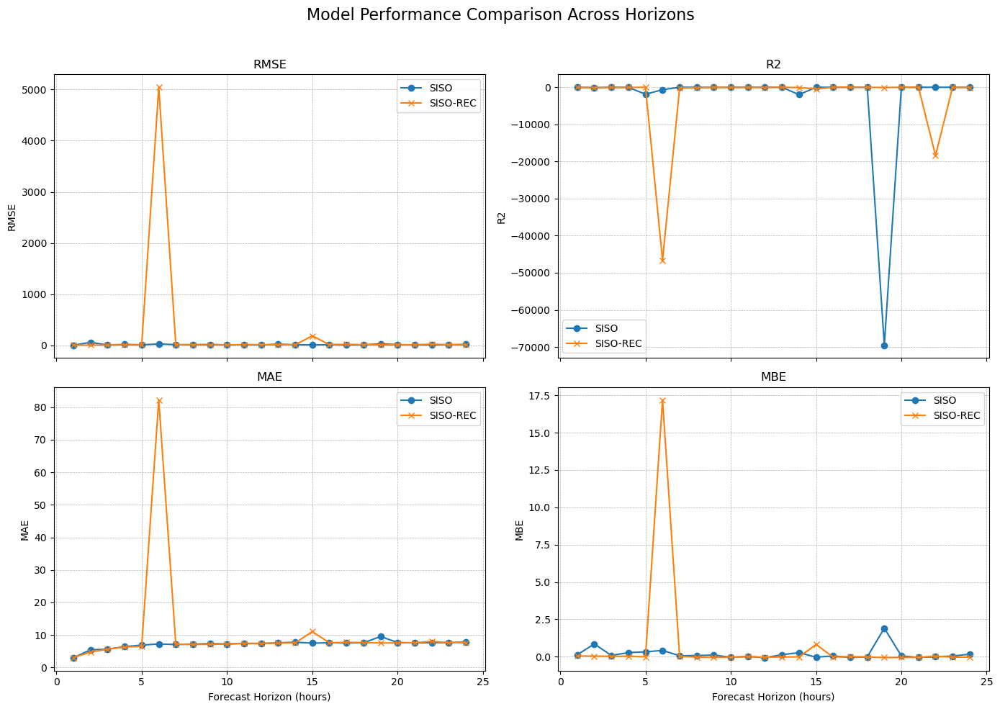

    - Generating Plot 2: Normalized Key Metrics Subplots (nRMSE, R2, nMAE, nMBE)...
Figure saved: figures/model_comparison_normalized_metrics.png


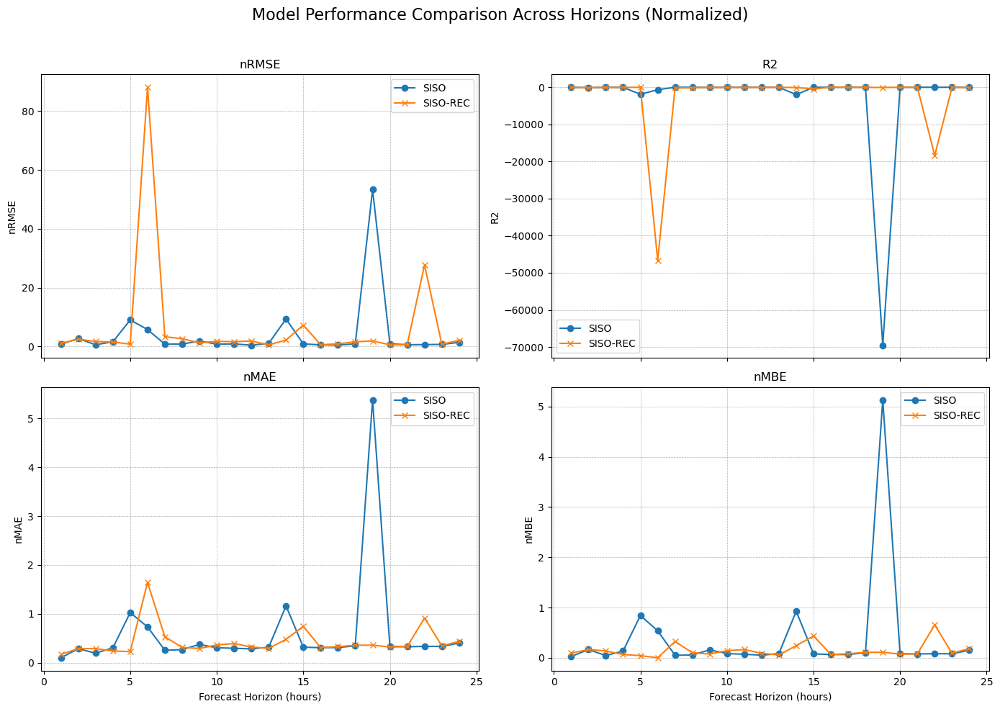

    - Generating Plot 3: Metrics by Energy Variable (Combined View)...
      - Plotting nRMSE...
Figure saved: figures/model_comparison_nrmse_by_variable.png


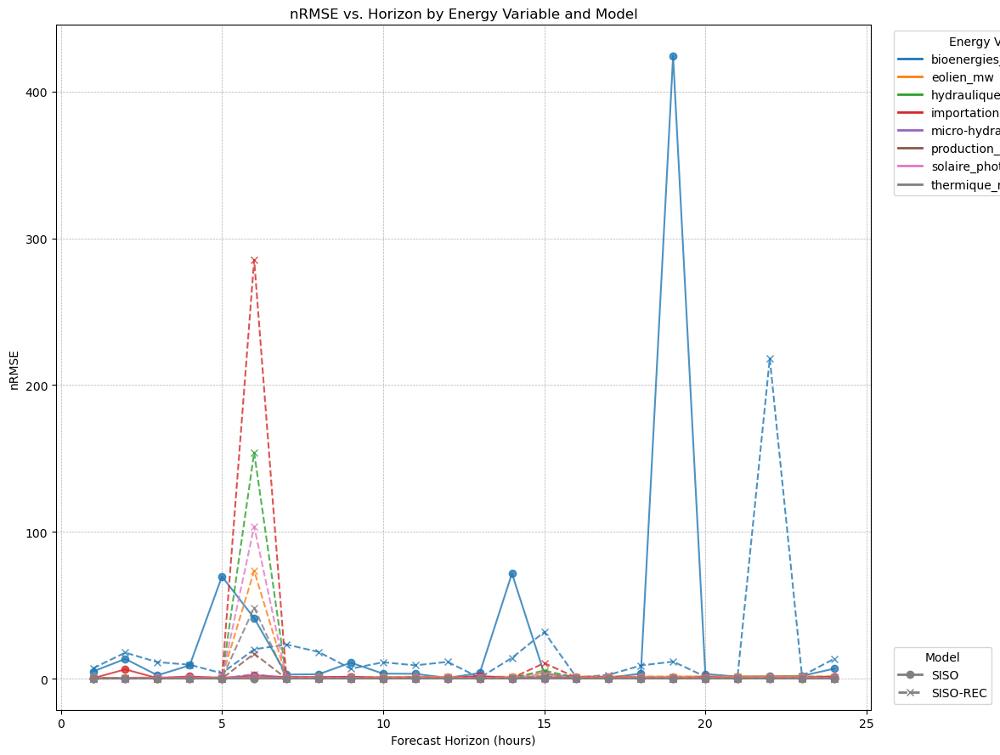

      - Plotting nMAE...
Figure saved: figures/model_comparison_nmae_by_variable.png


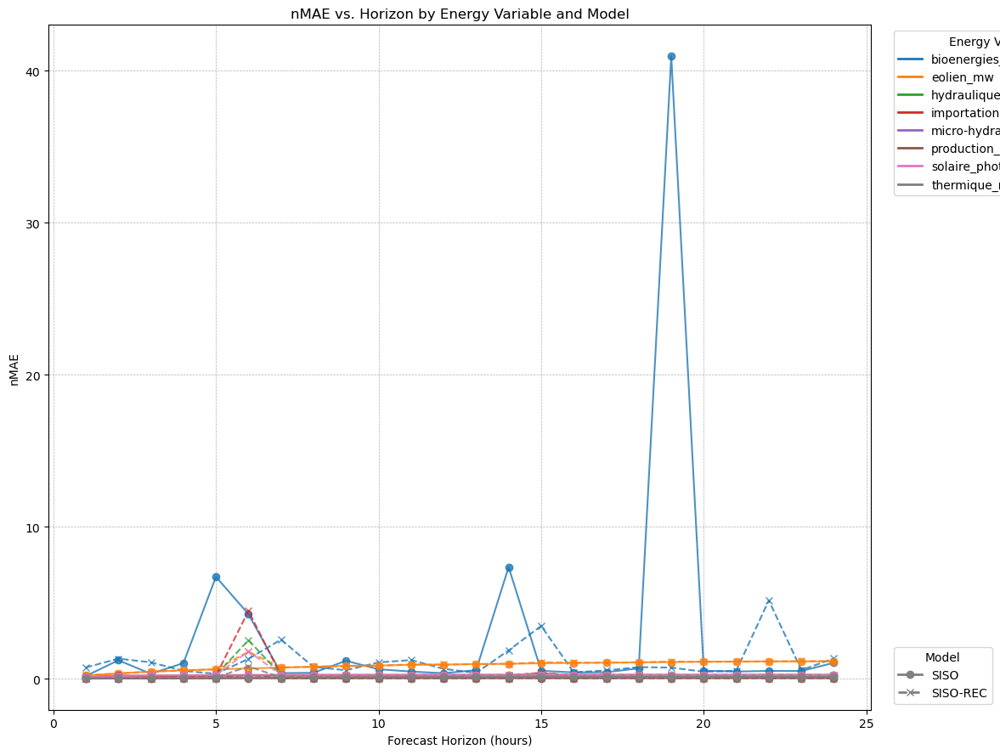

      - Plotting nMBE...
Figure saved: figures/model_comparison_nmbe_by_variable.png


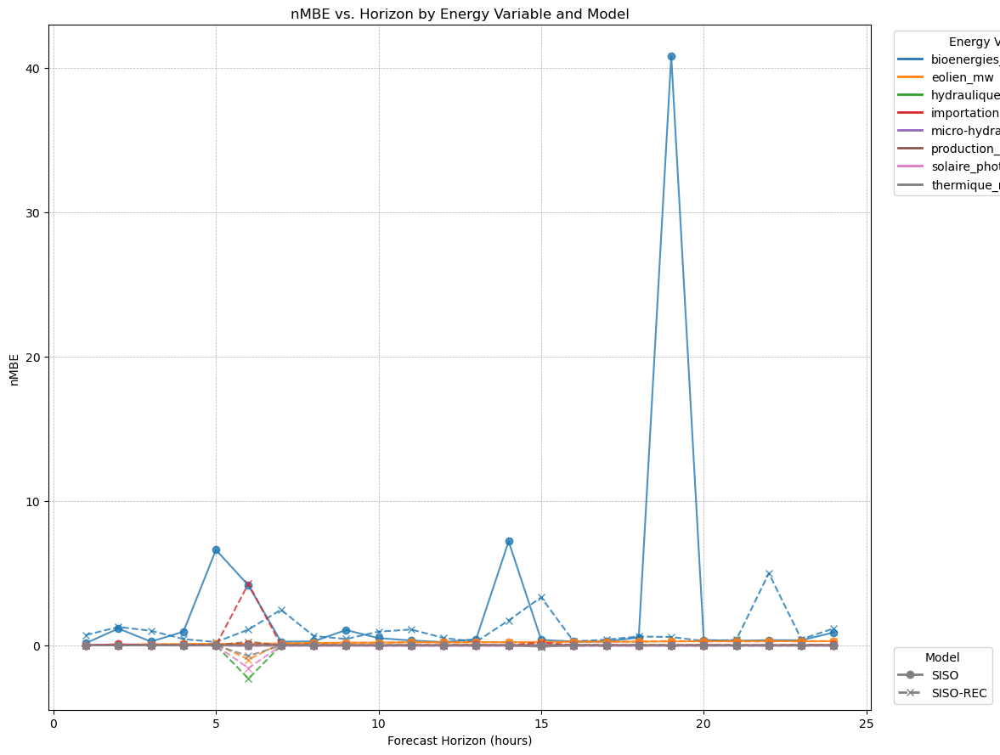

      - Plotting R2...
Figure saved: figures/model_comparison_r2_by_variable.png


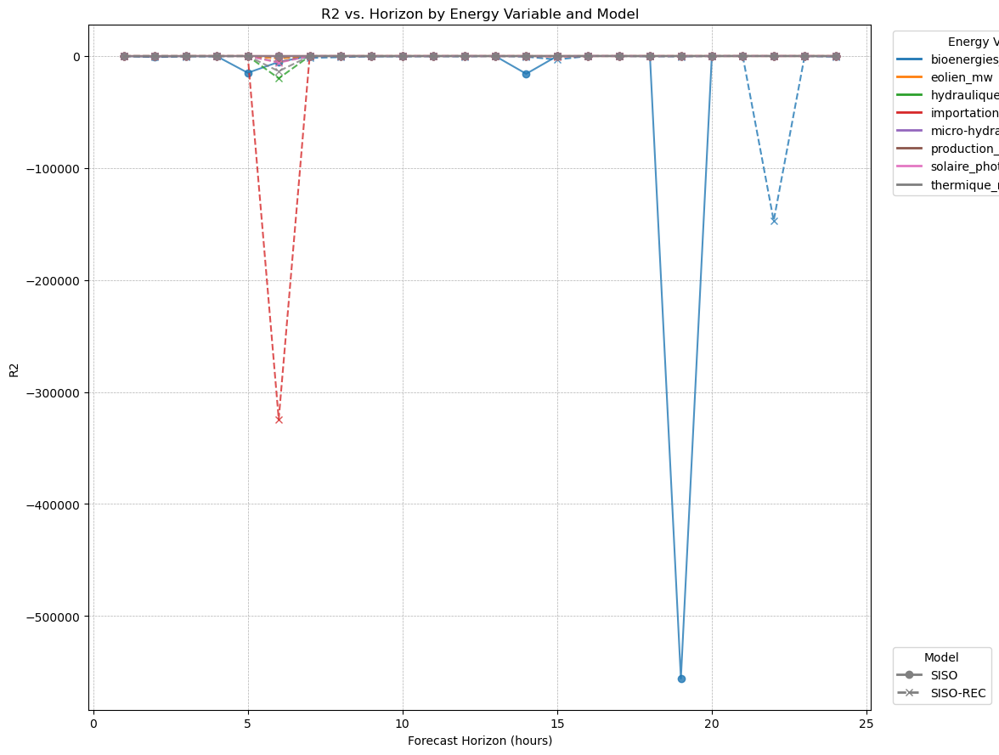

    - Generating Plot 4: Metrics by Energy Variable (Subplot View)...
      - Plotting nRMSE...
Figure saved: figures/nrmse_by_variable_subplots.png


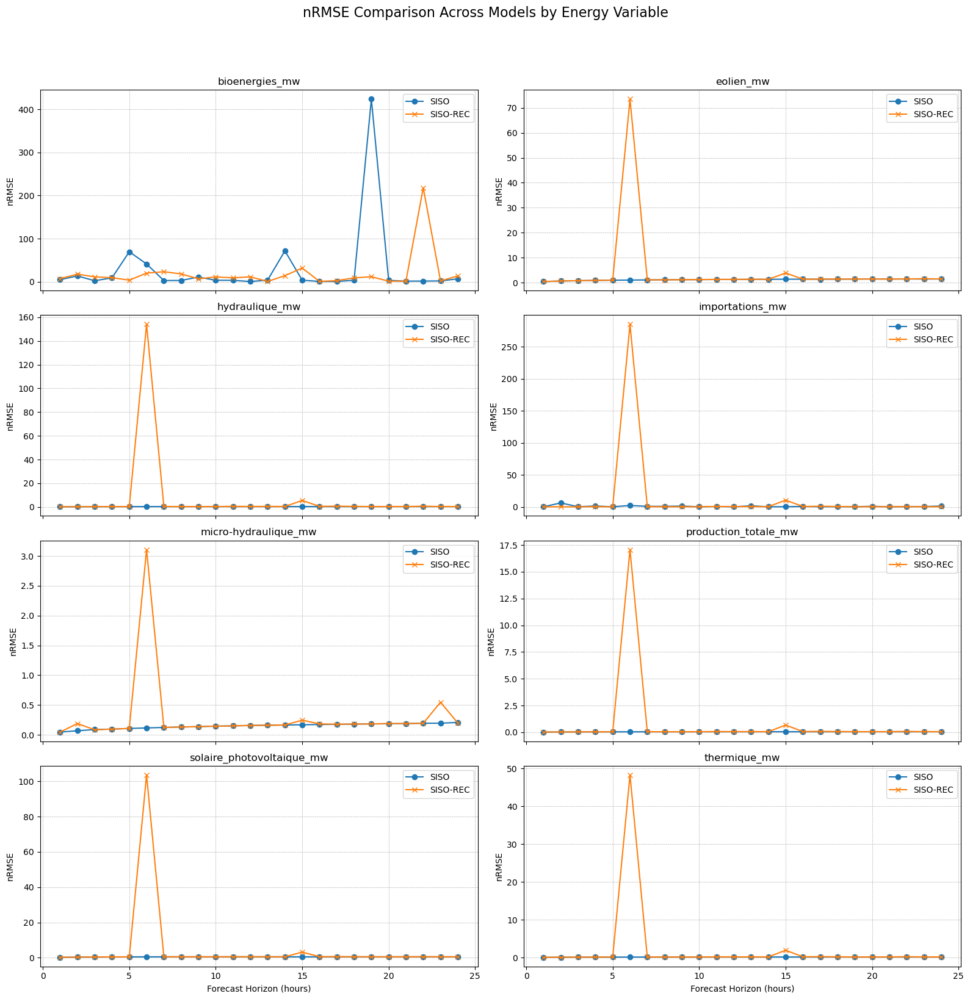

      - Plotting R2...
Figure saved: figures/r2_by_variable_subplots.png


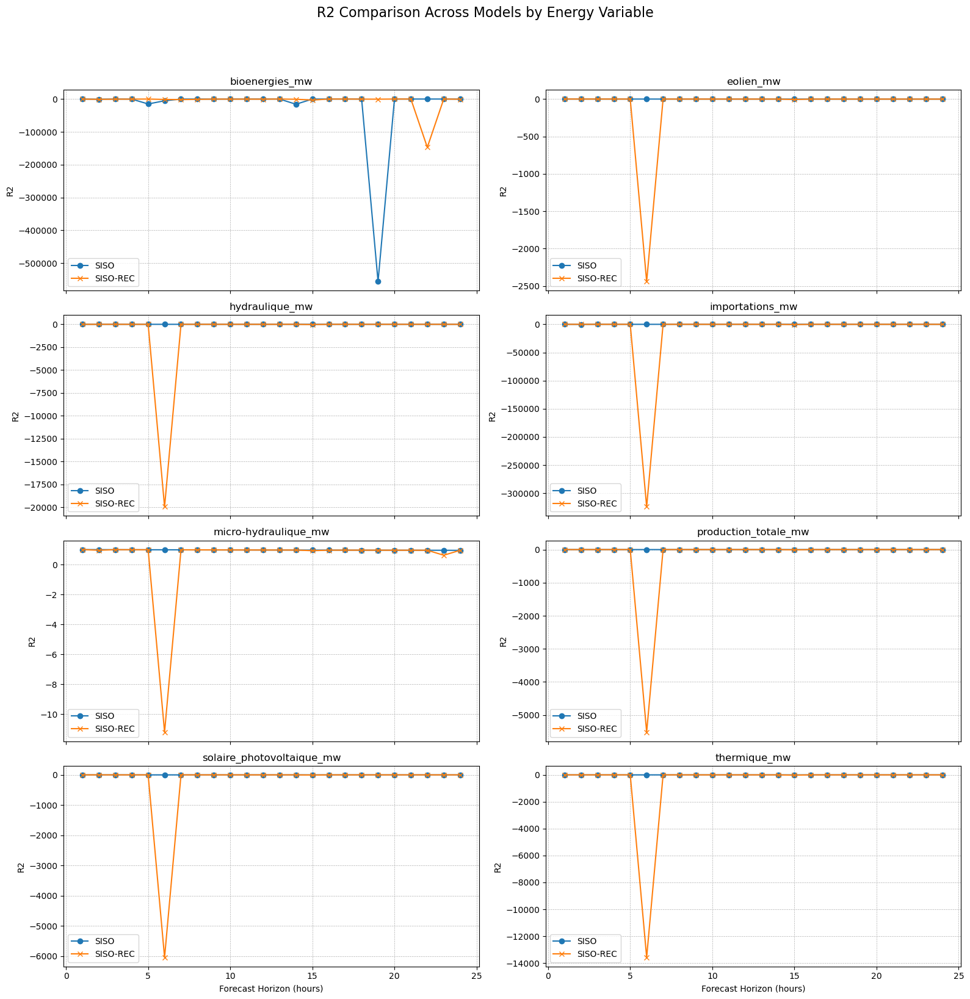

      - Plotting nMAE...
Figure saved: figures/nmae_by_variable_subplots.png


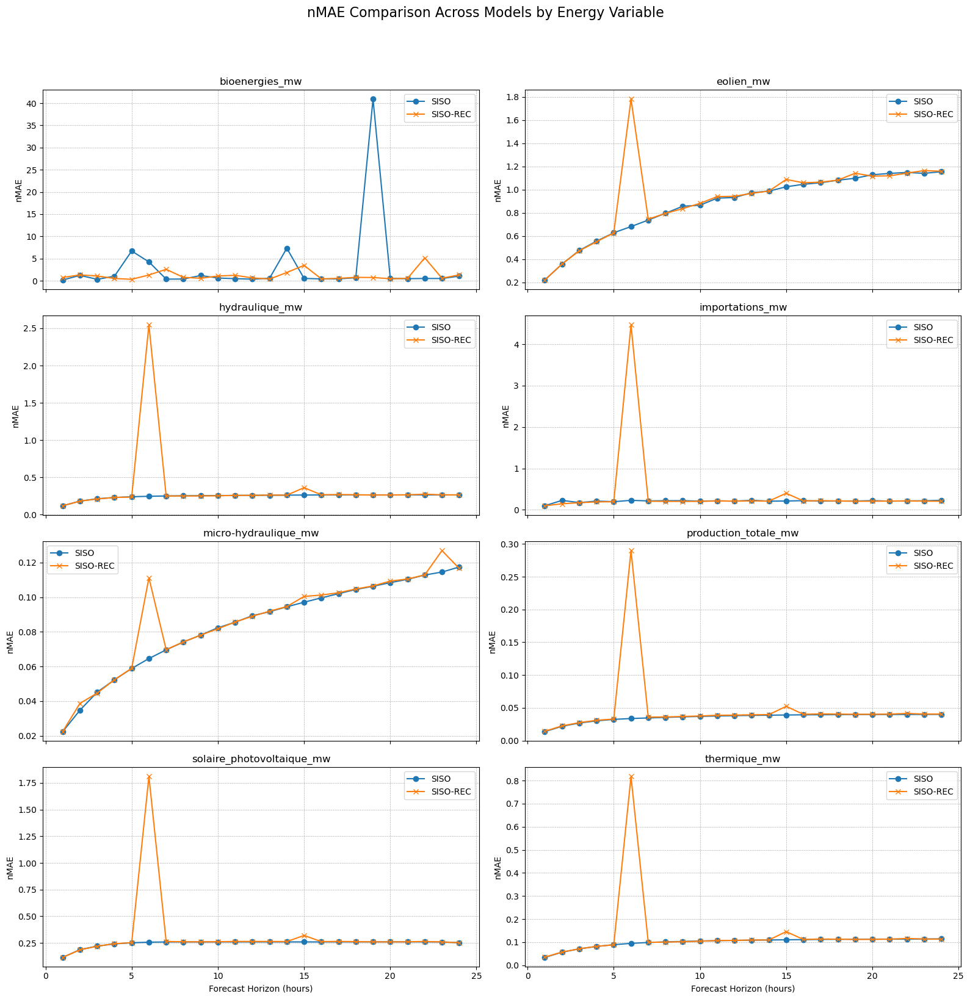

      - Plotting nMBE...
Figure saved: figures/nmbe_by_variable_subplots.png


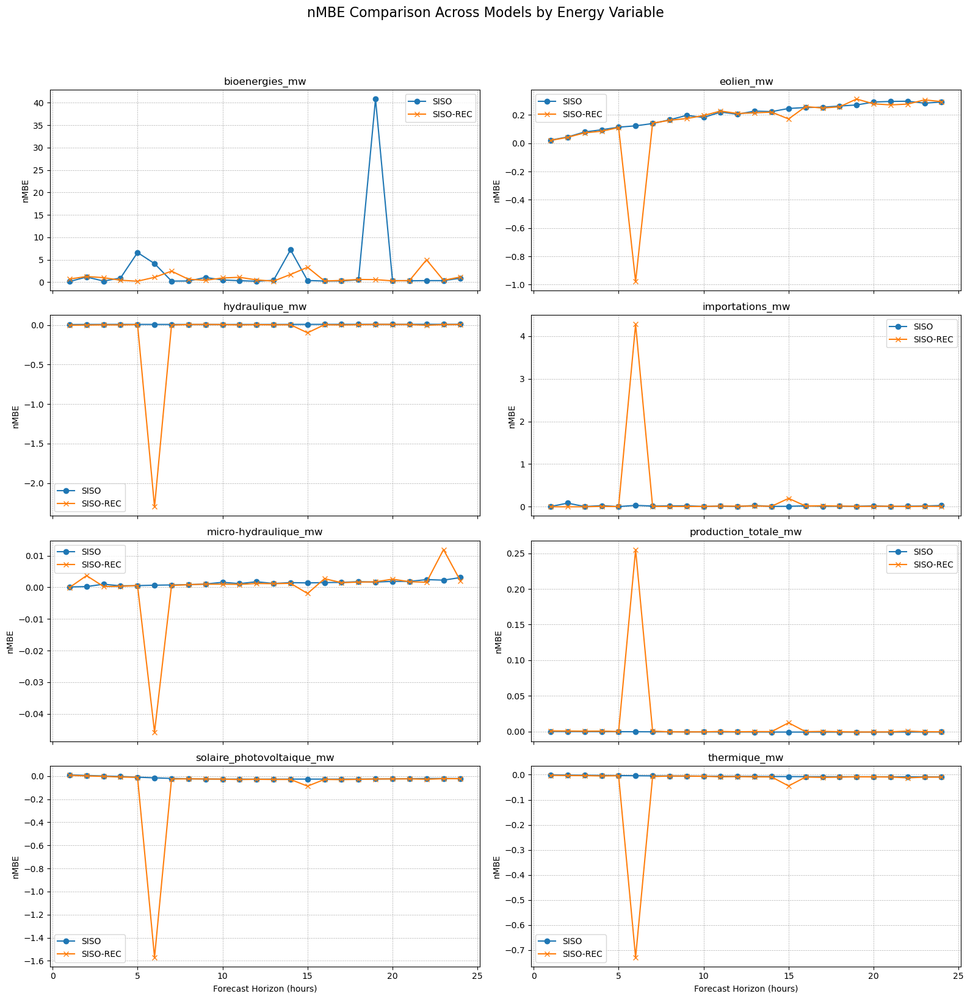

>>> [Step 5/5] Plot generation complete.



In [22]:
if __name__ == '__main__':
    main()

## Code modif 2

In [20]:
# menu.py
# ==============================================================================
def display_menu():
    """Displays the improved model selection menu."""
    print("\n" + "="*60)
    print("MODEL SELECTION MENU")
    print("="*60)
    print("--- Individual Models ---")
    print(" 1 : Run SISO")
    print(" 2 : Run MIMO")
    print(" 3 : Run MIMO-MH")
    print("\n--- Reconciled (REC) Models Only ---")
    print(" 4 : Run SISO-REC")
    print(" 5 : Run MIMO-REC")
    print(" 6 : Run MIMO-MH-REC")
    print("\n--- Combined Models (Base + Reconciled) ---")
    print(" 7 : Run SISO (Base + REC)")
    print(" 8 : Run MIMO (Base + REC)")
    print(" 9 : Run MIMO-MH (Base + REC)")
    print(" 10 : Run ALL ELM models (Base + REC)")
    print("\n--- External Models & Groups ---")
    print(" 11 : Run Prophet + TimeGPT")
    print(" 12 : Run ALL models (ELM Base + External)")
    print(" 13 : Run ALL models (ELM REC + External)")
    print("\n--- Custom ---")
    print(" 14 : Custom model selection")
    print("="*60)

def get_user_choice(max_choice):
    """Gets and validates the user's menu choice."""
    while True:
        try:
            choice = int(input(f"Please enter your choice (1-{max_choice}): "))
            if 1 <= choice <= max_choice:
                return choice
            else:
                print(f"Invalid choice. Please enter a number between 1 and {max_choice}.")
        except ValueError:
            print("Invalid input. Please enter a number.")

def get_custom_model_selection():
    """Allows for custom selection of models and reconciliation."""
    available_models = {
        1: "siso", 2: "mimo", 3: "mimo-mh",
        4: "prophet", 5: "timegpt"
    }
    elm_models = {"siso", "mimo", "mimo-mh"}
    
    print("\n" + "="*50)
    print("CUSTOM MODEL SELECTION")
    print("="*50)
    
    print("Available models:")
    for key, model in available_models.items():
        print(f"{key}: {model.upper()}")
        
    selected_models = []
    while True:
        try:
            choices_str = input("\nEnter the numbers of the models to run, separated by a comma (e.g., 1,3,4): ")
            choices = [int(c.strip()) for c in choices_str.split(',') if c.strip()]
            if all(c in available_models for c in choices):
                break
            else:
                print("One or more numbers are invalid. Please try again.")
        except ValueError:
            print("Invalid input. Make sure to enter numbers separated by commas.")

    models_to_run = []
    for choice in sorted(list(set(choices))): # Use sorted unique choices
        model_name = available_models[choice]
        if model_name in elm_models:
            while True:
                # Added 'b' for 'both' option
                rec_choice = input(f"  For {model_name.upper()}, run base, reconciled, or both? (n/y/b): ").lower()
                if rec_choice == 'n': # No
                    models_to_run.append((model_name, False))
                    break
                elif rec_choice == 'y': # Yes
                    models_to_run.append((model_name, True))
                    break
                elif rec_choice == 'b': # Both
                    models_to_run.append((model_name, False)) # Base version
                    models_to_run.append((model_name, True))  # Reconciled version
                    break
                else:
                    print("  Invalid response. Please enter 'n' (no), 'y' (yes), or 'b' (both).")
        else:
            models_to_run.append((model_name, False)) # Reconciliation not applicable
            
    selected_names = [f"{name.upper()}{'-REC' if rec else ''}" for name, rec in models_to_run]
    print(f"\nSelected models: {', '.join(selected_names)}")
    return models_to_run

def select_models():
    """
    Interactive function to select which models to run via the menu.
    Returns a list of tuples: (model_name, reconciliation_flag).
    """
    display_menu()
    user_choice = get_user_choice(14)
    
    # Model shortcuts
    siso, siso_rec = ('siso', False), ('siso', True)
    mimo, mimo_rec = ('mimo', False), ('mimo', True)
    mimo_mh, mimo_mh_rec = ('mimo-mh', False), ('mimo-mh', True)
    prophet, timegpt = ('prophet', False), ('timegpt', False)

    # --- Individual Models ---
    if user_choice == 1: return [siso]
    elif user_choice == 2: return [mimo]
    elif user_choice == 3: return [mimo_mh]
    
    # --- Reconciled (REC) Models Only ---
    elif user_choice == 4: return [siso_rec]
    elif user_choice == 5: return [mimo_rec]
    elif user_choice == 6: return [mimo_mh_rec]
    
    # --- Combined Models (Base + Reconciled) ---
    elif user_choice == 7: return [siso, siso_rec]
    elif user_choice == 8: return [mimo, mimo_rec]
    elif user_choice == 9: return [mimo_mh, mimo_mh_rec]
    elif user_choice == 10: return [siso, siso_rec, mimo, mimo_rec, mimo_mh, mimo_mh_rec]

    # --- External Models & Groups ---
    elif user_choice == 11: return [prophet, timegpt]
    elif user_choice == 12: return [siso, mimo, mimo_mh, prophet, timegpt]
    elif user_choice == 13: return [siso_rec, mimo_rec, mimo_mh_rec, prophet, timegpt]
    
    # --- Custom ---
    elif user_choice == 14: return get_custom_model_selection()
    
    return []

In [21]:
# timegpt.py
# ==============================================================================
# Placeholder for loading TimeGPT results.
import numpy as np
import pandas as pd
import os


def load_timegpt_metrics():
    # Modified to load a single metrics CSV file instead of multiple forecast files
    file_path = "metrics_with_tgpt_8000S.csv"
    if os.path.exists(file_path):
        metrics_df = pd.read_csv(file_path)
    else:
        print(f"      - Warning: Metrics file not found at {file_path}")
        metrics_df = None
    return metrics_df



In [22]:
# utils.py
# ==============================================================================
# Utility functions for data loading and preprocessing.
import unicodedata
import re
import pandas as pd
import numpy as np
from pathlib import Path
from numpy.lib.stride_tricks import sliding_window_view

def slugify(col: str) -> str:
    """Converts a string to a slug-like format (lowercase, underscores)."""
    col = unicodedata.normalize("NFKD", col).encode("ascii", "ignore").decode()
    col = re.sub(r"[^\w\s-]", "", col).strip().lower().replace(" ", "_")
    return col

def load_and_preprocess_data(
    file_path: Path,
    date_col: str = "Date",
    drop_policy: str = "mean", # "first", "last" or "mean"
) -> pd.DataFrame:
    """
    Load a CSV, normalize column names, create 'ds' from `date_col`,
    and deduplicate on 'ds' according to `drop_policy`.
    Returns a DataFrame with a unique, sorted 'ds' column.
    """
    print(">>> [Step 1/5] Loading and pre-processing data...")
    if not file_path.exists():
        raise FileNotFoundError(f"Data file not found at: {file_path}")
    
    df = pd.read_csv(file_path)
    # 1) normalize column names
    df.columns = [slugify(c) for c in df.columns]
    date_col = slugify(date_col)
    
    # 2) convert date → UTC
    df["ds"] = pd.to_datetime(df[date_col], utc=True)
    df = df.drop(columns=[date_col])
    
    # 3) handle duplicates on ds
    if drop_policy in ("first", "last"):
        before = len(df)
        df = df.drop_duplicates(subset="ds", keep=drop_policy)
        removed = before - len(df)
        if removed:
            print(f"    - {removed} duplicate(s) removed (keep='{drop_policy}').")
    elif drop_policy == "mean":
        df = df.groupby("ds", as_index=False).mean(numeric_only=True)
        print("    - Duplicates aggregated by taking the mean.")
    else:
        raise ValueError("drop_policy must be 'first', 'last' or 'mean'.")
    # 4) sort and reset index
    df = df.sort_values("ds").reset_index(drop=True)
    # 5) drop timezone if present
    if df["ds"].dt.tz is not None:
        df["ds"] = df["ds"].dt.tz_localize(None) # Make timezone-naive for compatibility
        
    print(f"    - Data loaded successfully: {len(df)} rows, {df.shape[1]} columns.")
    print(">>> [Step 1/5] Data loading complete.\n")
    return df



In [30]:
# Fichier : models.py
# ==============================================================================
# Ce module consolidé contient les fonctions pour exécuter les stratégies de 
# prévision (SISO, MIMO, MIMO-MH) en utilisant les implémentations améliorées.

import pandas as pd
import numpy as np
from scipy.linalg import pinv
from numpy.lib.stride_tricks import sliding_window_view

# ==============================================================================
# 1. FONCTIONS D'AIDE (Helpers)
# (Intégration de elm.py, reconciliation.py et utils.py)
# ==============================================================================

def train_elm(X_train, Y_train, X_test, Y_test, num_hidden, num_initializations, lambda_reg):
    """
    Entraîne un modèle ELM (Extreme Learning Machine) avec régularisation Ridge.
    Cette version est adaptée pour recevoir les hyperparamètres via des arguments.
    """
    best_rmse = float('inf')
    best_model = None
    for _ in range(num_initializations):
        # 1. Initialisation des poids (W) et biais (b) aléatoires
        W = np.random.rand(num_hidden, X_train.shape[1])
        b = np.random.rand(num_hidden, 1)
        
        # 2. Calcul de la matrice de la couche cachée (H)
        H = np.maximum(0, X_train @ W.T + b.T) # Activation ReLU
        
        # 3. Solution analytique pour beta (poids de sortie) avec régularisation Ridge
        HTH = H.T @ H
        HTY = H.T @ Y_train
        try:
            # Solution plus stable via np.linalg.solve
            identity = np.eye(HTH.shape[0])
            beta = np.linalg.solve(HTH + lambda_reg * identity, HTY)
        except np.linalg.LinAlgError:
            # Alternative avec la pseudo-inverse si la résolution échoue
            beta = pinv(H) @ Y_train
            
        # Évaluation de cette initialisation sur le jeu de test
        H_test = np.maximum(0, X_test @ W.T + b.T)
        Y_pred = np.maximum(H_test @ beta, 0) # Prédictions non-négatives
        rmse = np.mean(np.sqrt(np.mean((Y_test - Y_pred) ** 2, axis=0)))
        
        # Conserver le meilleur modèle
        if rmse < best_rmse:
            best_model = (W, b, beta)
            best_rmse = rmse
            
    return best_model

def predict_elm(X, model):
    """
    Effectue une passe avant (prédiction) pour un modèle ELM entraîné.
    """
    W, b, beta = model
    H = np.maximum(0, X @ W.T + b.T)
    Y_pred = np.maximum(H @ beta, 0)
    return Y_pred

def prepare_data_mimo_mh(input_matrix, num_rows, max_horizon, window_size, num_outputs):
    """
    Construit des matrices d'apprentissage supervisé (X, Y) pour l'entraînement 
    MIMO multi-horizon.
    """
    samples = num_rows - window_size - max_horizon + 1
    # Fenêtres d'entrée : [échantillon, caractéristiques_fenêtre_aplaties]
    X_windows = np.array([
        input_matrix[t : t + window_size].flatten()
        for t in range(samples)
    ])
    # Construit Y en concaténant le bloc de cibles futures
    Y_windows = np.array([
        input_matrix[t + window_size : t + window_size + max_horizon, :num_outputs].flatten()
        for t in range(samples)
    ])
    return X_windows, Y_windows

def create_S_from_outputs(output_names):
    """
    Construit la matrice d'agrégation S en supposant que la première sortie est le total.
    """
    m = len(output_names) - 1  # Nombre de séries de plus bas niveau
    S = np.zeros((m + 1, m), dtype=float)
    S[0, :] = 1.0              # Le total est la somme des autres
    S[1:, :] = np.eye(m)       # Chaque série de bas niveau se mappe sur elle-même
    return S

def estimate_W_from_train_residuals(Y_true_mh_train, Y_pred_mh_train, diagonal=True):
    """
    Estime la (co)variance de l'erreur par horizon à partir des résidus d'entraînement.
    """
    n_h, n_o = Y_true_mh_train.shape[1], Y_true_mh_train.shape[2]
    W_list = []
    for h in range(n_h):
        E = Y_true_mh_train[:, h, :] - Y_pred_mh_train[:, h, :]
        if diagonal:
            v = np.var(E, axis=0, ddof=1)
            v = np.maximum(v, 1e-8) # Plancher numérique pour la stabilité
            W = np.diag(v)
        else:
            W = np.cov(E.T, ddof=1) + 1e-6 * np.eye(n_o) # Covariance complète avec une petite crête
        W_list.append(W)
    return W_list

def reconcile_all_horizons(Y_pred_mh, S, W_list):
    """
    Applique la réconciliation MinT-Diagonal (WLS) pour chaque horizon.
    """
    n_s, n_h, n_o = Y_pred_mh.shape
    Y_rec = np.empty_like(Y_pred_mh)
    for h in range(n_h):
        W = W_list[h]
        W_inv = np.linalg.pinv(W)
        StW_inv = S.T @ W_inv
        P = np.linalg.pinv(StW_inv @ S) @ StW_inv
        H_proj = S @ P
        Yh_rec = (H_proj @ Y_pred_mh[:, h, :].T).T
        Y_rec[:, h, :] = Yh_rec
    return Y_rec

# ==============================================================================
# 2. FONCTIONS D'EXÉCUTION DES MODÈLES (API Publique)
# (Mises à jour avec le code 2 et adaptées pour l'intégration)
# ==============================================================================

def run_siso_all_horizons(df_all, split_date, output_names, max_horizon, window_size, elm_params, reconcile=False):
    """
    Exécute les modèles SISO pour chaque (cible, horizon) en utilisant une 
    fenêtre glissante vectorisée et une réconciliation optionnelle.
    """
    model_name_log = "SISO-REC" if reconcile else "SISO"
    print(f"    - Running {model_name_log} model...")
    
    # --- Préparation
    datetime_index = pd.to_datetime(df_all["ds"])
    T, H, W, O = len(df_all), int(max_horizon), int(window_size), len(output_names)
    S_aligned = T - W - H + 1
    if S_aligned <= 0:
        raise ValueError("Pas assez de données pour la taille de fenêtre et l'horizon demandés.")

    split_ts = pd.to_datetime(split_date)
    train_masks, test_masks, test_datetimes = {}, {}, {}
    
    # --- Précalcul des masques et horodatages pour chaque horizon
    for h in range(1, H + 1):
        dt_h = datetime_index[W + h - 1 : W + h - 1 + S_aligned]
        train_masks[h] = dt_h < split_ts
        test_masks[h] = ~train_masks[h]
        test_datetimes[h] = dt_h[test_masks[h]] + pd.to_timedelta(h, "h")
        
    # --- Conteneurs pour les résultats
    Y_pred_train_mh, Y_true_train_mh = [], []
    Y_pred_test_mh, Y_true_test_mh = [], []

    # --- Boucle sur les sorties (SISO)
    for out_name in output_names:
        y = df_all[out_name].to_numpy()
        X_windows = sliding_window_view(y, window_shape=W)[:S_aligned]
        Y_future = sliding_window_view(y, window_shape=W + H)[:S_aligned, W:]
        
        # Listes temporaires par sortie
        y_true_train_h, y_pred_train_h = [], []
        y_true_test_h, y_pred_test_h = [], []
        
        for h in range(1, H + 1):
            X_train, Y_train = X_windows[train_masks[h]], Y_future[train_masks[h], h-1:h]
            X_test, Y_test = X_windows[test_masks[h]], Y_future[test_masks[h], h-1:h]

            model = train_elm(
                X_train, Y_train, X_test, Y_test,
                num_hidden=elm_params['n_hidden'],
                num_initializations=elm_params['n_init'],
                lambda_reg=elm_params['lambda_reg']
            )
            
            y_true_train_h.append(Y_train)
            y_pred_train_h.append(predict_elm(X_train, model))
            y_true_test_h.append(Y_test)
            y_pred_test_h.append(predict_elm(X_test, model))

        Y_true_train_mh.append(y_true_train_h)
        Y_pred_train_mh.append(y_pred_train_h)
        Y_true_test_mh.append(y_true_test_h)
        Y_pred_test_mh.append(y_pred_test_h)

    # --- Assemblage des tenseurs 3D (échantillons, horizons, sorties)
    min_len_train = min(len(y) for out_list in Y_true_train_mh for y in out_list)
    min_len_test = min(len(y) for out_list in Y_true_test_mh for y in out_list)

    def assemble_tensor(data_list, min_len):
        tensor = np.zeros((min_len, H, O))
        for o in range(O):
            for h in range(H):
                tensor[:, h, o] = data_list[o][h][:min_len].ravel()
        return tensor

    Y_true_train_tensor = assemble_tensor(Y_true_train_mh, min_len_train)
    Y_pred_train_tensor = assemble_tensor(Y_pred_train_mh, min_len_train)
    Y_true_test_tensor = assemble_tensor(Y_true_test_mh, min_len_test)
    Y_pred_test_tensor = assemble_tensor(Y_pred_test_mh, min_len_test)

    # --- Réconciliation optionnelle
    df_results = pd.DataFrame()
    if reconcile:
        print("        - Applying reconciliation...")
        S = create_S_from_outputs(output_names)
        W_list = estimate_W_from_train_residuals(Y_true_train_tensor, Y_pred_train_tensor, diagonal=True)
        Y_rec_tensor = reconcile_all_horizons(Y_pred_test_tensor, S, W_list)
    
    # --- Construction du DataFrame final
    records = []
    for h_idx, h in enumerate(range(1, H + 1)):
        dt_h = test_datetimes[h][:min_len_test]
        for s_idx in range(min_len_test):
            for o_idx, o_name in enumerate(output_names):
                row = {
                    'datetime': dt_h.iloc[s_idx], 'horizon': h, 'output': o_name,
                    'y_true': Y_true_test_tensor[s_idx, h_idx, o_idx],
                    'y_pred': Y_pred_test_tensor[s_idx, h_idx, o_idx]
                }
                if reconcile:
                    row["y_pred_rec"] = Y_rec_tensor[s_idx, h_idx, o_idx]
                records.append(row)

    print(f"    - {model_name_log} model finished.")
    return pd.DataFrame(records)


def run_mimo_all_horizons(df_all, split_date, output_names, max_horizon, window_size, elm_params, reconcile=False):
    """
    Exécute les modèles MIMO (un par horizon) avec réconciliation optionnelle.
    """
    model_name_log = "MIMO-REC" if reconcile else "MIMO"
    print(f"    - Running {model_name_log} model...")

    # --- Préparation des données
    input_matrix = df_all[output_names].values
    num_rows, num_outputs = len(df_all), len(output_names)
    datetime_index = pd.to_datetime(df_all['ds'])
    
    Y_true_train_list, Y_pred_train_list = [], []
    Y_true_test_list, Y_pred_test_list = [], []
    test_datetimes_list = []

    # --- Entraînement par horizon
    for h in range(1, max_horizon + 1):
        samples = num_rows - window_size - h + 1
        X_windows = np.array([input_matrix[t:t+window_size].flatten() for t in range(samples)])
        Y_windows = np.array([input_matrix[t+window_size+h-1, :num_outputs] for t in range(samples)])
        
        sample_datetimes = datetime_index[window_size+h-1 : window_size+h-1+samples]
        train_mask = sample_datetimes < pd.to_datetime(split_date)
        test_mask = ~train_mask
        
        X_train, Y_train = X_windows[train_mask], Y_windows[train_mask]
        X_test, Y_test = X_windows[test_mask], Y_windows[test_mask]
        
        model = train_elm(
            X_train, Y_train, X_test, Y_test,
            num_hidden=elm_params['n_hidden'],
            num_initializations=elm_params['n_init'],
            lambda_reg=elm_params['lambda_reg']
        )
        
        Y_pred_train_list.append(predict_elm(X_train, model))
        Y_pred_test_list.append(predict_elm(X_test, model))
        Y_true_train_list.append(Y_train)
        Y_true_test_list.append(Y_test)
        test_datetimes_list.append(sample_datetimes[test_mask])

    # --- Assemblage des tenseurs 3D
    min_train = min(len(y) for y in Y_true_train_list)
    min_test = min(len(y) for y in Y_true_test_list)

    Y_true_train_mh = np.stack([y[:min_train] for y in Y_true_train_list], axis=1)
    Y_pred_train_mh = np.stack([y[:min_train] for y in Y_pred_train_list], axis=1)
    Y_true_test_mh = np.stack([y[:min_test] for y in Y_true_test_list], axis=1)
    Y_pred_test_mh = np.stack([y[:min_test] for y in Y_pred_test_list], axis=1)

    # --- Réconciliation optionnelle
    if reconcile:
        print("        - Applying reconciliation...")
        S = create_S_from_outputs(output_names)
        W_list = estimate_W_from_train_residuals(Y_true_train_mh, Y_pred_train_mh, diagonal=True)
        Y_rec_tensor = reconcile_all_horizons(Y_pred_test_mh, S, W_list)

    # --- Construction du DataFrame final
    records = []
    for h_idx, h in enumerate(range(1, max_horizon + 1)):
        dt_h = test_datetimes_list[h_idx][:min_test]
        for s_idx in range(min_test):
            for o_idx, o_name in enumerate(output_names):
                row = {
                    'datetime': dt_h.iloc[s_idx], 'horizon': h, 'output': o_name,
                    'y_true': Y_true_test_mh[s_idx, h_idx, o_idx],
                    'y_pred': Y_pred_test_mh[s_idx, h_idx, o_idx]
                }
                if reconcile:
                    row["y_pred_rec"] = Y_rec_tensor[s_idx, h_idx, o_idx]
                records.append(row)

    print(f"    - {model_name_log} model finished.")
    return pd.DataFrame(records)


def run_mimo_mh_all_horizons(df_all, split_date, output_names, max_horizon, window_size, elm_params, reconcile=False):
    """
    Entraîne un modèle MIMO-MH unique qui prédit conjointement tous les horizons,
    avec une réconciliation hiérarchique optionnelle.
    """
    model_name_log = "MIMO-MH-REC" if reconcile else "MIMO-MH"
    print(f"    - Running {model_name_log} model...")
    
    # --- Séparation train/test
    train_df = df_all[df_all['ds'] < split_date].copy()
    test_df = df_all[df_all['ds'] >= split_date].copy()

    feature_cols = [c for c in df_all.columns if c != 'ds']
    input_train = train_df[feature_cols].fillna(0).values
    input_test = test_df[feature_cols].fillna(0).values
    dt_index_test = test_df['ds'].reset_index(drop=True)
    num_outputs = len(output_names)

    # --- Construction des jeux de données MIMO-MH
    X_train, Y_train = prepare_data_mimo_mh(input_train, len(input_train), max_horizon, window_size, num_outputs)
    X_test, Y_test = prepare_data_mimo_mh(input_test, len(input_test), max_horizon, window_size, num_outputs)

    # --- Entraînement et prédiction ELM
    model = train_elm(
        X_train, Y_train, X_test, Y_test,
        num_hidden=elm_params['n_hidden'],
        num_initializations=elm_params['n_init'],
        lambda_reg=elm_params['lambda_reg']
    )
    Y_pred_train = predict_elm(X_train, model)
    Y_pred_test = predict_elm(X_test, model)

    # --- Remise en forme des tenseurs 3D
    Y_train_mh = Y_train.reshape(-1, max_horizon, num_outputs)
    Y_test_mh = Y_test.reshape(-1, max_horizon, num_outputs)
    Y_pred_mh = Y_pred_test.reshape(-1, max_horizon, num_outputs)
    Y_pred_train_mh = Y_pred_train.reshape(-1, max_horizon, num_outputs)

    # --- Réconciliation optionnelle
    if reconcile:
        print("        - Applying reconciliation...")
        S = create_S_from_outputs(output_names)
        W_list = estimate_W_from_train_residuals(Y_train_mh, Y_pred_train_mh, diagonal=True)
        Y_rec_tensor = reconcile_all_horizons(Y_pred_mh, S, W_list)

    # --- Construction du DataFrame final
    records = []
    min_samples = Y_test_mh.shape[0]
    for h in range(max_horizon):
        dt_h = dt_index_test[window_size + h : window_size + h + min_samples]
        for s_idx in range(min_samples):
            for o_idx, o_name in enumerate(output_names):
                row = {
                    'datetime': dt_h.iloc[s_idx], 'horizon': h + 1, 'output': o_name,
                    'y_true': Y_test_mh[s_idx, h, o_idx],
                    'y_pred': Y_pred_mh[s_idx, h, o_idx]
                }
                if reconcile:
                    row["y_pred_rec"] = Y_rec_tensor[s_idx, h, o_idx]
                records.append(row)
                
    print(f"    - {model_name_log} model finished.")
    return pd.DataFrame(records)

In [31]:
# metrics.py
# ==============================================================================
# Functions for computing and handling performance metrics.

from sklearn.metrics import r2_score
import numpy as np
import pandas as pd
from pathlib import Path
import unicodedata
import re

# COMPUTE ALL METRICS
# -----------------------------------------------------------------------------
# What this does:
# • Groups the long results table `df` by (model, horizon, output).
# • For each group, computes:
#     - RMSE, MAE, MBE (error stats) and R² (goodness of fit).
#     - Normalized versions nRMSE, nMAE, nMBE using mean(y_true) as the scale.
# • Returns a tidy `metrics_df` with one row per (model, horizon, output).
#
# Notes:
# • If mean(y_true) == 0, normalized metrics are set to NaN to avoid division by zero.
# • R² requires at least 2 points; otherwise it’s NaN.
# • Expects columns: ['model','horizon','output','y_true','y_pred'] in `df`.
def compute_all_metrics(df):
    """Computes a standard set of metrics (nRMSE, nMAE, nMBE, R2, etc.) from a results DataFrame."""
    print(">>> [Step 3/5] Computing performance metrics...")
    if df.empty:
        return pd.DataFrame(columns=["model", "horizon", "output", "nRMSE", "nMAE", "nMBE", "R2", "RMSE", "MAE", "MBE"])
    metrics_list = []
    # Group by model, horizon, and output variable to calculate metrics for each segment
    grouped = df.groupby(['model', 'horizon', 'output'])
    for (model, horizon, output), group in grouped:
        y_true = group['y_true'].values
        y_pred = group['y_pred'].values
        
        if len(y_true) == 0: continue

        error = y_pred - y_true
        mae = np.mean(np.abs(error))
        mbe = np.mean(error)
        rmse = np.sqrt(np.mean(error ** 2))
        r2 = r2_score(y_true, y_pred) if len(y_true) > 1 else np.nan
        
        mean_true = np.mean(y_true)
        # Calculate normalized metrics, handling division by zero
        nmae = mae / mean_true if mean_true != 0 else np.nan
        nmbe = mbe / mean_true if mean_true != 0 else np.nan
        nrmse = rmse / mean_true if mean_true != 0 else np.nan
        
        metrics_list.append([
            model, horizon, output,
            nrmse, nmae, nmbe, r2, rmse, mae, mbe
        ])
        
    metrics_df = pd.DataFrame(
        metrics_list,
        columns=["model", "horizon", "output", "nRMSE", "nMAE", "nMBE", "R2", "RMSE", "MAE", "MBE"]
    )
    print(f"    - Metrics computed for {len(metrics_df)} combinations.")
    print(">>> [Step 3/5] Metrics computation complete.\n")
    return metrics_df

def stack_external_metrics(forecast_dfs: dict[str, pd.DataFrame], model_name: str) -> pd.DataFrame:
    """Converts forecast DataFrames (like from Prophet) into a standardized metrics DataFrame."""
    print(f"    - Computing metrics for {model_name}...")
    frames = []
    _H_RE = re.compile(r"\d+") # Regex to find horizon number in column names like 'yhat24'
    
    for out_name, df in forecast_dfs.items():
        yhat_cols = [c for c in df.columns if str(c).lower().startswith("yhat")]
        
        for col in yhat_cols:
            m = _H_RE.findall(str(col))
            if not m: continue
            h = int(m[-1])

            sub = df[["y", col]].dropna()
            if sub.empty: continue
            
            y_true = sub["y"].to_numpy(float)
            y_pred = sub[col].to_numpy(float)
            
            # Re-use the metric calculation logic
            error = y_pred - y_true
            mae, mbe, rmse = np.mean(np.abs(error)), np.mean(error), np.sqrt(np.mean(error**2))
            r2 = r2_score(y_true, y_pred)
            mean_true = np.mean(y_true)
            
            nrmse = rmse / mean_true if mean_true != 0 else np.nan
            nmae = mae / mean_true if mean_true != 0 else np.nan
            nmbe = mbe / mean_true if mean_true != 0 else np.nan
            
            row = {
                "model": model_name, "horizon": h, "output": out_name,
                "nRMSE": nrmse, "nMAE": nmae, "nMBE": nmbe, "R2": r2, 
                "RMSE": rmse, "MAE": mae, "MBE": mbe
            }
            frames.append(row)
            
    print(f"    - {model_name} metrics finished.")
    return pd.DataFrame(frames)

In [32]:
# prophet.py
# ==============================================================================
# Functions to load and process Prophet model results.
import pandas as pd
from pathlib import Path

def load_prophet_forecasts(targets):
    """Loads pre-computed Prophet forecast files."""
    print("    - Loading pre-computed Prophet forecasts...")
    # This assumes forecast files are stored in a specific directory
    base_path = Path("neuralprophet_results/forecasts/")
    forecast_dfs = {}
    
    for target in targets:
        file_path = base_path / f"{target}_forecast_last2y.csv"
        if file_path.exists():
            forecast_dfs[target] = pd.read_csv(file_path)
        else:
            print(f"      - Warning: Prophet forecast file not found for '{target}' at {file_path}")
            
    return forecast_dfs

In [33]:
# plotting.py
# ==============================================================================
# Functions for visualizing model performance.

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib import rcParams
import numpy as np


def plot_metrics_subplots(metrics_df, models_to_plot=None):
    """
    Plots nRMSE, R2, MAE, and MBE in a 2x2 subplot figure.
    Each subplot compares the performance of different models across the forecast horizon.
    """
    print(">>> [Step 5/5] Generating plots...")
    print("    - Generating Plot 1: Key Metrics Subplots (RMSE, R2, MAE, MBE)...")
    
    if models_to_plot:
        metrics_df = metrics_df[metrics_df["model"].isin(models_to_plot)].copy()

    models = sorted(metrics_df["model"].unique())
    markers = ['o', 'x', 's', '^', 'd', 'v']
    marker_map = {model: markers[i % len(markers)] for i, model in enumerate(models)}

    fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
    fig.suptitle("Model Performance Comparison Across Horizons", fontsize=16)
    
    metric_names = ["RMSE", "R2", "MAE", "MBE"]
    
    for ax, metric in zip(axs.flat, metric_names):
        for model in models:
            # Calculate the mean metric value across all outputs for each horizon
            data = (metrics_df[metrics_df["model"] == model]
                    .groupby("horizon", observed=True)[metric]
                    .mean())
            ax.plot(data.index, data.values, marker=marker_map[model], linestyle='-', label=model)
        
        ax.set_title(metric)
        ax.set_ylabel(metric)
        ax.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax.legend()
    
    # Common X-axis label
    axs[1, 0].set_xlabel("Forecast Horizon (hours)")
    axs[1, 1].set_xlabel("Forecast Horizon (hours)")
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

def plot_normalized_metrics_subplots(metrics_df, models_to_plot=None):
    """
    Plots nRMSE, R2, nMAE, and nMBE in a 2x2 subplot figure.
    Each subplot compares the performance of different models across the forecast horizon.
    """
    print("    - Generating Plot 2: Normalized Key Metrics Subplots (nRMSE, R2, nMAE, nMBE)...")
    
    if models_to_plot:
        metrics_df = metrics_df[metrics_df["model"].isin(models_to_plot)].copy()

    models = sorted(metrics_df["model"].unique())
    markers = ['o', 'x', 's', '^', 'd', 'v']
    marker_map = {model: markers[i % len(markers)] for i, model in enumerate(models)}

    fig, axs = plt.subplots(2, 2, figsize=(14, 10), sharex=True)
    fig.suptitle("Model Performance Comparison Across Horizons (Normalized)", fontsize=16)
    
    metric_names = ["nRMSE", "R2", "nMAE", "nMBE"]
    
    for ax, metric in zip(axs.flat, metric_names):
        for model in models:
            # Calculate the mean metric value across all outputs for each horizon
            data = (metrics_df[metrics_df["model"] == model]
                    .groupby("horizon", observed=True)[metric]
                    .mean())
            ax.plot(data.index, data.values, marker=marker_map[model], linestyle='-', label=model)
        
        ax.set_title(metric)
        ax.set_ylabel(metric)
        ax.grid(True, which='both', linestyle='--', linewidth=0.5)
        ax.legend()
    
    # Common X-axis label
    axs[1, 0].set_xlabel("Forecast Horizon (hours)")
    axs[1, 1].set_xlabel("Forecast Horizon (hours)")
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    
    # Savefig
    filename = f"figures/model_comparison_normalized_metrics.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"Figure saved: {filename}")
    
    plt.show()

def plot_all_metrics_by_energy_variable(metrics_df, models_to_plot=None):
    """
    Plots nRMSE, nMAE, nMBE, and R2 for each output variable on separate large plots.
    On each plot, colors represent the output, while line styles/markers represent the model.
    """
    print("    - Generating Plot 3: Metrics by Energy Variable (Combined View)...")

    if models_to_plot:
        metrics_df = metrics_df[metrics_df["model"].isin(models_to_plot)].copy()

    outputs = sorted(metrics_df["output"].unique())
    models = sorted(metrics_df["model"].unique())
    
    # Define consistent styling for models
    styles = ['-', '--', ':', '-.']
    markers = ['o', 'x', 's', '^', 'd', 'v', '<', '>']
    linestyle_by_model = {model: styles[i % len(styles)] for i, model in enumerate(models)}
    marker_by_model = {model: markers[i % len(markers)] for i, model in enumerate(models)}
    
    # Use matplotlib's color cycle for variables
    prop_cycle = rcParams.get("axes.prop_cycle", plt.cycler(color=plt.cm.viridis(np.linspace(0, 1, len(outputs)))))
    color_iterator = iter(prop_cycle)
    color_map = {out: next(color_iterator)['color'] for out in outputs}

    # List of metrics to plot
    metrics_to_plot = ["nRMSE", "nMAE", "nMBE", "R2"]

    # Loop over each metric to create a separate plot
    for metric in metrics_to_plot:
        print(f"      - Plotting {metric}...")
        fig, ax = plt.subplots(figsize=(14, 9))
        
        for out in outputs:
            for model in models:
                data = (metrics_df[(metrics_df["output"] == out) & (metrics_df["model"] == model)]
                        .sort_values("horizon"))
                if data.empty:
                    continue
                
                ax.plot(
                    data["horizon"], data[metric],  # Use the current metric for y-data
                    label=f"{out} ({model})",
                    linestyle=linestyle_by_model[model],
                    marker=marker_by_model[model],
                    color=color_map[out],
                    alpha=0.8
                )

        ax.set_xlabel("Forecast Horizon (hours)")
        ax.set_ylabel(metric) # Update Y-axis label
        ax.set_title(f"{metric} vs. Horizon by Energy Variable and Model") # Update title
        ax.grid(True, which='both', linestyle='--', linewidth=0.5)
        
        # Create custom legends for clarity
        output_handles = [Line2D([0], [0], color=color_map[o], lw=2, label=o) for o in outputs]
        model_handles = [Line2D([0], [0], color='gray', lw=2, linestyle=linestyle_by_model[m], marker=marker_by_model[m], label=m) for m in models]
        
        # Place legends outside the plot to minimize overlap
        legend1 = ax.legend(handles=output_handles, title="Energy Variable", loc="upper left", bbox_to_anchor=(1.02, 1))
        ax.add_artist(legend1)
        ax.legend(handles=model_handles, title="Model", loc="lower left", bbox_to_anchor=(1.02, 0))
        
        # Adjust layout to make room for the external legends
        fig.tight_layout(rect=[0, 0, 0.85, 1]) 

        # Savefig
        filename = f"figures/model_comparison_{metric.lower()}_by_variable.png"
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        print(f"Figure saved: {filename}")
        
        plt.show()

def plot_metrics_by_variable_subplots(metrics_df, models_to_plot=None):
    """
    Creates a grid of subplots for each metric. Each subplot shows the model comparison for a single energy variable.
    """
    print("    - Generating Plot 4: Metrics by Energy Variable (Subplot View)...")

    if models_to_plot:
        metrics_df = metrics_df[metrics_df["model"].isin(models_to_plot)].copy()

    outputs = sorted(metrics_df["output"].unique())
    models = sorted(metrics_df["model"].unique())
    metrics_to_plot = ["nRMSE", "R2", "nMAE", "nMBE"]
    
    markers = ['o', 'x', 's', '^', 'd', 'v']
    marker_map = {model: markers[i % len(markers)] for i, model in enumerate(models)}
    
    # Determine grid size
    n_outputs = len(outputs)
    n_cols = 2
    n_rows = (n_outputs + n_cols - 1) // n_cols

    for metric in metrics_to_plot:
        print(f"      - Plotting {metric}...")
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4 * n_rows), sharex=True)
        axes = axes.flatten()
        
        fig.suptitle(f"{metric} Comparison Across Models by Energy Variable", fontsize=16, y=1.02)

        for i, var in enumerate(outputs):
            ax = axes[i]
            for model in models:
                subset = metrics_df[(metrics_df['output'] == var) & (metrics_df['model'] == model)]
                if not subset.empty:
                    ax.plot(subset['horizon'], subset[metric], marker=marker_map[model], linestyle='-', label=model)
            
            ax.set_title(var)
            ax.set_ylabel(metric)
            ax.grid(True, which='both', linestyle='--', linewidth=0.5)
            ax.legend()

        # Add common X-axis labels to the bottom plots
        for i in range(n_rows * n_cols - n_cols, n_rows * n_cols):
             if i < n_outputs:
                axes[i].set_xlabel("Forecast Horizon (hours)")

        # Hide any unused subplots
        for i in range(n_outputs, len(axes)):
            axes[i].set_visible(False)
        
        plt.tight_layout(rect=[0, 0, 1, 0.98])
        
        # Savefig
        filename = f"figures/{metric.lower()}_by_variable_subplots.png"
        plt.savefig(filename, dpi=300, bbox_inches='tight')
        print(f"Figure saved: {filename}")

        plt.show()

    print(">>> [Step 5/5] Plot generation complete.\n")

In [34]:
# main.py
# ==============================================================================

import pandas as pd
from pathlib import Path
import time
import datetime

# --- Import local modules ---
#from utils import load_and_preprocess_data
#from models import run_siso_all_horizons, run_mimo_all_horizons, run_mimo_mh_all_horizons
#from metrics import compute_all_metrics, stack_external_metrics
#from prophet import load_prophet_forecasts
#from timegpt import load_timegpt_metrics
#from plotting import plot_metrics_subplots, plot_normalized_metrics_subplots, plot_all_metrics_by_energy_variable, plot_metrics_by_variable_subplots
#from menu import select_models

CONFIG = {
    "data_path": "Data.csv",
    "date_col": "Date",
    "split_date": '2021-01-01',
    "targets": [
        'production_totale_mw', 'thermique_mw', 'hydraulique_mw', 
        'micro-hydraulique_mw', 'solaire_photovoltaique_mw', 'eolien_mw', 
        'bioenergies_mw', 'importations_mw'
    ],
    "elm_params": {
        "n_hidden": 1000,
        "lambda_reg": 1e-6,
        "n_init": 1,
    },
    "window_params": {
        "n_lags": 48,       # Input window size
        "n_forecasts": 24,  # Max horizon
    },
}
# ==============================================================================
# Helper functions for main execution
# ==============================================================================
def get_user_input(prompt, default_value, target_type):
    """Generic function to get user input with a default value and type casting."""
    while True:
        user_str = input(f"{prompt} [default: {default_value}] (press Enter to use default): ")
        if not user_str:
            return default_value
        try:
            return target_type(user_str)
        except (ValueError, TypeError):
            print(f"Invalid input. Please enter a value of type '{target_type.__name__}'.")

def get_hyperparameters(config):
    """Prompts the user to set hyperparameters, with defaults."""
    print("\n" + "="*60)
    print("HYPERPARAMETER CONFIGURATION")
    print("="*60)
    
    # Get Split Date
    while True:
        date_str = get_user_input(
            "Enter the split date (YYYY-MM-DD)",
            config["split_date"],
            str
        )
        try:
            # Validate date format
            datetime.datetime.strptime(date_str, '%Y-%m-%d')
            config["split_date"] = date_str
            break
        except ValueError:
            print("Invalid date format. Please use YYYY-MM-DD.")

    # Get ELM parameters
    config["elm_params"]["lambda_reg"] = get_user_input(
        "Enter the regularization lambda for ELM (e.g., 1e-6)",
        config["elm_params"]["lambda_reg"],
        float
    )
    config["elm_params"]["n_hidden"] = get_user_input(
        "Enter the number of hidden neurons for ELM",
        config["elm_params"]["n_hidden"],
        int
    )
    config["elm_params"]["n_init"] = get_user_input(
        "Enter the number of initializations for ELM",
        config["elm_params"]["n_init"],
        int
    )
    
    print("="*60)
    print("Final configuration used:")
    print(f"  - Split date: {config['split_date']}")
    print(f"  - Lambda: {config['elm_params']['lambda_reg']}")
    print(f"  - Hidden neurons: {config['elm_params']['n_hidden']}")
    print(f"  - Initializations: {config['elm_params']['n_init']}")
    print("="*60 + "\n")
    
    return config
        
def process_results(df_results, base_model_name, all_results_list, reconcile):
    """Processes the results dataframe, adding either base or reconciled based on reconcile flag."""
    if reconcile:
        # Only add reconciled if reconciliation is applied
        if 'y_pred_rec' in df_results.columns:
            df_rec = df_results[['datetime', 'horizon', 'output', 'y_true', 'y_pred_rec']].copy()
            df_rec.rename(columns={'y_pred_rec': 'y_pred'}, inplace=True)
            df_rec['model'] = f"{base_model_name}-REC"
            all_results_list.append(df_rec)
    else:
        # Add base model
        df_base = df_results[['datetime', 'horizon', 'output', 'y_true', 'y_pred']].copy()
        df_base['model'] = base_model_name
        all_results_list.append(df_base)

# ==============================================================================
# Main execution block
# ==============================================================================
def main():
    import os
    # folder of figures
    os.makedirs("figures", exist_ok=True)
    """Main function to run the forecasting pipeline."""
    
    # Step 0: Get user choices for models and hyperparameters
    models_to_run = select_models()
    if not models_to_run:
        print("No model selected. Exiting program.")
        return
        
    # Ask for hyperparameters only if an ELM model is selected
    if any(m[0] in {'siso', 'mimo', 'mimo-mh'} for m in models_to_run):
        final_config = get_hyperparameters(CONFIG)
    else:
        final_config = CONFIG # Use default config if no ELM models are run
        
    models_to_plot = []
    for model_name, reconcile_flag in models_to_run:
        if model_name == 'prophet':
            models_to_plot.append('Prophet') # On force la casse exacte
        elif model_name == 'timegpt':
            models_to_plot.append('TimeGPT') # On force la casse exacte
        else:
            suffix = '-REC' if reconcile_flag else ''
            models_to_plot.append(f"{model_name.upper()}{suffix}")
    
    # Step 1: Load and preprocess data
    df_all = load_and_preprocess_data(Path(final_config["data_path"]), final_config["date_col"])
    df_subset = df_all[["ds"] + final_config["targets"]]

    print(">>> [Step 2/5] Running forecasting models...")
    all_results = []

    # Run selected models
    for model_name, reconcile_flag in models_to_run:
        start_time = time.time()
        
        if model_name == 'siso':
            df_res = run_siso_all_horizons(
                df_subset, final_config["split_date"], final_config["targets"], 
                final_config["window_params"]["n_forecasts"], final_config["window_params"]["n_lags"], 
                final_config["elm_params"], reconcile=reconcile_flag
            )
            process_results(df_res, 'SISO', all_results, reconcile_flag)
            
        elif model_name == 'mimo':
            df_res = run_mimo_all_horizons(
                df_subset, final_config["split_date"], final_config["targets"], 
                final_config["window_params"]["n_forecasts"], final_config["window_params"]["n_lags"], 
                final_config["elm_params"], reconcile=reconcile_flag
            )
            process_results(df_res, 'MIMO', all_results, reconcile_flag)
            
        elif model_name == 'mimo-mh':
            df_res = run_mimo_mh_all_horizons(
                df_subset, final_config["split_date"], final_config["targets"], 
                final_config["window_params"]["n_forecasts"], final_config["window_params"]["n_lags"], 
                final_config["elm_params"], reconcile=reconcile_flag
            )
            process_results(df_res, 'MIMO-MH', all_results, reconcile_flag)

        # External models are handled in Step 4, so no action here
        elif model_name in ['prophet', 'timegpt']:
            continue
            
        end_time = time.time()
        print(f"    -> Execution time: {end_time - start_time:.2f} seconds.")

    df_results = pd.concat(all_results, ignore_index=True) if all_results else pd.DataFrame()
    print(">>> [Step 2/5] Forecasting models finished.\n")

    # Step 3: Compute metrics for our models
    metrics_df = compute_all_metrics(df_results)
    
    # Step 4: Load and compute metrics for external models
    print(">>> [Step 4/5] Loading and processing external model results...")
    all_metrics = [metrics_df]
    
    selected_model_names = [m[0] for m in models_to_run]
    
    if 'prophet' in selected_model_names:
        start_time = time.time()
        prophet_forecasts = load_prophet_forecasts(final_config["targets"])
        prophet_metrics = stack_external_metrics(prophet_forecasts, model_name="Prophet")
        if not prophet_metrics.empty:
            all_metrics.append(prophet_metrics)
        end_time = time.time()
        print(f"Prophet results processed in {end_time - start_time:.2f} seconds.")

    if 'timegpt' in selected_model_names:
        start_time = time.time()
        timegpt_metrics = load_timegpt_metrics()
        if timegpt_metrics is not None:
            all_metrics.append(timegpt_metrics)
        end_time = time.time()
        print(f"TimeGPT results processed in {end_time - start_time:.2f} seconds.")
    
    # Combine all metrics into a single DataFrame
    final_metrics = pd.concat(all_metrics, ignore_index=True).sort_values(
        ["output", "horizon", "model"]
    ).reset_index(drop=True)

    print("    - All model metrics have been combined.")
    print(">>> [Step 4/5] External models processed.\n")

    # Save metrics to CSV
    output_filename = "final_metrics_comparison.csv"
    final_metrics.to_csv(output_filename, index=False)
    print(f"    - Final metrics saved to '{output_filename}'")
    
    # Print the final metrics in a clear way
    print("\n>>> Final Metrics Comparison:")
    metrics_to_print = final_metrics[final_metrics['model'].isin(models_to_plot)]
    if not metrics_to_print.empty:
        print(metrics_to_print.to_string(index=False))
    else:
        print("No metrics to display for the selected models.")
    print("\n")
    
    # Step 5: Plot results if there are any
    if not metrics_to_print.empty:
        plot_metrics_subplots(final_metrics, models_to_plot=models_to_plot)
        plot_normalized_metrics_subplots(final_metrics, models_to_plot=models_to_plot)
        plot_all_metrics_by_energy_variable(final_metrics, models_to_plot=models_to_plot)
        plot_metrics_by_variable_subplots(final_metrics, models_to_plot=models_to_plot) # Call to the new function
    else:
        print(">>> [Step 5/5] Skipping plot generation as no results were produced.")




MODEL SELECTION MENU
--- Individual Models ---
 1 : Run SISO
 2 : Run MIMO
 3 : Run MIMO-MH

--- Reconciled (REC) Models Only ---
 4 : Run SISO-REC
 5 : Run MIMO-REC
 6 : Run MIMO-MH-REC

--- Combined Models (Base + Reconciled) ---
 7 : Run SISO (Base + REC)
 8 : Run MIMO (Base + REC)
 9 : Run MIMO-MH (Base + REC)
 10 : Run ALL ELM models (Base + REC)

--- External Models & Groups ---
 11 : Run Prophet + TimeGPT
 12 : Run ALL models (ELM Base + External)
 13 : Run ALL models (ELM REC + External)

--- Custom ---
 14 : Custom model selection


Please enter your choice (1-14):  9



HYPERPARAMETER CONFIGURATION


Enter the split date (YYYY-MM-DD) [default: 2021-01-01] (press Enter to use default):  0


Invalid date format. Please use YYYY-MM-DD.


Enter the split date (YYYY-MM-DD) [default: 2021-01-01] (press Enter to use default):  
Enter the regularization lambda for ELM (e.g., 1e-6) [default: 1e-06] (press Enter to use default):  0
Enter the number of hidden neurons for ELM [default: 1000] (press Enter to use default):  
Enter the number of initializations for ELM [default: 1] (press Enter to use default):  


Final configuration used:
  - Split date: 2021-01-01
  - Lambda: 0.0
  - Hidden neurons: 1000
  - Initializations: 1

>>> [Step 1/5] Loading and pre-processing data...
    - Duplicates aggregated by taking the mean.
    - Data loaded successfully: 61361 rows, 12 columns.
>>> [Step 1/5] Data loading complete.

>>> [Step 2/5] Running forecasting models...
    - Running MIMO-MH model...
    - MIMO-MH model finished.
    -> Execution time: 136.57 seconds.
    - Running MIMO-MH-REC model...
        - Applying reconciliation...
    - MIMO-MH-REC model finished.
    -> Execution time: 135.59 seconds.
>>> [Step 2/5] Forecasting models finished.

>>> [Step 3/5] Computing performance metrics...
    - Metrics computed for 384 combinations.
>>> [Step 3/5] Metrics computation complete.

>>> [Step 4/5] Loading and processing external model results...
    - All model metrics have been combined.
>>> [Step 4/5] External models processed.

    - Final metrics saved to 'final_metrics_comparison.csv'

>>>

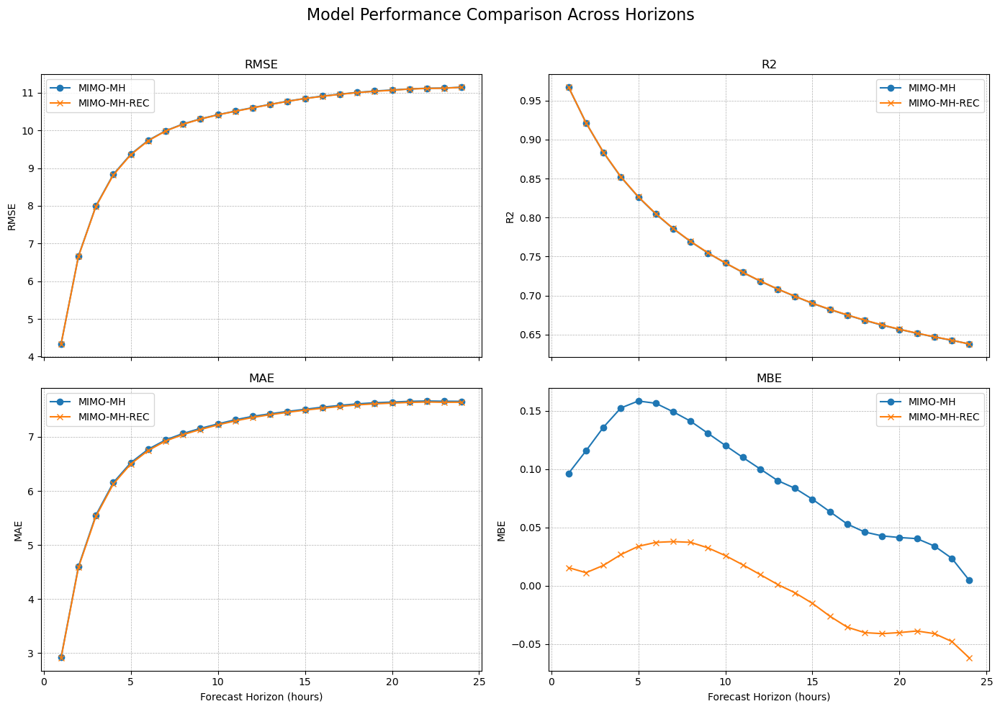

    - Generating Plot 2: Normalized Key Metrics Subplots (nRMSE, R2, nMAE, nMBE)...
Figure saved: figures/model_comparison_normalized_metrics.png


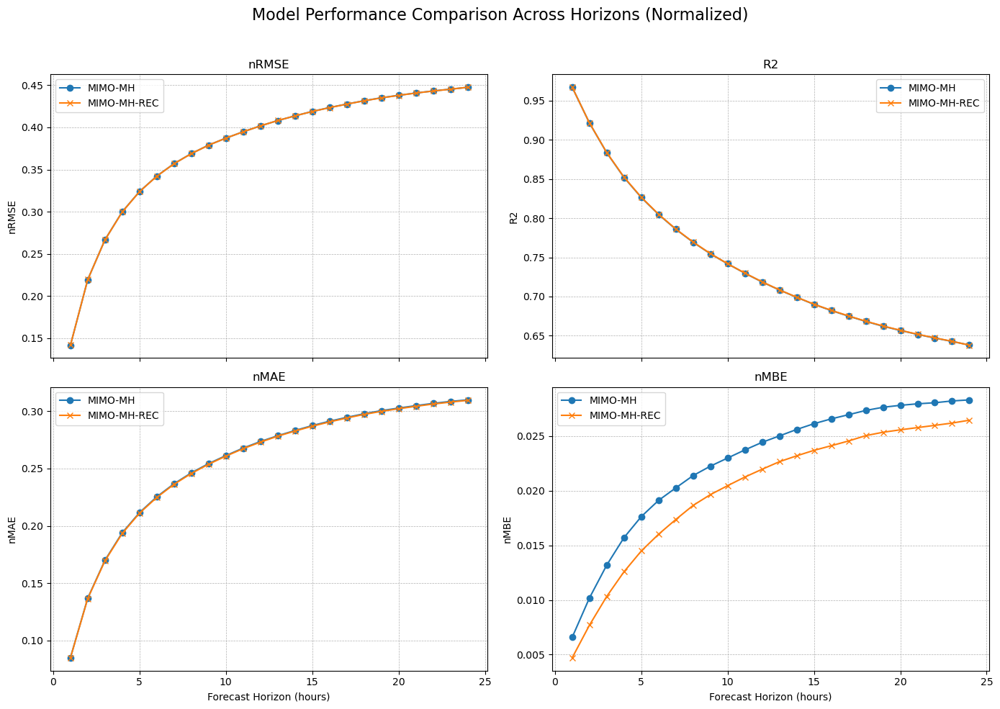

    - Generating Plot 3: Metrics by Energy Variable (Combined View)...
      - Plotting nRMSE...
Figure saved: figures/model_comparison_nrmse_by_variable.png


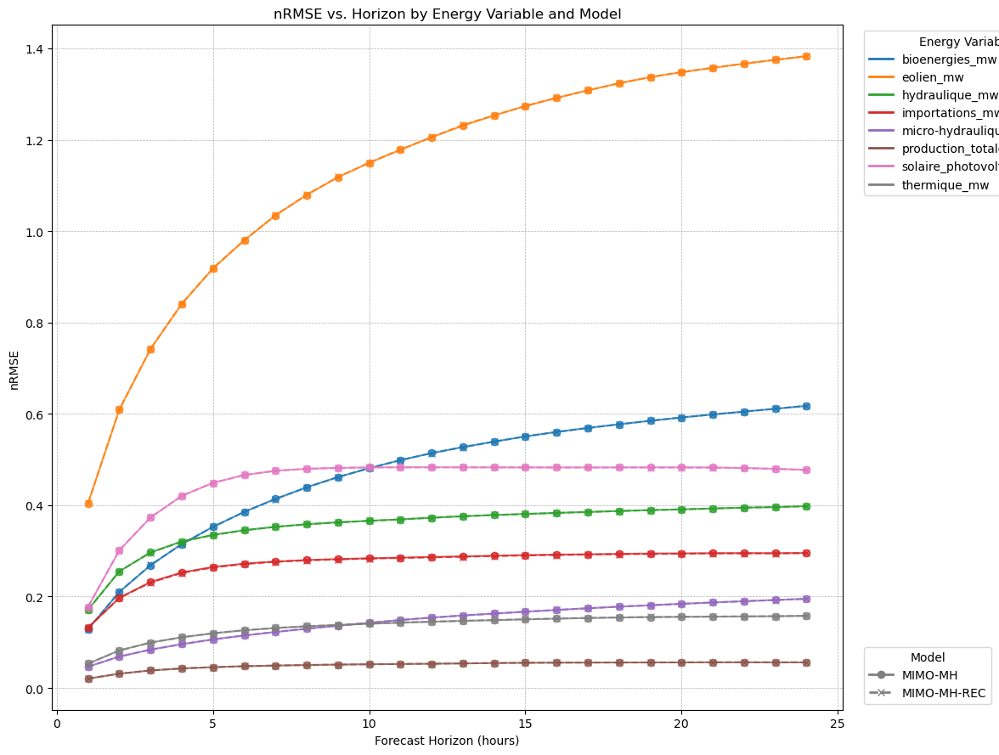

      - Plotting nMAE...
Figure saved: figures/model_comparison_nmae_by_variable.png


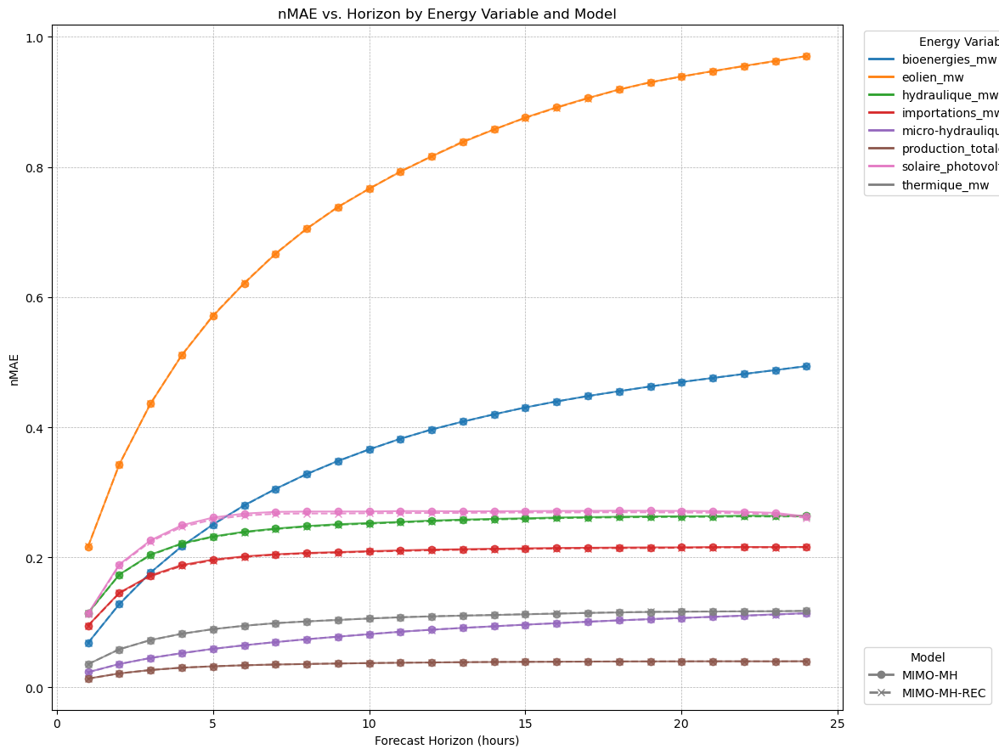

      - Plotting nMBE...
Figure saved: figures/model_comparison_nmbe_by_variable.png


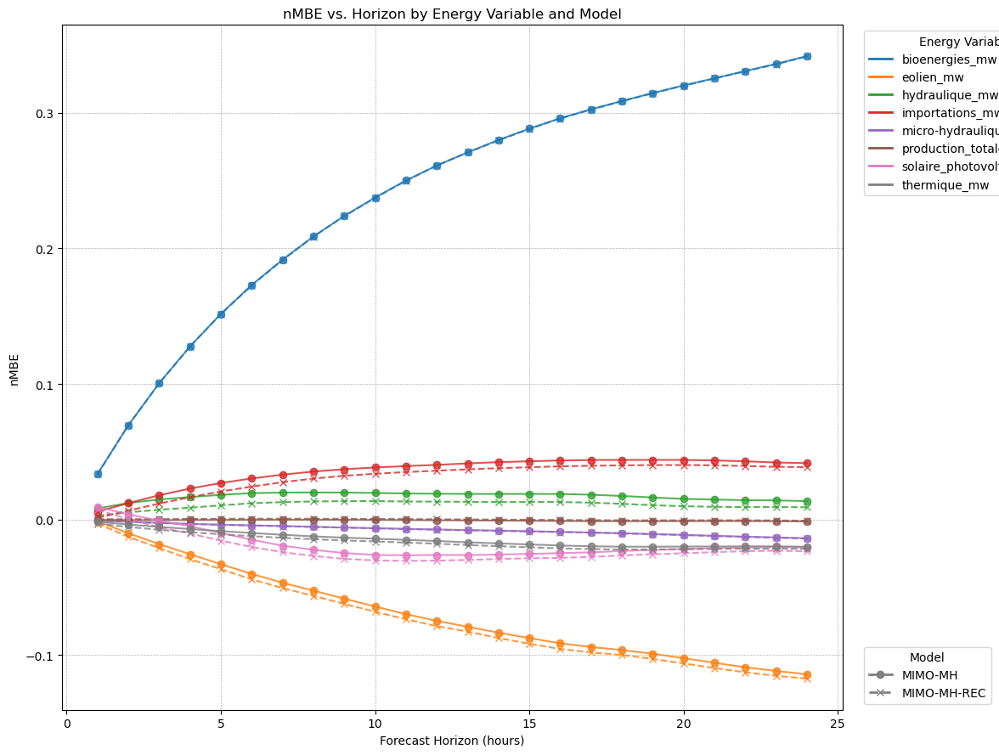

      - Plotting R2...
Figure saved: figures/model_comparison_r2_by_variable.png


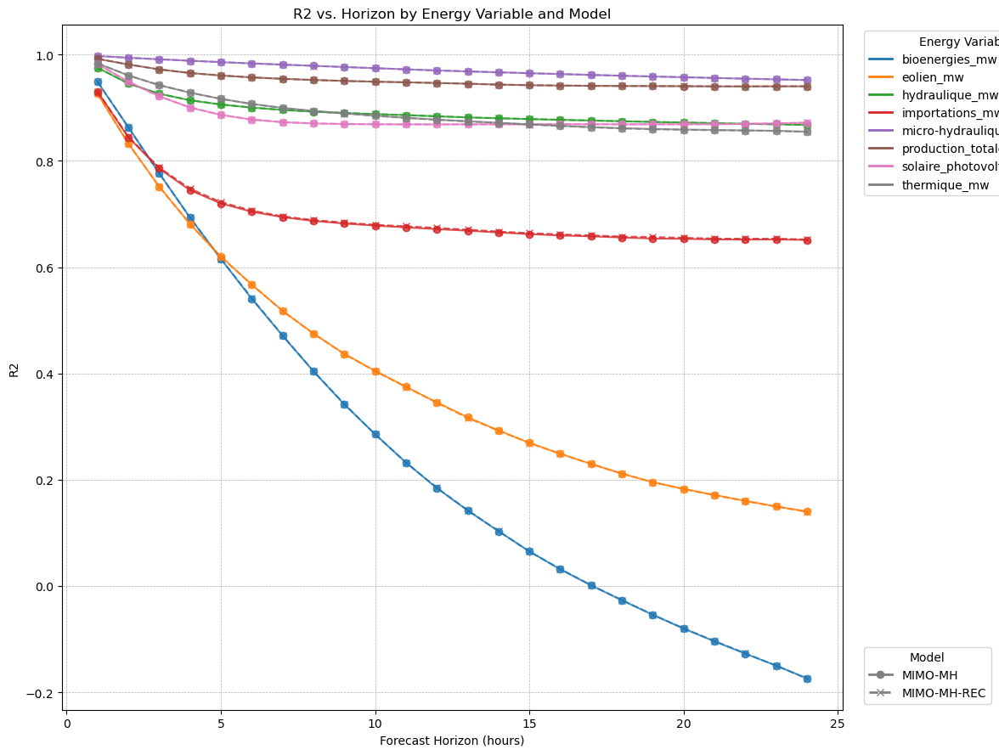

    - Generating Plot 4: Metrics by Energy Variable (Subplot View)...
      - Plotting nRMSE...
Figure saved: figures/nrmse_by_variable_subplots.png


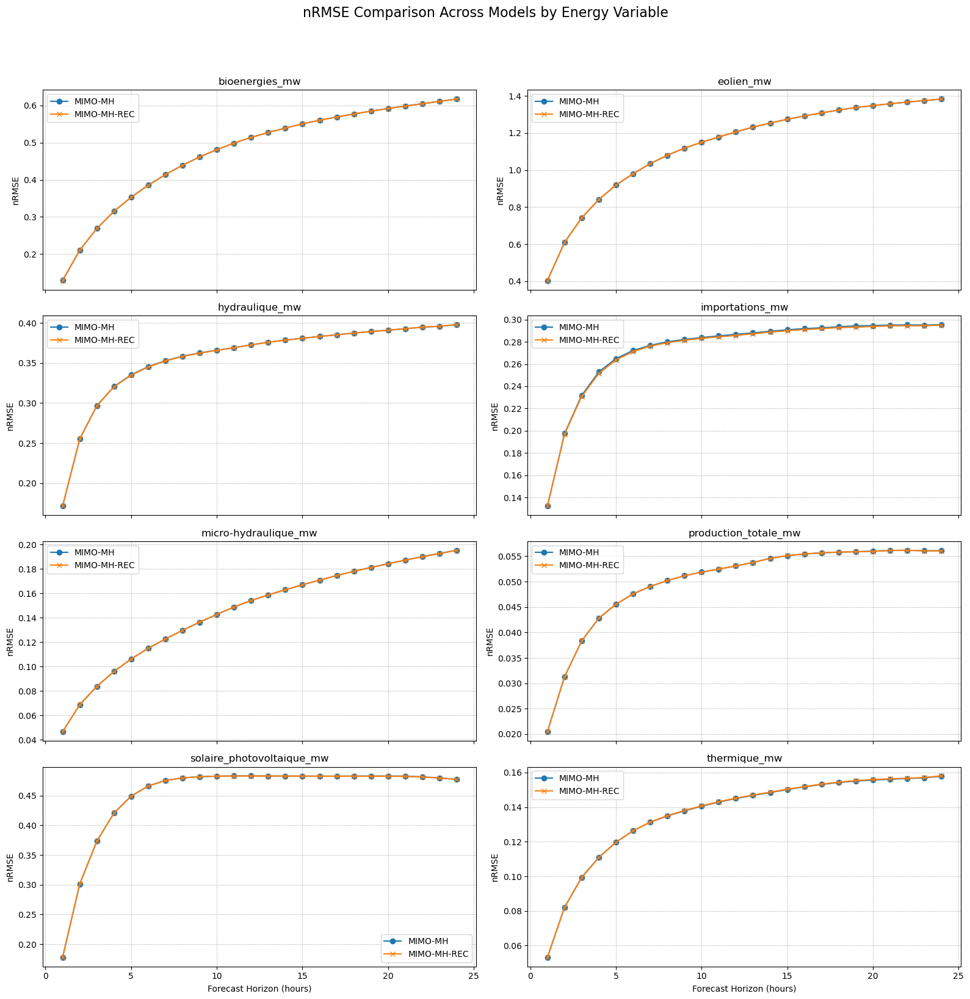

      - Plotting R2...
Figure saved: figures/r2_by_variable_subplots.png


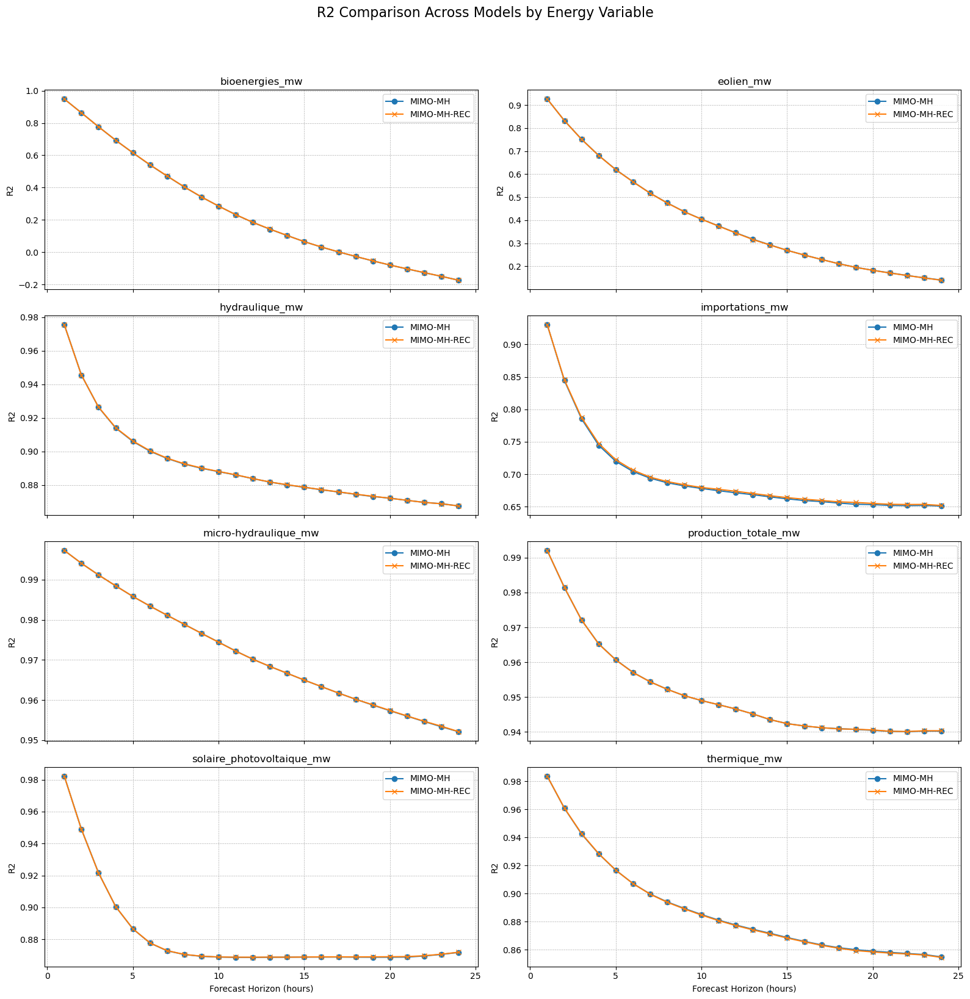

      - Plotting nMAE...
Figure saved: figures/nmae_by_variable_subplots.png


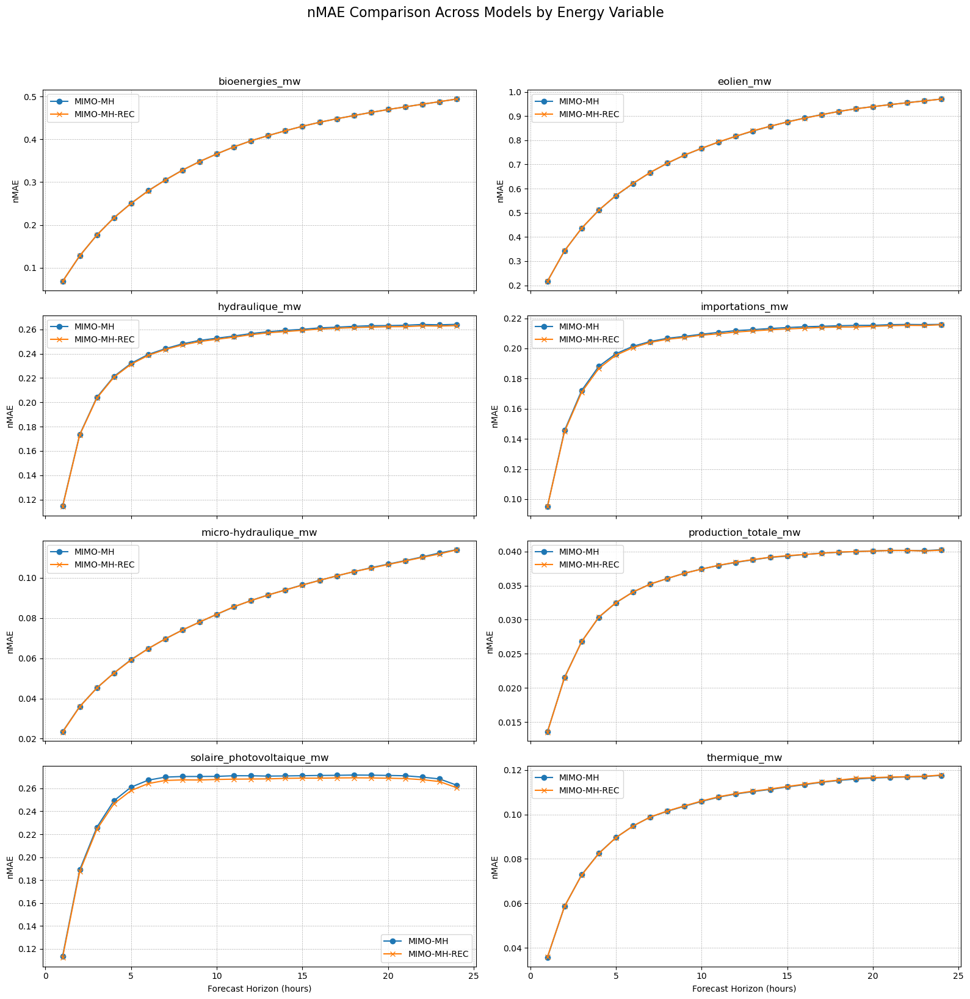

      - Plotting nMBE...
Figure saved: figures/nmbe_by_variable_subplots.png


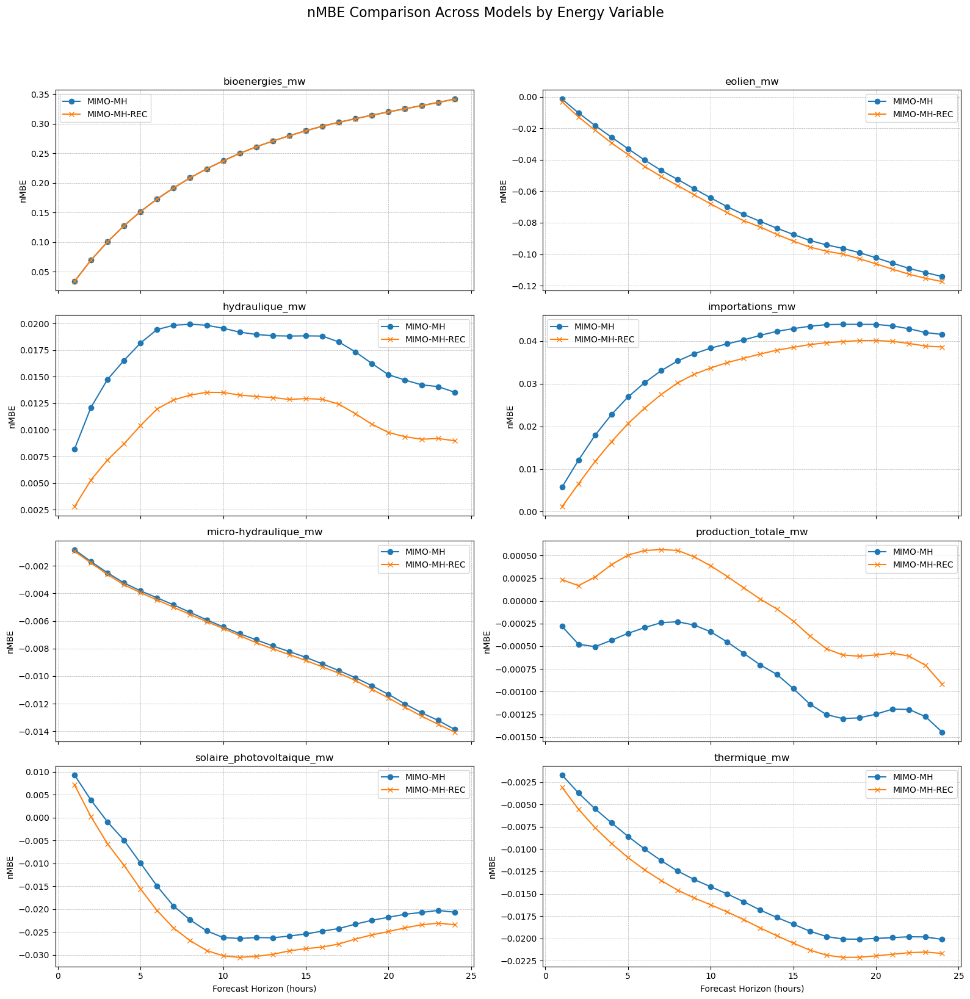

>>> [Step 5/5] Plot generation complete.



In [35]:
if __name__ == '__main__':
    main()


MODEL SELECTION MENU
--- Individual Models ---
 1 : Run SISO
 2 : Run MIMO
 3 : Run MIMO-MH

--- Reconciled (REC) Models Only ---
 4 : Run SISO-REC
 5 : Run MIMO-REC
 6 : Run MIMO-MH-REC

--- Combined Models (Base + Reconciled) ---
 7 : Run SISO (Base + REC)
 8 : Run MIMO (Base + REC)
 9 : Run MIMO-MH (Base + REC)
 10 : Run ALL ELM models (Base + REC)

--- External Models & Groups ---
 11 : Run Prophet + TimeGPT
 12 : Run ALL models (ELM Base + External)
 13 : Run ALL models (ELM REC + External)

--- Custom ---
 14 : Custom model selection


Please enter your choice (1-14):  10



HYPERPARAMETER CONFIGURATION


Enter the split date (YYYY-MM-DD) [default: 2021-01-01] (press Enter to use default):  
Enter the regularization lambda for ELM (e.g., 1e-6) [default: 0.0] (press Enter to use default):  0
Enter the number of hidden neurons for ELM [default: 1000] (press Enter to use default):  
Enter the number of initializations for ELM [default: 1] (press Enter to use default):  


Final configuration used:
  - Split date: 2021-01-01
  - Lambda: 0.0
  - Hidden neurons: 1000
  - Initializations: 1

>>> [Step 1/5] Loading and pre-processing data...
    - Duplicates aggregated by taking the mean.
    - Data loaded successfully: 61361 rows, 12 columns.
>>> [Step 1/5] Data loading complete.

>>> [Step 2/5] Running forecasting models...
    - Running SISO model...
    - SISO model finished.
    -> Execution time: 482.75 seconds.
    - Running SISO-REC model...
        - Applying reconciliation...
    - SISO-REC model finished.
    -> Execution time: 462.35 seconds.
    - Running MIMO model...
    - MIMO model finished.
    -> Execution time: 139.96 seconds.
    - Running MIMO-REC model...
        - Applying reconciliation...
    - MIMO-REC model finished.
    -> Execution time: 140.65 seconds.
    - Running MIMO-MH model...
    - MIMO-MH model finished.
    -> Execution time: 63.07 seconds.
    - Running MIMO-MH-REC model...
        - Applying reconciliation...
    - M

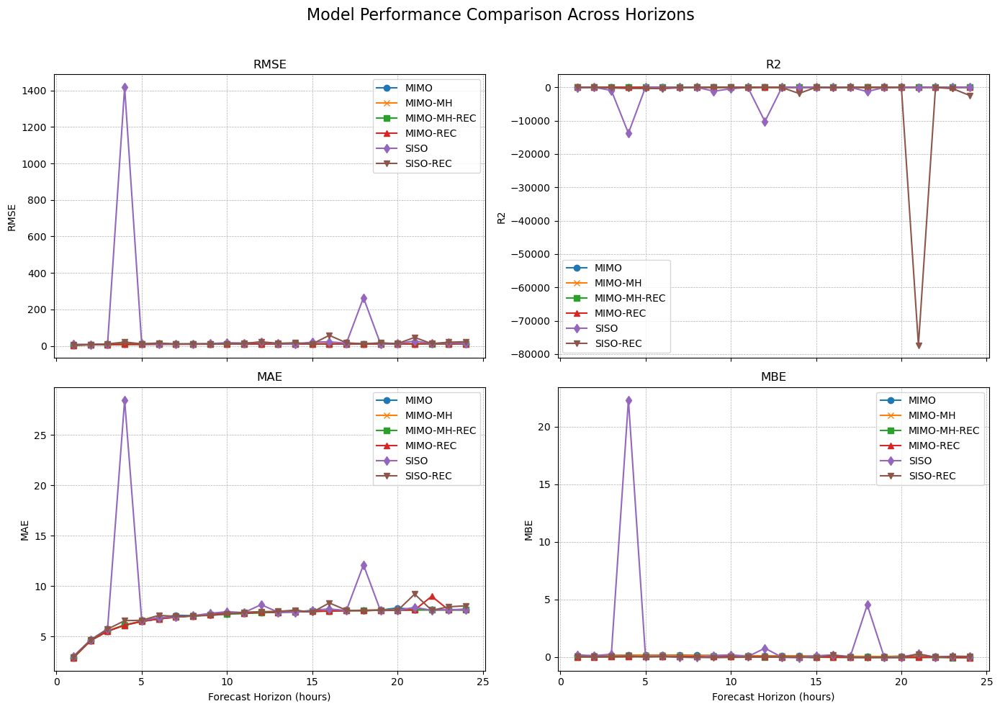

    - Generating Plot 2: Normalized Key Metrics Subplots (nRMSE, R2, nMAE, nMBE)...
Figure saved: figures/model_comparison_normalized_metrics.png


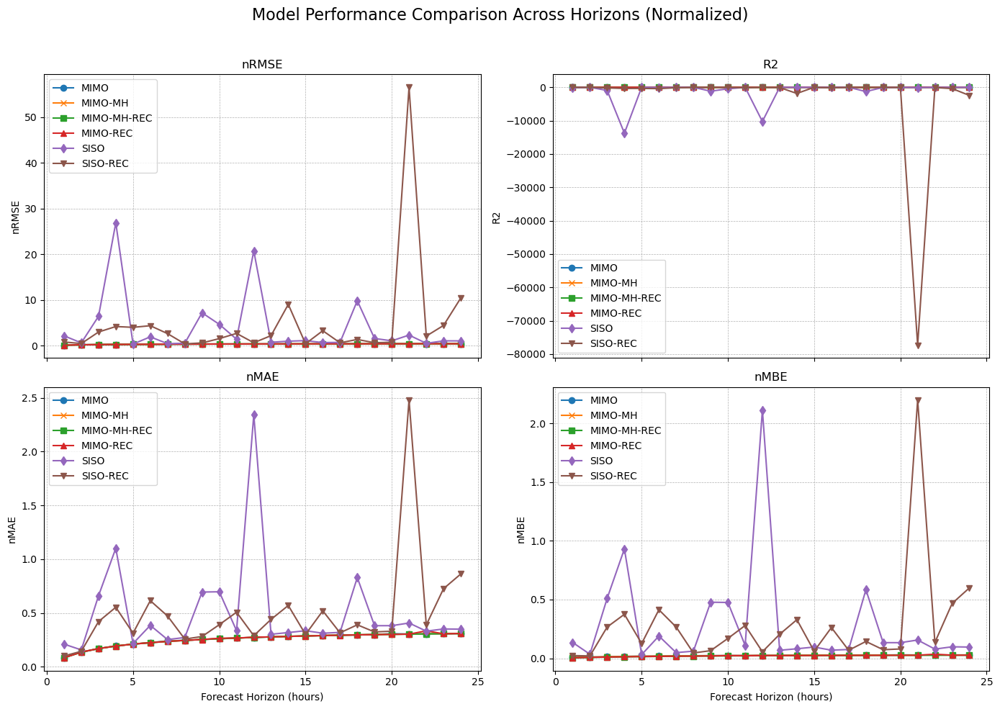

    - Generating Plot 3: Metrics by Energy Variable (Combined View)...
      - Plotting nRMSE...
Figure saved: figures/model_comparison_nrmse_by_variable.png


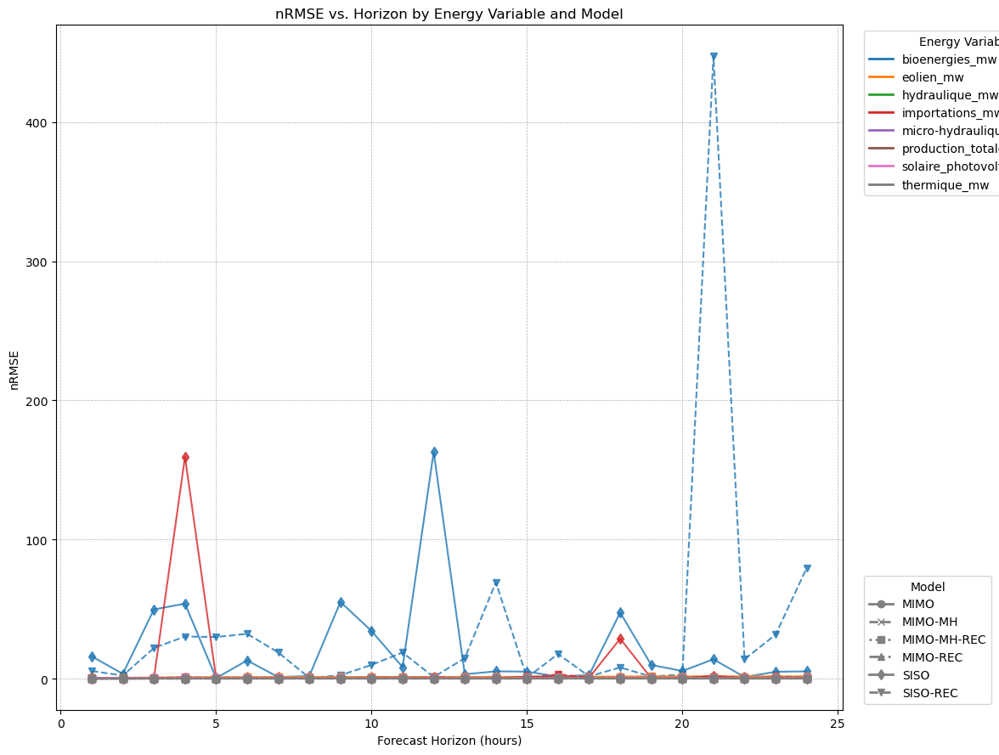

      - Plotting nMAE...
Figure saved: figures/model_comparison_nmae_by_variable.png


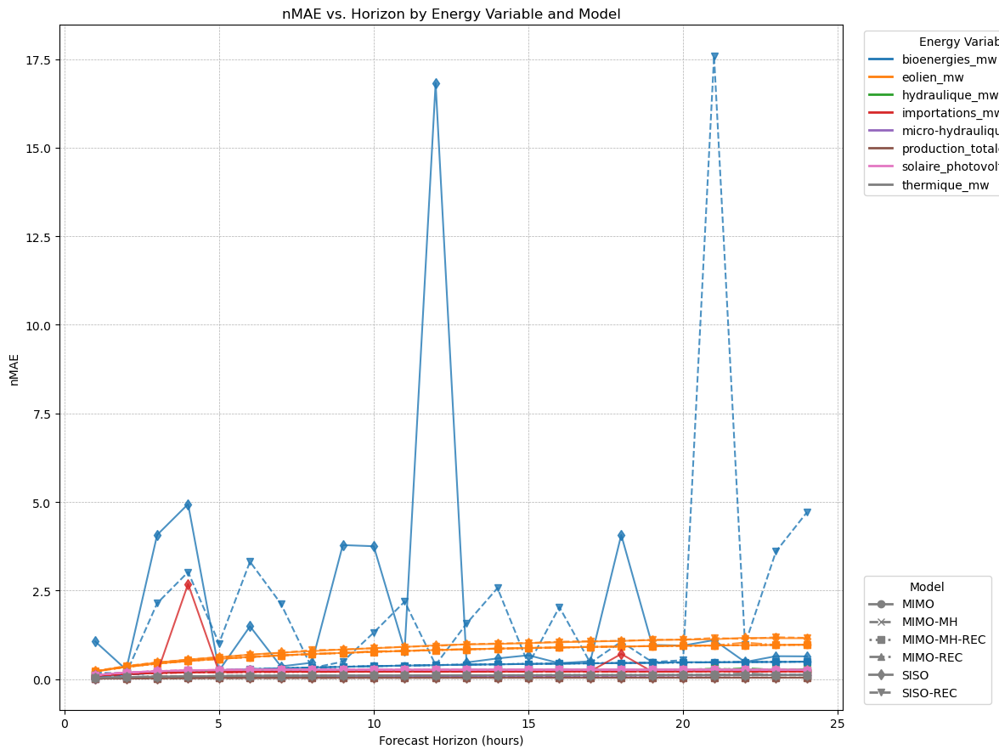

      - Plotting nMBE...
Figure saved: figures/model_comparison_nmbe_by_variable.png


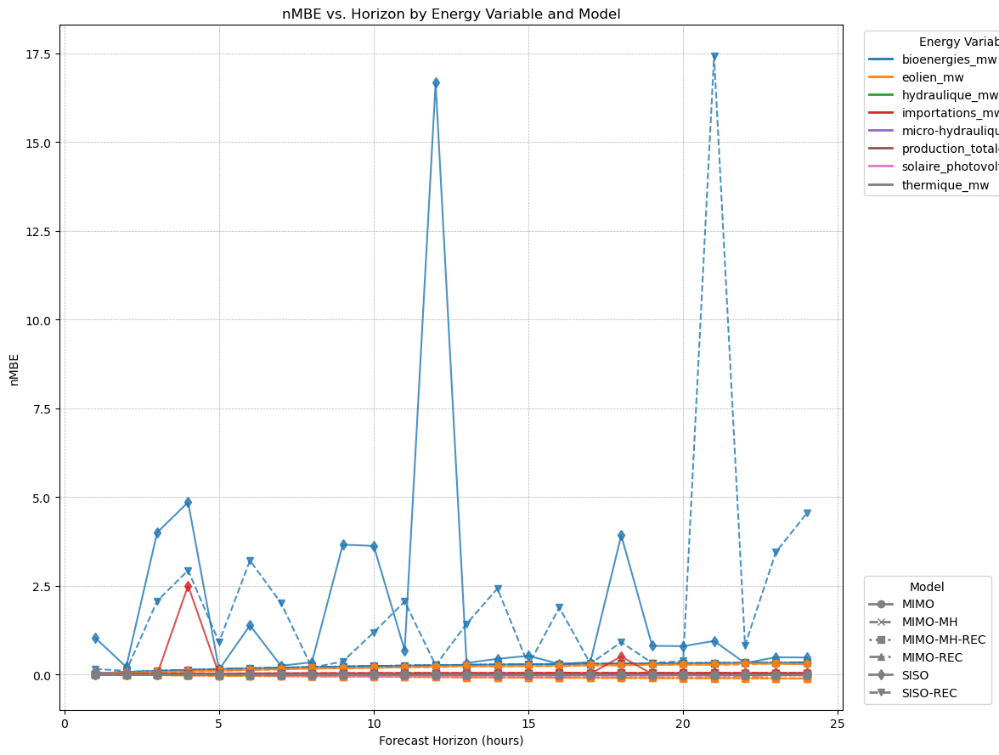

      - Plotting R2...
Figure saved: figures/model_comparison_r2_by_variable.png


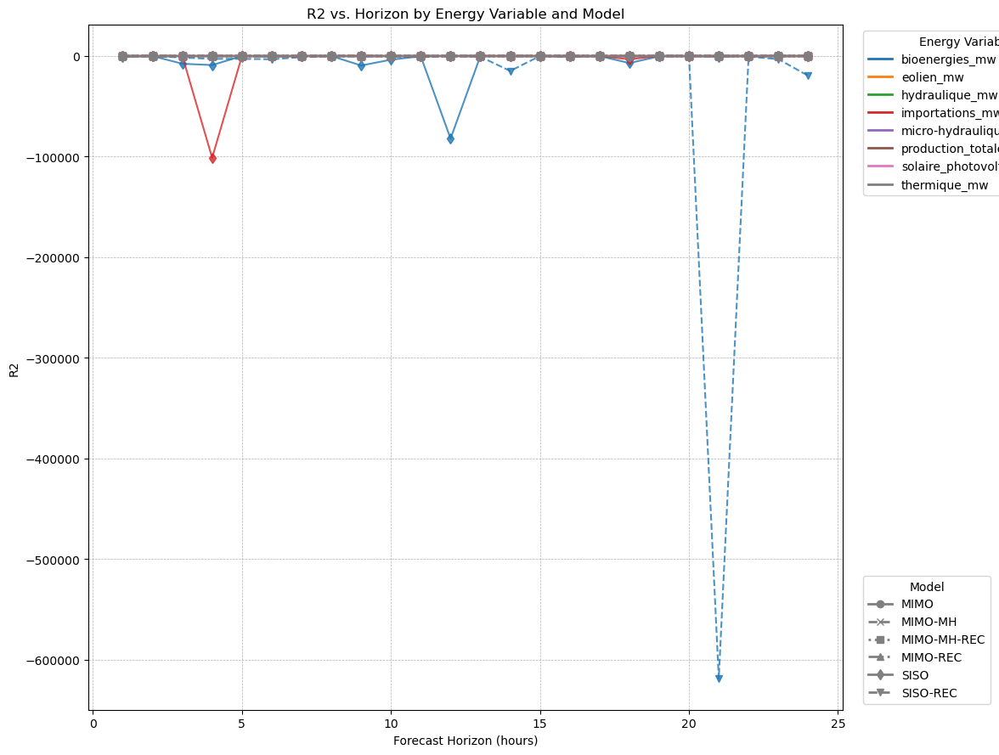

    - Generating Plot 4: Metrics by Energy Variable (Subplot View)...
      - Plotting nRMSE...
Figure saved: figures/nrmse_by_variable_subplots.png


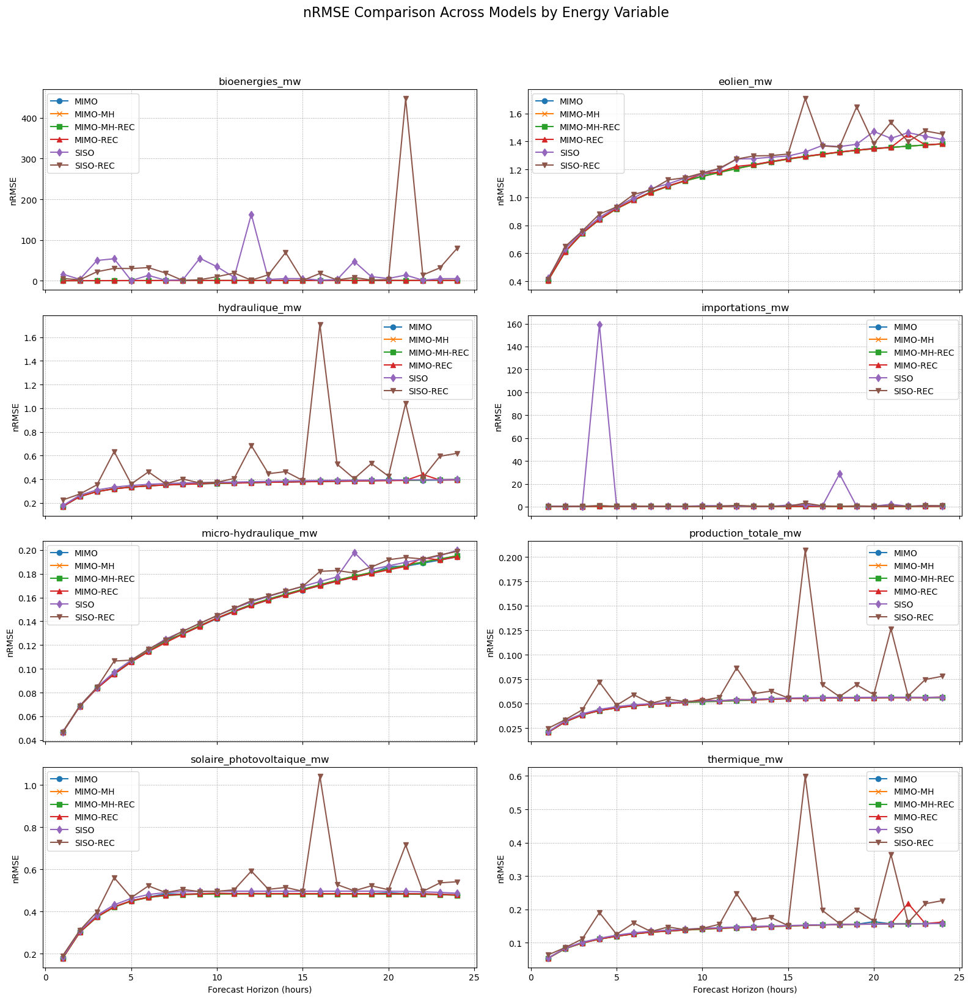

      - Plotting R2...
Figure saved: figures/r2_by_variable_subplots.png


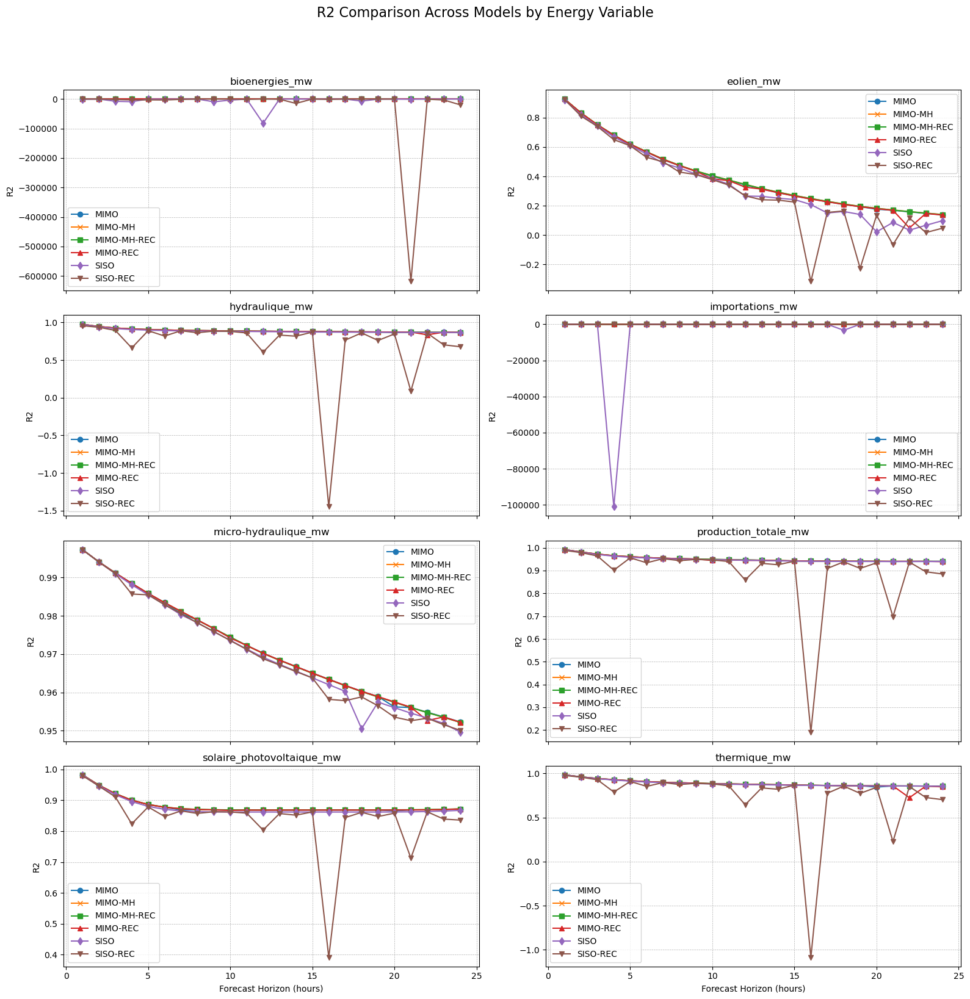

      - Plotting nMAE...
Figure saved: figures/nmae_by_variable_subplots.png


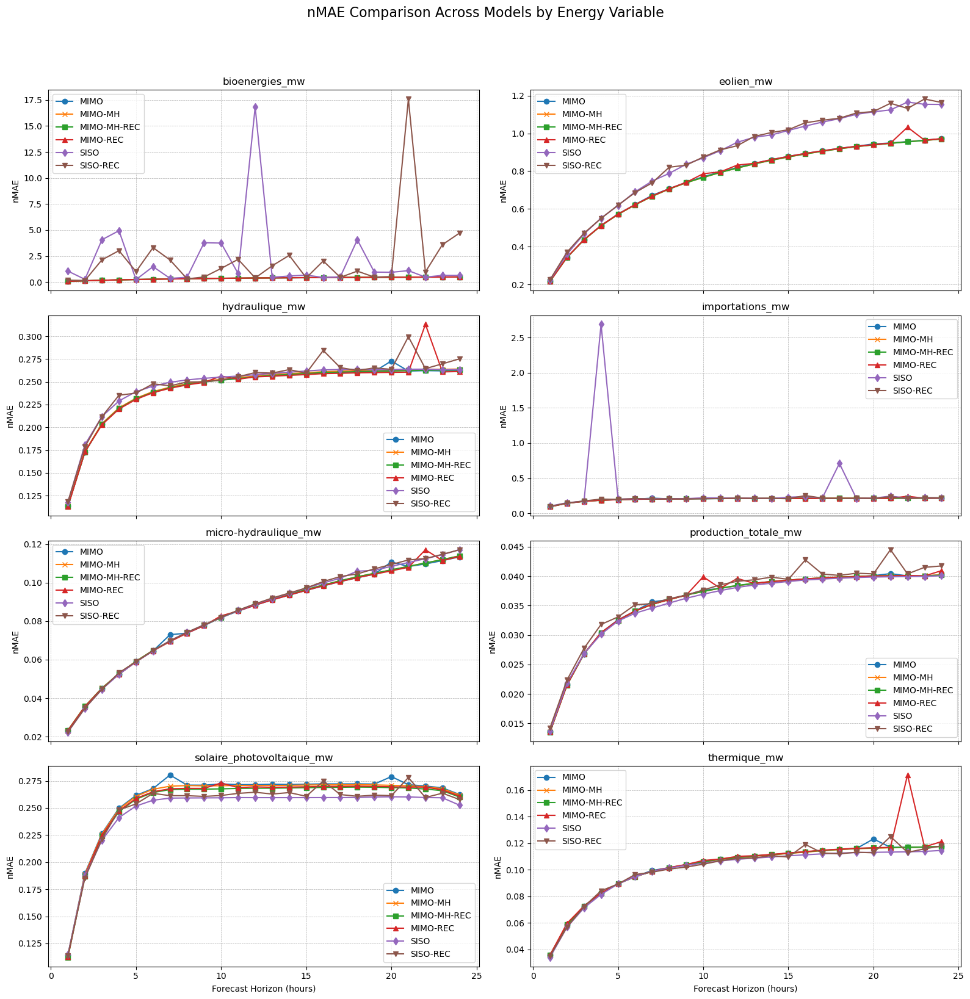

      - Plotting nMBE...
Figure saved: figures/nmbe_by_variable_subplots.png


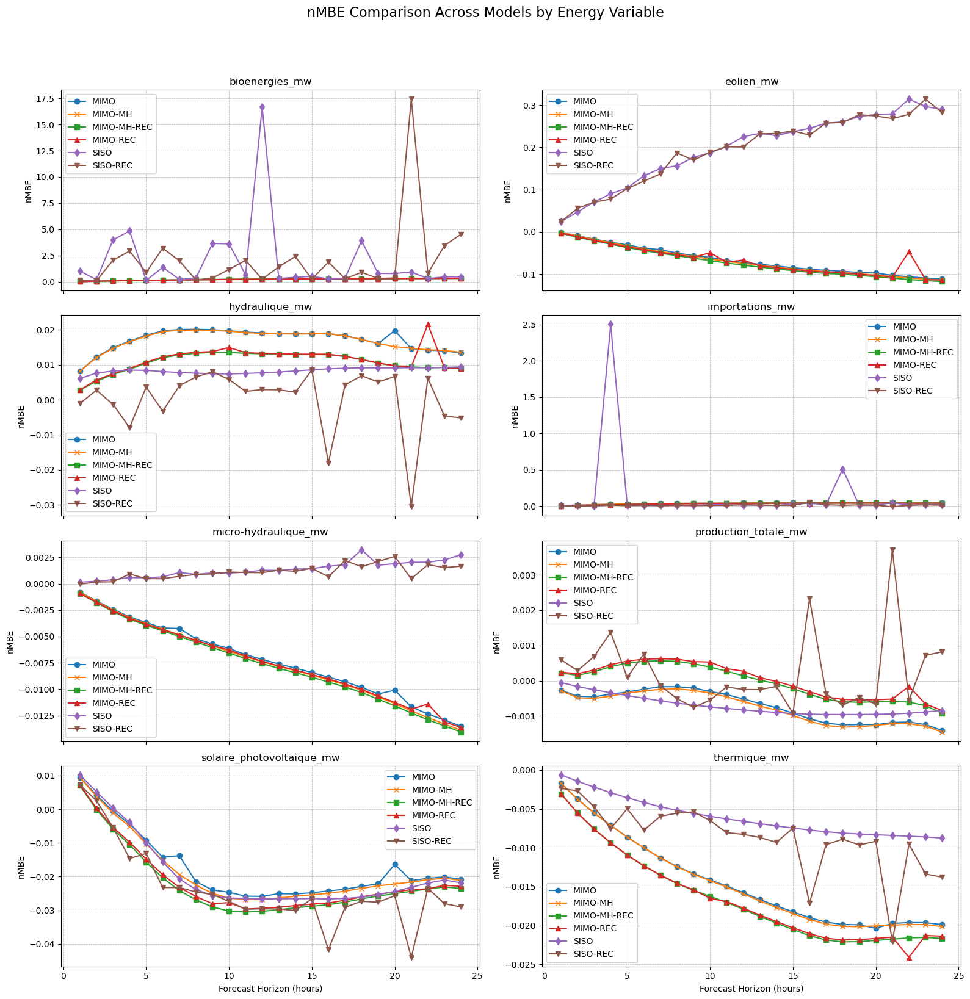

>>> [Step 5/5] Plot generation complete.



In [36]:
if __name__ == '__main__':
    main()